In [ ]:
!pip install --upgrade pip
!pip install hazm
!pip install googletrans==4.0.0-rc1
!pip install -q transformers
!pip install -q clean-text[gpl]
!pip install hezar

  Using cached pip-24.2-py3-none-any.whl.metadata (3.6 kB)
Using cached pip-24.2-py3-none-any.whl (1.8 MB)
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
  Preparing metadata (setup.py) ... done
ERROR: Operation cancelled by user
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 11.8 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

dataset_path = 'drive/MyDrive/datamining/dataset.csv'

Mounted at /content/drive


In [ ]:
import pandas as pd
import string
import re
import hazm
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from googletrans import Translator
from sklearn.preprocessing import StandardScaler
from numpy.random import uniform
from sklearn.datasets import make_blobs
import seaborn as sns
import random
from gensim.models import Word2Vec
from mpl_toolkits import mplot3d
from transformers import BertTokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN

## load dataset

In [ ]:
df = pd.read_csv(dataset_path)

In [ ]:
df

,id,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label
0,1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,این مقاله می‌کوشد با ارائه مدلی جامع از مولفه‌...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,مدیریت آموزشی و هدایت تحصیلی
1,2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,هدف این پژوهش بررسی تحولات رشته مدیریت آموزشی ...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,مدیریت آموزشی و هدایت تحصیلی
2,3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,پژوهش حاضر با هدف شناسایی و بررسی چالش‌های آمو...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,آموزش و سازماندهی دانشگاهی
3,4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,امروزه استقرار و توسعه زیست بوم کارآفرینی دانش...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,اشتغال و کارآفرینی
4,5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,هدف اصلی ايـن پـژوهش بررسـی ميـزان دلبسـتگی شـ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,مدیریت منابع انسانی و علوم رفتاری
...,...,...,...,...,...,...,...,...,...,...,...,...
152,156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,این مطالعه به دنبال تبیین ملاک‌ها و نشانگر‌‌ها...,زهرا گویا,Persian,\nبرنامه درسی ریاضی ، بنیان های منطقی یادگیری ...,0.0,896.0,0.0,1400.0,2244.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی
153,157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,\nتبیین چالش‌های اجرای ارزش‌یابی توصیفی برای د...,زهرا گویا,Persian,ارزشیابی توصیفی ، ریاضی ، دوره ابتدائی,0.0,355.0,1.0,1399.0,513.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی
154,158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,\nبررسی مباحث مالی در کتاب های درسی ریاضی دهه‌...,زهرا گویا,Persian,سواد مالی ، تصمیم گیری مالی ، ابزار مالی ، برن...,0.0,695.0,0.0,1399.0,1125.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی
155,159,تاثیر استفاده از راهبرد رسم شکل در حل مسائل کل...,هدف این پژوهش، بررسی تاثیر استفاده از راهبرد ر...,زهرا گویا,Persian,رسم شکل ، راهبرد حل مسئله ، شکل های شبکه ای ، ...,0.0,284.0,1.0,1398.0,843.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
df.set_index('id' , inplace = True)

In [ ]:
df

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label
id,,,,,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,این مقاله می‌کوشد با ارائه مدلی جامع از مولفه‌...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,مدیریت آموزشی و هدایت تحصیلی
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,هدف این پژوهش بررسی تحولات رشته مدیریت آموزشی ...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,مدیریت آموزشی و هدایت تحصیلی
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,پژوهش حاضر با هدف شناسایی و بررسی چالش‌های آمو...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,آموزش و سازماندهی دانشگاهی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,امروزه استقرار و توسعه زیست بوم کارآفرینی دانش...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,اشتغال و کارآفرینی
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,هدف اصلی ايـن پـژوهش بررسـی ميـزان دلبسـتگی شـ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,مدیریت منابع انسانی و علوم رفتاری
...,...,...,...,...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,این مطالعه به دنبال تبیین ملاک‌ها و نشانگر‌‌ها...,زهرا گویا,Persian,\nبرنامه درسی ریاضی ، بنیان های منطقی یادگیری ...,0.0,896.0,0.0,1400.0,2244.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,\nتبیین چالش‌های اجرای ارزش‌یابی توصیفی برای د...,زهرا گویا,Persian,ارزشیابی توصیفی ، ریاضی ، دوره ابتدائی,0.0,355.0,1.0,1399.0,513.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,\nبررسی مباحث مالی در کتاب های درسی ریاضی دهه‌...,زهرا گویا,Persian,سواد مالی ، تصمیم گیری مالی ، ابزار مالی ، برن...,0.0,695.0,0.0,1399.0,1125.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
print('data information', '\n')
print(df.info(), '\n')

# print missing values information
print('missing values stats')
print(df.isnull().sum(), '\n')

print('data shape')
print(df.shape)

data information 

<class 'pandas.core.frame.DataFrame'>
Index: 157 entries, 1 to 160
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   title           156 non-null    object 
 1   text            157 non-null    object 
 2   author          157 non-null    object 
 3   language        157 non-null    object 
 4   keywords        156 non-null    object 
 5   citation        153 non-null    float64
 6   download        153 non-null    float64
 7   hasDataset      154 non-null    float64
 8   published_year  156 non-null    float64
 9   visit           151 non-null    float64
 10  class_label     157 non-null    object 
dtypes: float64(5), object(6)
memory usage: 14.7+ KB
None 

missing values stats
title             1
text              0
author            0
language          0
keywords          1
citation          4
download          4
hasDataset        3
published_year    1
visit             6
class_label    

In [ ]:
df.describe()

,citation,download,hasDataset,published_year,visit
count,153.000000,153.000000,154.000000,156.000000,151.000000
mean,20.653595,646.104575,0.629870,1397.275641,1338.430464
std,125.337456,949.690498,0.484415,4.284366,1971.329580
min,0.000000,0.000000,0.000000,1381.000000,0.000000
25%,0.000000,149.000000,0.000000,1395.750000,241.500000
50%,0.000000,339.000000,1.000000,1398.000000,598.000000
75%,0.000000,693.000000,1.000000,1401.000000,1568.000000
max,955.000000,6101.000000,1.000000,1402.000000,14929.000000


In [ ]:
print('unique language')
print(df['language'].unique(), '\n')

print('unique author\n')
print(df['author'].unique(), '\n')
print(len(df['author'].unique()))

unique language
['Persian' 'En' ' Persian'] 

unique author

['فرنوش اعلامی' 'غلامرضا شمس' 'محمود ابوالقاسمی' 'محبوبه عارفی'
 'جمیله علم الهدی' 'محمد قهرمانی' 'محمد یمنی دوزی سرخابی'
 'رضا محمدی چابکی' 'مرتضی رضائی زاده' 'اسماعیل جعفری' 'نسیم اصغری'
 ' محمدرضا سرمدي' 'ابراهیم ریحانی' 'محمد رضا فدایی' 'اباصلت خراسانی'
 'کوروش فتحی' 'علی دلاور' 'علیرضا کیامنش' 'زهرا گویا'] 

19


### 0. convert type object to string

In [ ]:
df["title"] = df["title"].astype("string")
df["text"] = df["text"].astype("string")
df["author"] = df["author"].astype("string")
df["language"] = df["language"].astype("string")
df["keywords"] = df["keywords"].astype("string")
# df["citation"] = df["citation"].astype("int")
# df["download"] = df["download"].astype("int")
# df["hasDataset"] = df["hasDataset"].astype("int")
# df["published_year"] = df["published_year"].astype("int")
# df["visit"] = df["visit"].astype("int")
df["class_label"] = df["class_label"].astype("string")

In [ ]:
print('data information', '\n')
print(df.info(), '\n')

data information 

<class 'pandas.core.frame.DataFrame'>
Index: 157 entries, 1 to 160
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   title           156 non-null    string 
 1   text            157 non-null    string 
 2   author          157 non-null    string 
 3   language        157 non-null    string 
 4   keywords        156 non-null    string 
 5   citation        153 non-null    float64
 6   download        153 non-null    float64
 7   hasDataset      154 non-null    float64
 8   published_year  156 non-null    float64
 9   visit           151 non-null    float64
 10  class_label     157 non-null    string 
dtypes: float64(5), string(6)
memory usage: 14.7 KB
None 



### 1. translate to persian



In [ ]:
def translate_to_persian(text):
    translated_text = ''
    translator = Translator()
    for sentence in text.split('.'):
      # continue if sentece is empty
      if len(sentence.strip()) <= 1:
        continue
      translated_text += translator.translate(sentence, src='en', dest='fa').text + '. '
    return translated_text

In [ ]:
# example
translate_to_persian('Hello, How are you?')

'سلام حال شما چطور؟. '

In [ ]:
english_rows = df.loc[df['language'] == 'En']

In [ ]:
english_rows['text']

id
6      Aim and Introduction: Where, according to the ...
8      This study aimed to investigate the effect of ...
36     The current literature on flipped classrooms o...
63     Background and purpose: Hierarchical decision-...
64     The objective of this paper is to analytically...
65     The purpose of this paper is to investigate st...
66     Background & Objective: To ensure students res...
67     Since the merging of organizations and institu...
68     BACKGROUND AND OBJECTIVE: The development and ...
69     Background: The comprehensive evaluation progr...
70     What title one can give to Pierre Bourdieu? So...
71     Objectives: The current research has been carr...
72     In a scientific field such as a university, th...
73     This paper aims to study and structural pathol...
74     Regarding the fact that higher education is on...
75     The doctoral program plays an important role i...
76     The purpose of this study is to compare the of...
104    Objective: At present

In [ ]:
english_rows['title']

id
6           Lived experience of university startup teams
8      The effect of technology-based entrepreneurshi...
36     Identifying barriers to using flipped class in...
63     Function of Board of Trustees in Iranian State...
64     An Analytical Study of Aspects and Components ...
65     Looking for value through networked learning i...
66     Students Satisfaction of Thesis Conducting Pro...
67     An analysis of merging effects on academic cul...
68     Faculty development strategies based on the de...
69     The outcomes of faculty development based on e...
70     Reflection on academic activities at universit...
71     University Pedagogy: A Neglected Phenomenon in...
72     The Concept of Scientific Capital in the Acade...
73     Structural pathology of autonomous campus of T...
74     Functional pathology of autonomous campuses of...
75                       Doctoral Supervision Stylistics
76     Comparison of strategic planning documents in ...
104    Designing Strategy Ma

In [ ]:
len(english_rows['text'])

19

In [ ]:
english_rows['text'] = english_rows['text'].apply(translate_to_persian)

<ipython-input-19-71c09b36a05f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  english_rows['text'] = english_rows['text'].apply(translate_to_persian)


In [ ]:
df.loc[df['language'] == 'En', 'text'] = english_rows
english_rows

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label
id,,,,,,,,,,,
6,Lived experience of university startup teams,هدف و مقدمه: در جایی که ، به گفته دیده بان کار...,فرنوش اعلامی,En,دانشگاه استارتاپ نوا طرح دانشگاه شهید بهشتی,8.0,23.0,0.0,1401.0,262.0,اشتغال و کارآفرینی
8,The effect of technology-based entrepreneurshi...,این مطالعه با هدف بررسی تأثیر آموزش کارآفرینی ...,فرنوش اعلامی,En,آموزش کارآفرینی دانش آموزان کلاس ششم کار و فنا...,0.0,66.0,1.0,1402.0,0.0,اشتغال و کارآفرینی
36,Identifying barriers to using flipped class in...,ادبیات فعلی در مورد کلاسهای درس ، بینش محدودی ...,جمیله علم الهدی,En,چالش های آموزش عالی کلاس درس تحول,0.0,599.0,0.0,1399.0,1177.0,آموزش و سازماندهی دانشگاهی - کلاس معکوس
63,Function of Board of Trustees in Iranian State...,سابقه و هدف: نهادهای تصمیم گیری سلسله مراتبی د...,محمد یمنی دوزی سرخابی,En,هیئت امنا، دانشگاه علوم پزشکی، عملکرد,0.0,1012.0,0.0,1397.0,2945.0,آموزش و سازماندهی دانشگاهی
64,An Analytical Study of Aspects and Components ...,هدف از این مقاله ، مطالعه به صورت تحلیلی آثار ...,محمد یمنی دوزی سرخابی,En,تحقیقات نهادی، برنامه ریزی توسعه دانشگاه، مدیر...,0.0,218.0,1.0,1398.0,226.0,آموزش و سازماندهی دانشگاهی
65,Looking for value through networked learning i...,هدف از این مقاله بررسی استراتژی های شبکه های ا...,محمد یمنی دوزی سرخابی,En,یادگیری شبکه ای، استراتژی های شبکه، ایجاد ارزش...,4.0,209.0,1.0,1400.0,0.0,یادگیری شبکه‌ای
66,Students Satisfaction of Thesis Conducting Pro...,زمینه و هدف و هدف: اطمینان از کسب تجربه تحقیق ...,محمد یمنی دوزی سرخابی,En,رضایت، انجام پایان نامه، فرآیند دانشجو,0.0,93.0,1.0,1388.0,170.0,آموزش و سازماندهی دانشگاهی
67,An analysis of merging effects on academic cul...,از آنجا که ادغام سازمانها و نهادها تأثیرات غیر...,محمد یمنی دوزی سرخابی,En,ادغام فرهنگ دانشگاهی، دانشگاه شهید عباسپور، دا...,3.0,119.0,1.0,1397.0,142.0,آموزش و سازماندهی دانشگاهی
68,Faculty development strategies based on the de...,سابقه و هدف و هدف: برنامه توسعه و نوآوری در آم...,محمد یمنی دوزی سرخابی,En,توسعه، اعضای هیئت علمی، نوآوری، آموزش پزشکی، ا...,4.0,2542.0,1.0,1396.0,4899.0,آموزش و سازماندهی دانشگاهی


In [ ]:
english_rows['title'] = english_rows['title'].apply(translate_to_persian)

<ipython-input-21-89914dd21abd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  english_rows['title'] = english_rows['title'].apply(translate_to_persian)


In [ ]:
df.loc[df['language'] == 'En', 'title'] = english_rows
english_rows

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label
id,,,,,,,,,,,
6,تجربه زندگی تیم های راه اندازی دانشگاه.,هدف و مقدمه: در جایی که ، به گفته دیده بان کار...,فرنوش اعلامی,En,دانشگاه استارتاپ نوا طرح دانشگاه شهید بهشتی,8.0,23.0,0.0,1401.0,262.0,اشتغال و کارآفرینی
8,تأثیر آموزش کارآفرینی مبتنی بر فناوری بر توانم...,این مطالعه با هدف بررسی تأثیر آموزش کارآفرینی ...,فرنوش اعلامی,En,آموزش کارآفرینی دانش آموزان کلاس ششم کار و فنا...,0.0,66.0,1.0,1402.0,0.0,اشتغال و کارآفرینی
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,ادبیات فعلی در مورد کلاسهای درس ، بینش محدودی ...,جمیله علم الهدی,En,چالش های آموزش عالی کلاس درس تحول,0.0,599.0,0.0,1399.0,1177.0,آموزش و سازماندهی دانشگاهی - کلاس معکوس
63,عملکرد هیئت امنا در دانشگاه های علوم پزشکی ایا...,سابقه و هدف: نهادهای تصمیم گیری سلسله مراتبی د...,محمد یمنی دوزی سرخابی,En,هیئت امنا، دانشگاه علوم پزشکی، عملکرد,0.0,1012.0,0.0,1397.0,2945.0,آموزش و سازماندهی دانشگاهی
64,یک مطالعه تحلیلی از جنبه ها و مؤلفه های تحقیقا...,هدف از این مقاله ، مطالعه به صورت تحلیلی آثار ...,محمد یمنی دوزی سرخابی,En,تحقیقات نهادی، برنامه ریزی توسعه دانشگاه، مدیر...,0.0,218.0,1.0,1398.0,226.0,آموزش و سازماندهی دانشگاهی
65,به دنبال ارزش از طریق یادگیری شبکه ای در زمینه...,هدف از این مقاله بررسی استراتژی های شبکه های ا...,محمد یمنی دوزی سرخابی,En,یادگیری شبکه ای، استراتژی های شبکه، ایجاد ارزش...,4.0,209.0,1.0,1400.0,0.0,یادگیری شبکه‌ای
66,رضایت دانشجویان از فرآیند انجام پایان نامه و ع...,زمینه و هدف و هدف: اطمینان از کسب تجربه تحقیق ...,محمد یمنی دوزی سرخابی,En,رضایت، انجام پایان نامه، فرآیند دانشجو,0.0,93.0,1.0,1388.0,170.0,آموزش و سازماندهی دانشگاهی
67,تجزیه و تحلیل اثرات ادغام بر فرهنگ دانشگاهی.,از آنجا که ادغام سازمانها و نهادها تأثیرات غیر...,محمد یمنی دوزی سرخابی,En,ادغام فرهنگ دانشگاهی، دانشگاه شهید عباسپور، دا...,3.0,119.0,1.0,1397.0,142.0,آموزش و سازماندهی دانشگاهی
68,استراتژی های توسعه دانشکده بر اساس برنامه های ...,سابقه و هدف و هدف: برنامه توسعه و نوآوری در آم...,محمد یمنی دوزی سرخابی,En,توسعه، اعضای هیئت علمی، نوآوری، آموزش پزشکی، ا...,4.0,2542.0,1.0,1396.0,4899.0,آموزش و سازماندهی دانشگاهی


### remove duplicates

In [ ]:
df = df.dropna(subset=['title'])
df = df.dropna(subset=['text'])
df = df.dropna(subset=['keywords'])
df = df.dropna(subset=['class_label'])

df = df.drop_duplicates(subset=['title'], keep='first')

### 1.2 Add Title to text

#### translate english title and append to text column

In [ ]:
# translated_title = df.loc[df['language'] == 'En', 'title'].apply(translate_to_persian)
# translated_title

In [ ]:
# df.loc[df['language'] == 'En', 'text'] = translated_title +'\n'+ df.loc[df['language'] == 'En', 'text']
df.loc[df['language'] == 'En', 'text'] = df.loc[df['language'] == 'En', 'title'] +'\n'+ df.loc[df['language'] == 'En', 'text']


#### append Persian title to text

In [ ]:
df.loc[df['language'] == 'Persian', 'text'] = df.loc[df['language'] == 'Persian', 'title'] + '\n' + df.loc[df['language'] == 'Persian', 'text']

#### show dataset

In [ ]:
df

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label
id,,,,,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,مدیریت آموزشی و هدایت تحصیلی
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیف...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,مدیریت آموزشی و هدایت تحصیلی
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,آموزش و سازماندهی دانشگاهی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,اشتغال و کارآفرینی
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,مدیریت منابع انسانی و علوم رفتاری
...,...,...,...,...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,Persian,برنامه درسی ریاضی ، بنیان های منطقی یادگیری ر...,0.0,896.0,0.0,1400.0,2244.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,Persian,ارزشیابی توصیفی ، ریاضی ، دوره ابتدائی,0.0,355.0,1.0,1399.0,513.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,Persian,سواد مالی ، تصمیم گیری مالی ، ابزار مالی ، برن...,0.0,695.0,0.0,1399.0,1125.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی


### 2. remove punctuation


In [ ]:
perms = [                                                   ".", "!", "#", "\"", "(",
                                                            ")", "*", ",",  "-", ".",
                                                            "/", ":", "[",  "]","«",
                                                            "»", "،","؛", "؟", '?', ',', '@',
                                                            '#', '$', '%', '^', '&', '*', '_',
                                                            '-', '+', '=', ']', '[', '{', '}', '~', '`', '|' ]
def remove_punctuation(text):
    punctuation_one = text
    for per in perms+list(string.punctuation):
      punctuation_one = punctuation_one.replace(per, ' ')
    return punctuation_one

In [ ]:
remove_punctuation('سلام. خوبی؟ چخبرا-خوبی-بسی . ')

'سلام  خوبی  چخبرا خوبی بسی   '

In [ ]:
df['cleaned_text'] = df['text'].apply(lambda x: remove_punctuation(x))

In [ ]:
df['cleaned_title'] = df['title'].apply(lambda x: remove_punctuation(x))

In [ ]:
df['cleaned_keywords'] = df['keywords'].apply(lambda x: remove_punctuation(x))

In [ ]:
# translated_title
df.loc[df['language'] == 'En', 'title']

id
6               تجربه زندگی تیم های راه اندازی دانشگاه. 
8      تأثیر آموزش کارآفرینی مبتنی بر فناوری بر توانم...
36     شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...
63     عملکرد هیئت امنا در دانشگاه های علوم پزشکی ایا...
64     یک مطالعه تحلیلی از جنبه ها و مؤلفه های تحقیقا...
65     به دنبال ارزش از طریق یادگیری شبکه ای در زمینه...
66     رضایت دانشجویان از فرآیند انجام پایان نامه و ع...
67         تجزیه و تحلیل اثرات ادغام بر فرهنگ دانشگاهی. 
68     استراتژی های توسعه دانشکده بر اساس برنامه های ...
69     نتایج توسعه دانشکده بر اساس برنامه تکامل و نوآ...
70     تأمل در فعالیت های دانشگاهی در دانشگاه ها از د...
71     آموزش دانشگاه: یک پدیده غفلت شده در سیستم آموز...
72     مفهوم سرمایه علمی در زمینه دانشگاهی: چشم انداز...
73     آسیب شناسی ساختاری پردیس خودمختار دانشگاههای د...
74     آسیب شناسی عملکردی پردیس های خودمختار دانشگاه ...
75                               سبک شناسی نظارت دکتری. 
76     مقایسه اسناد برنامه ریزی استراتژیک در دانشگاه ...
104    طراحی نقشه استراتژی و

In [ ]:
df

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label,cleaned_text,cleaned_title,cleaned_keywords
id,,,,,,,,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,مدیریت آموزشی و هدایت تحصیلی,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیف...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,مدیریت آموزشی و هدایت تحصیلی,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیف...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,آموزش و سازماندهی دانشگاهی,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,اشتغال و کارآفرینی,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,مدیریت منابع انسانی و علوم رفتاری,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,Persian,برنامه درسی ریاضی ، بنیان های منطقی یادگیری ر...,0.0,896.0,0.0,1400.0,2244.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,\nبرنامه درسی ریاضی بنیان های منطقی یادگیری ...
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,Persian,ارزشیابی توصیفی ، ریاضی ، دوره ابتدائی,0.0,355.0,1.0,1399.0,513.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,ارزشیابی توصیفی ریاضی دوره ابتدائی
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,Persian,سواد مالی ، تصمیم گیری مالی ، ابزار مالی ، برن...,0.0,695.0,0.0,1399.0,1125.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,سواد مالی تصمیم گیری مالی ابزار مالی برن...


In [ ]:
def preprocess(text):
    text = text.lower()
    text=text.strip()
    text=re.compile('<.*?>').sub('', text)
    text = re.compile('[%s]' % re.escape(string.punctuation)).sub(' ', text)
    text = re.sub('\s+', ' ', text)
    text = re.sub(r'\[[0-9]*\]',' ',text)
    text=re.sub(r'[^\w\s]', '', str(text).lower().strip())
    text = re.sub(r'\d',' ',text)
    text = re.sub(r'\s+',' ',text)
    return text

In [ ]:
df['preprocessed_text']= df['cleaned_text'].apply(lambda x:preprocess(x))
df['preprocessed_title']= df['cleaned_title'].apply(lambda x:preprocess(x))
df['preprocessed_keywords']= df['cleaned_keywords'].apply(lambda x:preprocess(x))

In [ ]:
df

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label,cleaned_text,cleaned_title,cleaned_keywords,preprocessed_text,preprocessed_title,preprocessed_keywords
id,,,,,,,,,,,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,مدیریت آموزشی و هدایت تحصیلی,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیف...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,مدیریت آموزشی و هدایت تحصیلی,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیف...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,آموزش و سازماندهی دانشگاهی,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,چالشهای آموزشی چالشهای پژوهشی چالشهای سازمانی ...
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,اشتغال و کارآفرینی,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,مدیریت منابع انسانی و علوم رفتاری,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید ب...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,Persian,برنامه درسی ریاضی ، بنیان های منطقی یادگیری ر...,0.0,896.0,0.0,1400.0,2244.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,\nبرنامه درسی ریاضی بنیان های منطقی یادگیری ...,تاملی در مولفههای برنامه درسی ریاضی مدرسه ای ا...,تاملی در مولفههای برنامه درسی ریاضی مدرسه ای ا...,برنامه درسی ریاضی بنیان های منطقی یادگیری ریاض...
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,Persian,ارزشیابی توصیفی ، ریاضی ، دوره ابتدائی,0.0,355.0,1.0,1399.0,513.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,ارزشیابی توصیفی ریاضی دوره ابتدائی,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,ارزشیابی توصیفی ریاضی دوره ابتدائی
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,ارتقای سواد مالی و تصمیم‌گیری ما

### 3. remove url

In [ ]:
url_pattern = re.compile(r'https?://\S+')

def sub_url(text):
    return url_pattern.sub('', text)

In [ ]:
df['suburl_text'] = df['preprocessed_text'].apply(sub_url)
df['suburl_title'] = df['preprocessed_title'].apply(sub_url)
df['suburl_keywords'] = df['preprocessed_keywords'].apply(sub_url)

In [ ]:
df

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,class_label,cleaned_text,cleaned_title,cleaned_keywords,preprocessed_text,preprocessed_title,preprocessed_keywords,suburl_text,suburl_title,suburl_keywords
id,,,,,,,,,,,,,,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,مدیریت آموزشی و هدایت تحصیلی,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیف...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,مدیریت آموزشی و هدایت تحصیلی,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیف...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,آموزش و سازماندهی دانشگاهی,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,چالشهای آموزشی چالشهای پژوهشی چالشهای سازمانی ...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,چالشهای آموزشی چالشهای پژوهشی چالشهای سازمانی ...
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,اشتغال و کارآفرینی,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,مدیریت منابع انسانی و علوم رفتاری,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید ب...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید ب...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,Persian,برنامه درسی ریاضی ، بنیان های منطقی یادگیری ر...,0.0,896.0,0.0,1400.0,2244.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی

In [ ]:
df.to_csv('drive/MyDrive/datamining/data1.csv')

In [ ]:
df = pd.read_csv('drive/MyDrive/datamining/data1.csv')

In [ ]:
df

,id,title,text,author,language,keywords,citation,download,hasDataset,published_year,...,class_label,cleaned_text,cleaned_title,cleaned_keywords,preprocessed_text,preprocessed_title,preprocessed_keywords,suburl_text,suburl_title,suburl_keywords
0,1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,...,مدیریت آموزشی و هدایت تحصیلی,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور
1,2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیف...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,...,مدیریت آموزشی و هدایت تحصیلی,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیف...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...
2,3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,...,آموزش و سازماندهی دانشگاهی,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی پژوهشی و سازمانی اعضای...,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,چالشهای آموزشی چالشهای پژوهشی چالشهای سازمانی ...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,چالشهای آموزشی چالشهای پژوهشی چالشهای سازمانی ...
3,4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,...,اشتغال و کارآفرینی,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...
4,5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,...,مدیریت منابع انسانی و علوم رفتاری,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید ب...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید ب...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,Persian,\nبرنامه درسی ریاضی ، بنیان های منطقی یادگیری ...,0.0,896.0,0.0,1400.0,...,مدیریت آموزشی و هدایت تحصیلی - ریاضی,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,\nب

### normalize dataset

In [ ]:
from hazm import Normalizer, Stemmer, Lemmatizer
# import dadmatools

normalizer = Normalizer()
# stemmer = Stemmer()
lemmatizer = Lemmatizer()

In [ ]:
df['suburl_text'] = df['suburl_text'].apply(normalizer.normalize)
df['suburl_title'] = df['suburl_title'].apply(normalizer.normalize)
df['suburl_keywords'] = df['suburl_keywords'].apply(normalizer.normalize)

In [ ]:
# df['suburl_text'] = df['suburl_text'].apply(stemmer.stem)
# df['suburl_title'] = df['suburl_title'].apply(stemmer.stem)
# df['suburl_keywords'] = df['suburl_keywords'].apply(stemmer.stem)

In [ ]:
# df['suburl_text'] = df['suburl_text'].apply(lemmatizer.lemmatize)
# df['suburl_title'] = df['suburl_title'].apply(lemmatizer.lemmatize)
# df['suburl_keywords'] = df['suburl_keywords'].apply(lemmatizer.lemmatize)

### 5. read persian stopwords

In [ ]:
stopwords_path = 'drive/MyDrive/datamining/persian.txt'
with open(stopwords_path, 'r', encoding='utf-8') as file:
    content = file.read()
content = content.replace('\n', ',')

In [ ]:
custom_list = ['مي', '‌شده', '‌تر', '‌ترین', '‌ها', '‌یافته', '‌داده', '‌اند','اي', '‌ای', '‌یی','‌سه', '‌دو', '‌ده', '‌آموز', '‌گیر','‌گیرد',
               '‌ریزی', '‌ریزش', '‌ریزد', '‌های', '‌گیری', 'های', 'ها', 'ای', 'های', 'شد', 'بود', 'زا', 'زای', 'های', 'کنندگان', 'کننده', 'ات', 'ان',
               'ای', 'ال', 'انی', 'گیران', 'گیری', 'برون', 'درون', 'بیرون', 'نیمه', 'پذیری', 'پذیر', 'پژوهی', 'پژوه', 'هم', 'وار', 'واری', 'یابی', 'آوری', 'اوری', 'یافته',
               'گذاری', 'گذار', 'آمدی', 'آمد', 'ریزی', 'ریزان', 'ریزین', 'هر', 'مند', 'ورز', 'ورزی', 'دار', 'داری', 'شد', 'کرد', 'ده', 'بود', 'گير', 'گیر', 'هاي', 'گيری', 'گیری', 'گيري', 'گیري']
persian_list = content.split(',') + custom_list
persian_list

['يكديگر',
 'اری',
 'ديروز',
 'شوی',
 'نخواهند',
 'دارد',
 'چقدر',
 'چگونه',
 'نخواهید',
 'استفاد',
 'گفتند',
 'او',
 'چیز',
 'اي',
 'اينكه',
 'ولی',
 'ام',
 'ان',
 'دریغ',
 'هرگز',
 'توانم',
 'بین',
 'علیه',
 'جریان',
 'یافتیم',
 'طي',
 'خواهم',
 'كنيد',
 'ّه',
 'گروهي',
 'کردی',
 'جا',
 'كند',
 'گوییم',
 'جريان',
 'هر',
 'بالایِ',
 'گاهی',
 'آنجا',
 'خواستیم',
 'ها',
 'خودشان',
 'هیچ',
 'خواهید',
 'احتراما',
 'پس',
 'بکن',
 'کجاست',
 'نيست',
 'کجا',
 'سپس',
 'داشتند',
 'نخستين',
 'بگوید',
 'زود',
 'یابند',
 'رسما',
 'مانندِ',
 'گرفتی',
 'کنند',
 'چطور',
 'و',
 'نبايد',
 'براي',
 'یابد',
 'ناگهان',
 'داریم',
 'بارها',
 'خارجِ',
 'شوید',
 'باشيم',
 'نباید',
 'گویم',
 'انقدر',
 'چندین',
 'امروزه',
 'ساخته',
 'ضدِّ',
 'گفتی',
 'كردند',
 'باشد',
 'برداري',
 'باره',
 'خویشتن',
 'قصدِ',
 'گیریم',
 'چرا',
 'نمی\u200cشود',
 'بهترين',
 'شدی',
 'دهید',
 'هنگام',
 'مي',
 'جمعا',
 'زیرِ',
 'ضمن',
 'خواهيم',
 'آنطور',
 'نمي',
 'همیشه',
 'نیز',
 'آی',
 'راه',
 'بگویند',
 'داشتید',
 'بزرگ',
 'انکه',

### remove stopwords

In [ ]:
def stopword(word_list):
    word_list = word_list.split()
    return ' '.join([word.strip() for word in word_list if word.strip() not in persian_list])

In [ ]:
stopword('"شناسایی اثربخشی استفاده از بازی های رایانه ای در ارتقای یادگیری کلاس معکوس مقطع ابتدایی"')

'"شناسایی اثربخشی رایانه ارتقای یادگیری کلاس معکوس مقطع ابتدایی"'

In [ ]:
df['suburl_text'] = df['suburl_text'].apply(stopword)
df['suburl_title'] = df['suburl_title'].apply(stopword)
df['suburl_keywords'] = df['suburl_keywords'].apply(stopword)

### 4. Tokenization

In [ ]:
def n_gram(n=2, tokens=[]):
  toks = []
  for i in range(0, len(tokens)):
    arr = []
    for j in range(0, len(tokens.iloc[i])-1):
      new_token = tokens.iloc[i][j].strip() + '_' +tokens.iloc[i][j+1].strip()
      arr.append(new_token)

    toks.append(arr+tokens.iloc[i])

  return toks

In [ ]:
def clear(tokens):
  ls = []
  for token in tokens:
      if (lemmatizer.lemmatize(token.strip()) not in persian_list) and (token not in custom_list) and (len(lemmatizer.lemmatize(token.strip())) >= 3):
        ls.append(lemmatizer.lemmatize(token.strip()))
  return ls

In [ ]:
def remove_bi_gram_tokens(tokens):
  ls = tokens
  for token in tokens:
    if '_' in token:
      if token.split('_')[0] in ls:
        ls.remove(token.split('_')[0])

      if token.split('_')[1] in ls:
        ls.remove(token.split('_')[1])

  return ls

In [ ]:
tokenizer = hazm.WordTokenizer()

df['suburl_title'] = df['suburl_title'].apply(tokenizer.tokenize)
title_tokens = df['suburl_title'].apply(clear)
df['lemmatized_title_tokens'] = n_gram(n=2, tokens=title_tokens)


df['suburl_text'] = df['suburl_text'].apply(tokenizer.tokenize)
tokens = df['suburl_text'].apply(clear)
df['lemmatized_tokens'] = n_gram(n=2, tokens=tokens)


df['suburl_keywords'] = df['suburl_keywords'].apply(tokenizer.tokenize)
keys = df['suburl_keywords'].apply(clear)
df['lemmatized_keywords'] = n_gram(n=2, tokens=keys)

In [ ]:
df.set_index('id' , inplace = True)

In [ ]:
df

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,...,cleaned_keywords,preprocessed_text,preprocessed_title,preprocessed_keywords,suburl_text,suburl_title,suburl_keywords,lemmatized_title_tokens,lemmatized_tokens,lemmatized_keywords
id,,,,,,,,,,,,,,,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,"[ارزیابی, آمادگی, مدارس, ابتدایی, شهر, تهران, ...","[ارزیابی, آمادگی, مدارس, ابتدایی, شهر, تهران, ...","[ارزیابی, مدارس, ابتدایی, مدیریت, مدرسه, محور]","[ارزیابی_آمادگی, آمادگی_مدارس, مدارس_ابتدایی, ...","[ارزیابی_آمادگی, آمادگی_مدارس, مدارس_ابتدایی, ...","[ارزیابی_مدارس, مدارس_ابتدایی, ابتدایی_مدیریت,..."
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیف...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,...,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,"[بررسی, تحولات, مدیریت, آموزشی, مطالعه, کیفی, ...","[بررسی, تحولات, مدیریت, آموزشی, مطالعه, کیفی]","[تحولات, مدیریت, آموزشی, نقاط, قوت, ضعف, فرصت‌...","[بررسی_تحولات, تحولات_مدیریت, مدیریت_آموزشی, آ...","[بررسی_تحولات, تحولات_مدیریت, مدیریت_آموزشی, آ...","[تحولات_مدیریت, مدیریت_آموزشی, آموزشی_نقاط, نق..."
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,...,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,چالشهای آموزشی چالشهای پژوهشی چالشهای سازمانی ...,"[بررسی, چالشهای, آموزشی, پژوهشی, سازمانی, اعضا...","[بررسی, چالشهای, آموزشی, پژوهشی, سازمانی, اعضا...","[چالشهای, آموزشی, چالشهای, پژوهشی, چالشهای, سا...","[بررسی_چالش, چالش_آموزشی, آموزشی_پژوهشی, پژوهش...","[بررسی_چالش, چالش_آموزشی, آموزشی_پژوهشی, پژوهش...","[چالش_آموزشی, آموزشی_چالش, چالش_پژوهشی, پژوهشی..."
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,"[توسعه, زیستبوم, کارآفرینی, دانشجویی, رویکرد, ...","[توسعه, زیستبوم, کارآفرینی, دانشجویی, رویکرد, ...","[زیست‌بوم, کارآفرینی, کارآفرینی, دانشجویی, است...","[توسعه_زیستبوم, زیستبوم_کارآفرینی, کارآفرینی_د...","[توسعه_زیستبوم, زیستبوم_کارآفرینی, کارآفرینی_د...","[زیست‌بوم_کارآفرینی, کارآفرینی_کارآفرینی, کارآ..."
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید ب...,"[تحلیل, عوامل, دلبستگی, شغلی, کارکنان, دانشگاه...","[تحلیل, عوامل, دلبستگی, شغلی, کارکنان, دانشگاه...","[دلبستگی, کارکنان, وفاداری, سازمانی, دانشگاه, ...","[تحلیل_عوامل, عوامل_دلبستگی, دلبستگی_شغل, شغل_...","[تحلیل_عوامل, عوامل_دلبستگی, دلبستگی_شغل, شغل_...","[دلبستگی_کارکنان, کارکنان_وفاداری, وفاداری_ساز..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنامه درسی

In [ ]:
df.to_csv('drive/MyDrive/datamining/tokenized_df.csv')

In [ ]:
token_df = pd.read_csv('drive/MyDrive/datamining/tokenized_df.csv')

In [ ]:
token_df.set_index('id' , inplace = True)

In [ ]:
token_df

,title,text,author,language,keywords,citation,download,hasDataset,published_year,visit,...,cleaned_keywords,preprocessed_text,preprocessed_title,preprocessed_keywords,suburl_text,suburl_title,suburl_keywords,lemmatized_title_tokens,lemmatized_tokens,lemmatized_keywords
id,,,,,,,,,,,,,,,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,Persian,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,5.0,423.0,1.0,1401.0,1385.0,...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,ارزیابی مدارس ابتدایی مدیریت مدرسه محور,"['ارزیابی', 'آمادگی', 'مدارس', 'ابتدایی', 'شهر...","['ارزیابی', 'آمادگی', 'مدارس', 'ابتدایی', 'شهر...","['ارزیابی', 'مدارس', 'ابتدایی', 'مدیریت', 'مدر...","['ارزیابی_آمادگی', 'آمادگی_مدارس', 'مدارس_ابتد...","['ارزیابی_آمادگی', 'آمادگی_مدارس', 'مدارس_ابتد...","['ارزیابی_مدارس', 'مدارس_ابتدایی', 'ابتدایی_مد..."
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیف...,فرنوش اعلامی,Persian,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0.0,269.0,1.0,1399.0,444.0,...,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی...,بررسی تحولات رشته مدیریت آموزشی یک مطالعه کیفی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,"['بررسی', 'تحولات', 'مدیریت', 'آموزشی', 'مطالع...","['بررسی', 'تحولات', 'مدیریت', 'آموزشی', 'مطالع...","['تحولات', 'مدیریت', 'آموزشی', 'نقاط', 'قوت', ...","['بررسی_تحولات', 'تحولات_مدیریت', 'مدیریت_آموز...","['بررسی_تحولات', 'تحولات_مدیریت', 'مدیریت_آموز...","['تحولات_مدیریت', 'مدیریت_آموزشی', 'آموزشی_نقا..."
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,Persian,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,0.0,467.0,1.0,1401.0,544.0,...,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,بررسی چالشهای آموزشی پژوهشی و سازمانی اعضای هی...,چالشهای آموزشی چالشهای پژوهشی چالشهای سازمانی ...,"['بررسی', 'چالشهای', 'آموزشی', 'پژوهشی', 'سازم...","['بررسی', 'چالشهای', 'آموزشی', 'پژوهشی', 'سازم...","['چالشهای', 'آموزشی', 'چالشهای', 'پژوهشی', 'چا...","['بررسی_چالش', 'چالش_آموزشی', 'آموزشی_پژوهشی',...","['بررسی_چالش', 'چالش_آموزشی', 'آموزشی_پژوهشی',...","['چالش_آموزشی', 'آموزشی_چالش', 'چالش_پژوهشی', ..."
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,Persian,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,0.0,71.0,0.0,1401.0,136.0,...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,توسعه زیستبوم کارآفرینی دانشجویی با رویکرد آزم...,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,"['توسعه', 'زیستبوم', 'کارآفرینی', 'دانشجویی', ...","['توسعه', 'زیستبوم', 'کارآفرینی', 'دانشجویی', ...","['زیست\u200cبوم', 'کارآفرینی', 'کارآفرینی', 'د...","['توسعه_زیستبوم', 'زیستبوم_کارآفرینی', 'کارآفر...","['توسعه_زیستبوم', 'زیستبوم_کارآفرینی', 'کارآفر...","['زیست\u200cبوم_کارآفرینی', 'کارآفرینی_کارآفری..."
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,Persian,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,825.0,339.0,1.0,1398.0,961.0,...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید ب...,"['تحلیل', 'عوامل', 'دلبستگی', 'شغلی', 'کارکنان...","['تحلیل', 'عوامل', 'دلبستگی', 'شغلی', 'کارکنان...","['دلبستگی', 'کارکنان', 'وفاداری', 'سازمانی', '...","['تحلیل_عوامل', 'عوامل_دلبستگی', 'دلبستگی_شغل'...","['تحلیل_عوامل', 'عوامل_دلبستگی', 'دلبستگی_شغل'...","['دلبستگی_کارکنان', 'کارکنان_وفاداری', 'وفادار..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,تاملی در مولفه‌های برنا

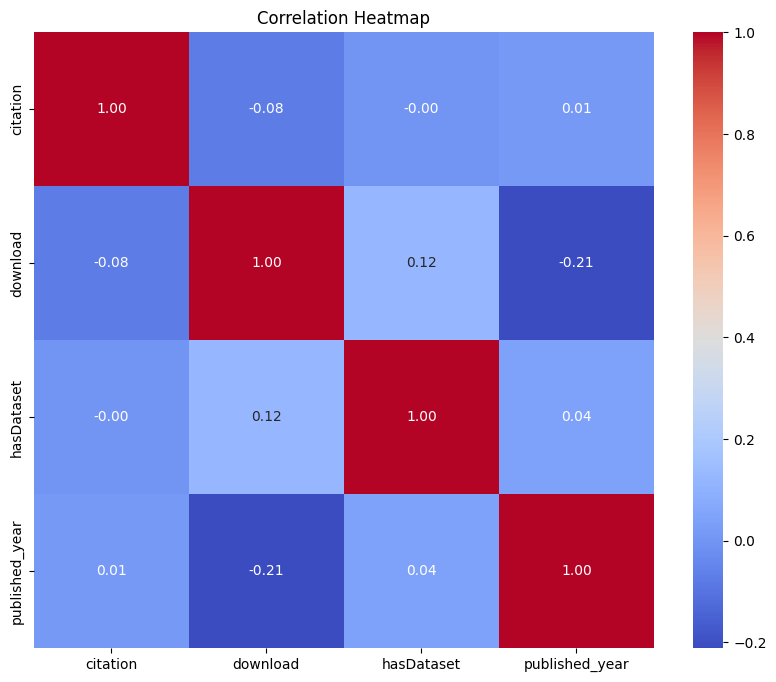

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

selected_columns = ["citation", "download", "hasDataset", "published_year"]


correlation_matrix = token_df[selected_columns].corr()


plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


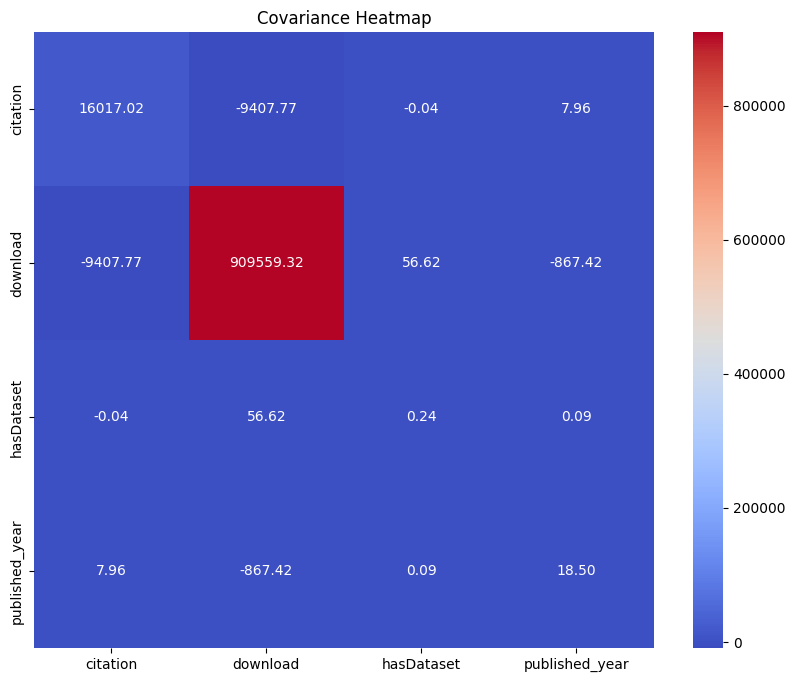

In [ ]:
covariance_matrix = token_df[selected_columns].cov()


plt.figure(figsize=(10, 8))
sns.heatmap(covariance_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Covariance Heatmap")
plt.show()

In [ ]:
def get_all_tokens(processed_text):
  all_vocabs = []
  for ls in processed_text:
    all_vocabs.append(' '.join(ls))

  return all_vocabs

In [ ]:
token_df['lemmatized_tokens'] = token_df['lemmatized_tokens'].apply(eval)
token_df['lemmatized_keywords'] = token_df['lemmatized_keywords'].apply(eval)
token_df['lemmatized_title_tokens'] = token_df['lemmatized_title_tokens'].apply(eval)


all_vocabs = get_all_tokens(token_df['lemmatized_tokens'])
all_keywords = get_all_tokens(token_df['lemmatized_keywords'])
all_titles = get_all_tokens(token_df['lemmatized_title_tokens'])

In [ ]:
token_df['lemmatized_title_tokens']

id
1      [ارزیابی_آمادگی, آمادگی_مدارس, مدارس_ابتدایی, ...
2      [بررسی_تحولات, تحولات_مدیریت, مدیریت_آموزشی, آ...
3      [بررسی_چالش, چالش_آموزشی, آموزشی_پژوهشی, پژوهش...
4      [توسعه_زیستبوم, زیستبوم_کارآفرینی, کارآفرینی_د...
5      [تحلیل_عوامل, عوامل_دلبستگی, دلبستگی_شغل, شغل_...
                             ...                        
156    [تامل_مولفه‌های, مولفه‌های_درس, درس_ریاضی, ریا...
157    [چالش_اجرای, اجرای_ارزشیابی, ارزشیابی_توصیف, ت...
158    [ارتقا_سواد, سواد_مالی, مالی_تصمیمگیری, تصمیمگ...
159    [تاثیر_راهبرد, راهبرد_رسم, رسم_شکل, شکل_مسائل,...
160    [ضرورت_تدوین, تدوین_معیار, معیار_روبریک, روبری...
Name: lemmatized_title_tokens, Length: 154, dtype: object

In [ ]:
all_titles

['ارزیابی_آمادگی آمادگی_مدارس مدارس_ابتدایی ابتدایی_شهر شهر_تهران تهران_استقرار استقرار_مدیریت مدیریت_مدرسه مدرسه_محور ارزیابی آمادگی مدارس ابتدایی شهر تهران استقرار مدیریت مدرسه محور',
 'بررسی_تحولات تحولات_مدیریت مدیریت_آموزشی آموزشی_مطالعه مطالعه_کیفی بررسی تحولات مدیریت آموزشی مطالعه کیفی',
 'بررسی_چالش چالش_آموزشی آموزشی_پژوهشی پژوهشی_سازمانی سازمانی_اعضا اعضا_هیئتعلمی هیئتعلمی_تازهکار تازهکار_دانشگاه دانشگاه_قندهار قندهار_افغانستان بررسی چالش آموزشی پژوهشی سازمانی اعضا هیئتعلمی تازهکار دانشگاه قندهار افغانستان',
 'توسعه_زیستبوم زیستبوم_کارآفرینی کارآفرینی_دانشجویی دانشجویی_رویکرد رویکرد_آزمایشگاه آزمایشگاه_زنده توسعه زیستبوم کارآفرینی دانشجویی رویکرد آزمایشگاه زنده',
 'تحلیل_عوامل عوامل_دلبستگی دلبستگی_شغل شغل_کارکنان کارکنان_دانشگاه دانشگاه_شهید شهید_بهشتی بهشتی_وفاداری وفاداری_دانشگاه تحلیل عوامل دلبستگی شغل کارکنان دانشگاه شهید بهشتی وفاداری دانشگاه',
 'تجربه_زندگی زندگی_تیم تیم_راه\u200cاندازی راه\u200cاندازی_دانشگاه تجربه زندگی تیم راه\u200cاندازی دانشگاه',
 'شناسایی_ابعاد ا

In [ ]:
all_vocabs

['ارزیابی_آمادگی آمادگی_مدارس مدارس_ابتدایی ابتدایی_شهر شهر_تهران تهران_استقرار استقرار_مدیریت مدیریت_مدرسه مدرسه_محور محور_مقاله مقاله_کوشید#کوش کوشید#کوش_ارائه ارائه_مدلی مدلی_جامع جامع_مولفه\u200cهای مولفه\u200cهای_مدیریت مدیریت_مدرسه مدرسه_محوری محوری_آمادگی آمادگی_مدارس مدارس_ابتدایی ابتدایی_شهر شهر_تهران تهران_استقرار استقرار_مفهوم مفهوم_بررسی بررسی_جامعه جامعه_آمارد#آمار آمارد#آمار_پژوهش پژوهش_معلمان معلمان_مدیر مدیر_مدارس مدارس_ابتدایی ابتدایی_شهر شهر_تهران تهران_نمونهگیری نمونهگیری_طبق طبق_مرحل مرحل_انتخاب انتخاب_نمونه نمونه_پژوهش پژوهش_استفاده\u200cشده استفاده\u200cشده_پرسشنامه پرسشنامه_محقق محقق_گردآوری گردآوری_استفاده\u200cشده استفاده\u200cشده_نتایج نتایج_پژوهش پژوهش_آمادگی آمادگی_مدارس مدارس_ابتدایی ابتدایی_شهر شهر_تهران تهران_ایجاد ایجاد_ساختار ساختار_غیرمتمرکز غیرمتمرکز_مشارکت مشارکت_مدارس مدارس_پذیرش پذیرش_قدرت قدرت_اختیار اختیار_بومی\u200cسازی بومی\u200cسازی_انعطاف\u200cپذیری انعطاف\u200cپذیری_نیرو نیرو_متخصص متخصص_حرفهای حرفهای_مسئولیتپذیری مسئولیتپذیری_پاسخگویی پاسخگ

### helping function

In [ ]:
def counter(data):
  word_count = {}
  for record in data:
    for vocab in record.split(" "):
      word_count[vocab] = 0

  for key in word_count.keys():
    for doc in data:
      if key in doc:
        word_count[key] += 1

  return sorted(word_count.items(), key=lambda item: item[1], reverse=True)

In [ ]:
words_count = counter(all_vocabs)

In [ ]:
titles_count = counter(all_titles)

In [ ]:
key_count = counter(all_keywords)

In [ ]:
key_count

[('آموزش', 62),
 ('دانش', 52),
 ('دانشگاه', 32),
 ('درس', 25),
 ('یادگیری', 21),
 ('توسعه', 15),
 ('ریاضی', 15),
 ('سازمانی', 14),
 ('دانشگاه_شهید', 13),
 ('شهید_بهشتی', 13),
 ('شهید', 13),
 ('بهشتی', 13),
 ('مدیر', 13),
 ('نظر', 13),
 ('مدیریت', 12),
 ('علمی', 12),
 ('تربیت', 12),
 ('دانشجو', 11),
 ('آموزشی', 10),
 ('چالش', 10),
 ('الکترونیکی', 10),
 ('نظریه', 10),
 ('دوره', 10),
 ('کیفی', 10),
 ('اعضا', 9),
 ('دانشگاهی', 9),
 ('معلم', 9),
 ('محتوا', 8),
 ('معلمان', 8),
 ('ارزش', 8),
 ('کارآفرین', 8),
 ('منابع', 7),
 ('حرفه\u200cای', 7),
 ('مدار', 7),
 ('الگو', 7),
 ('ایران', 7),
 ('تربیتی', 7),
 ('درس_ریاضی', 7),
 ('مدارس', 6),
 ('کارآفرینی', 6),
 ('علوم', 6),
 ('کلاس', 6),
 ('توسعه_حرفه\u200cای', 6),
 ('یادگیری_الکترونیکی', 6),
 ('بنیاد', 6),
 ('ساختار', 6),
 ('ارزشیابی', 6),
 ('اثربخشی', 6),
 ('اثربخش', 6),
 ('شایستگی', 6),
 ('تحصیلی', 6),
 ('نظام', 6),
 ('تدریس', 6),
 ('نامه', 6),
 ('مدل', 6),
 ('پژوهش', 6),
 ('هیئت', 6),
 ('عملکرد', 6),
 ('تحلیل', 6),
 ('ابتدایی', 5),
 ('دانش_آمو

In [ ]:
titles_count

[('دانش', 73),
 ('آموزش', 54),
 ('دانشگاه', 38),
 ('درس', 27),
 ('مطالعه', 24),
 ('ایران', 23),
 ('بررسی', 22),
 ('آموزان', 20),
 ('الگو', 20),
 ('دانش_آموزان', 19),
 ('کیفی', 18),
 ('شناسایی', 17),
 ('دوره', 17),
 ('دانشجو', 17),
 ('مدیر', 17),
 ('دید', 17),
 ('توسعه', 15),
 ('طراحی', 15),
 ('ریاضی', 15),
 ('تربیت', 15),
 ('شهید', 14),
 ('یادگیری', 14),
 ('رویکرد', 13),
 ('دانشگاه_شهید', 13),
 ('تحلیل', 13),
 ('ابتدایی', 12),
 ('مدیریت', 12),
 ('آموزشی', 12),
 ('چالش', 12),
 ('شهید_بهشتی', 12),
 ('بهشتی', 12),
 ('معلم', 12),
 ('علمی', 11),
 ('اثربخش', 11),
 ('سازمان', 11),
 ('دیدگاه', 11),
 ('نظام', 11),
 ('تهران', 10),
 ('مبتنی', 10),
 ('آموزش_ایران', 10),
 ('معلمان', 10),
 ('سازمانی', 9),
 ('اعضا', 9),
 ('نقش', 9),
 ('عملکرد', 9),
 ('اثربخشی', 9),
 ('الکترونیک', 9),
 ('درس_ریاضی', 9),
 ('حرفهای', 8),
 ('الکترونیکی', 8),
 ('ساخت', 8),
 ('نظری', 8),
 ('مدل', 8),
 ('ارزش', 8),
 ('مطالعه_کیفی', 7),
 ('عوامل', 7),
 ('علوم', 7),
 ('مطالعه_موردی', 7),
 ('موردی', 7),
 ('نظام_آموزش', 7),
 ('

In [ ]:
words_count

[('تحلیل', 117),
 ('پژوهش', 115),
 ('دانش', 115),
 ('آموزش', 109),
 ('انت', 91),
 ('نمونه', 88),
 ('نمون', 88),
 ('بررسی', 87),
 ('نظر', 84),
 ('اصل', 82),
 ('کیفی', 81),
 ('مطالع', 81),
 ('علم', 80),
 ('ساز', 80),
 ('جامع', 79),
 ('انتخاب', 79),
 ('ساخت', 78),
 ('نامه', 76),
 ('مطالعه', 75),
 ('جامعه', 74),
 ('نتایج', 72),
 ('دست', 72),
 ('دانشگاه', 68),
 ('ساختار', 63),
 ('فرا', 62),
 ('رویکرد', 61),
 ('رویکر', 61),
 ('آموزشی', 60),
 ('تجزیه', 60),
 ('اصلی', 59),
 ('شامل', 59),
 ('درس', 59),
 ('مصاحب', 59),
 ('مصاحبه', 58),
 ('شناسا', 58),
 ('پرسش', 57),
 ('توجه', 56),
 ('روا', 56),
 ('دید', 55),
 ('رتب', 55),
 ('تجزیه_تحلیل', 53),
 ('آمار', 53),
 ('پرسشنامه', 52),
 ('شناسایی', 52),
 ('محتوا', 52),
 ('توصیف', 52),
 ('مدیر', 51),
 ('علمی', 51),
 ('آمارد#آمار', 49),
 ('هدفمند', 49),
 ('دوره', 46),
 ('سازمان', 45),
 ('جامعه_آمارد#آمار', 44),
 ('منظور', 44),
 ('طراحی', 44),
 ('یادگیری', 44),
 ('طراح', 44),
 ('ابزار', 43),
 ('توسعه', 43),
 ('ایران', 43),
 ('توسع', 43),
 ('ثیر', 42),
 ('اف

In [ ]:
X = []
y = []

for a, b in words_count:
  X.append(a)
  y.append(b)

In [ ]:
print(y)

[117, 115, 115, 109, 91, 88, 88, 87, 84, 82, 81, 81, 80, 80, 79, 79, 78, 76, 75, 74, 72, 72, 68, 63, 62, 61, 61, 60, 60, 59, 59, 59, 59, 58, 58, 57, 56, 56, 55, 55, 53, 53, 52, 52, 52, 52, 51, 51, 49, 49, 46, 45, 44, 44, 44, 44, 44, 43, 43, 43, 43, 42, 41, 40, 39, 39, 39, 38, 38, 38, 37, 37, 36, 36, 36, 35, 35, 34, 34, 34, 34, 34, 33, 33, 33, 33, 33, 33, 33, 33, 33, 32, 32, 32, 32, 32, 32, 32, 31, 31, 31, 31, 31, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 30, 29, 29, 29, 29, 29, 29, 29, 28, 28, 28, 28, 28, 28, 28, 28, 28, 27, 27, 27, 27, 27, 27, 27, 27, 27, 27, 26, 26, 26, 26, 26, 26, 26, 26, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 22, 22, 22, 22, 22, 22, 22, 22, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18,

<BarContainer object of 100 artists>

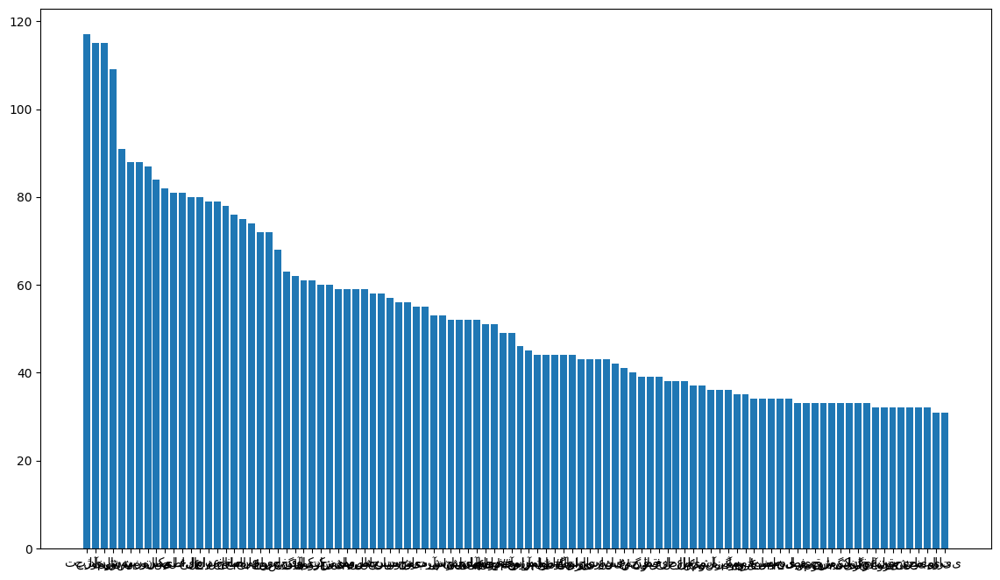

In [ ]:
plt.figure(figsize=(14, 8))
plt.bar(X[0:100], y[0:100])

## Evalate cluster

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.metrics import mutual_info_score, adjusted_rand_score

def evaluate_clusters(titles_vectors_w2v, clusters_title):
  silhouette = silhouette_score(titles_vectors_w2v, clusters_title)
  db_index = davies_bouldin_score(titles_vectors_w2v, clusters_title)
  ch_index = calinski_harabasz_score(titles_vectors_w2v, clusters_title)

  # Print the metric scores
  print(f"Silhouette Score: {silhouette:.2f}")
  print(f"Davies-Bouldin Index: {db_index:.2f}")
  print(f"Calinski-Harabasz Index: {ch_index:.2f}")

## Jaccard K-means

#### find optimal k with elbow plot

In [ ]:
def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1, 1)

    sse = []
    for k in iters:
        sse_value = KMeans(init='k-means++', n_clusters=k, random_state=24, max_iter=1000).fit(data).inertia_
        sse.append(sse_value)
        print('Fit {} clusters with sse {}'.format(k, sse_value))

    f, ax = plt.subplots(1, 1,  figsize=(8, 6))
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster Center Plot')

#### clusters tnse and pca plot

In [ ]:
def plot_tsne_pca_2d(data, labels):
    max_label = max(labels)
    idx = np.arange(0, data.shape[0])

    pca = PCA(n_components=2).fit_transform(data)
    tsne = TSNE(2).fit_transform(data)

    label_subset = labels[idx]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]

    f, ax = plt.subplots(1, 2, figsize=(14, 6))

    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')

    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')

In [ ]:
def plot_tsne_pca_3d(data, labels):
    max_label = max(labels)
    idx = np.arange(0, data.shape[0])

    pca = PCA(n_components=3).fit_transform(data)
    tsne = TSNE(3).fit_transform(data)

    label_subset = labels[idx]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]

    fig = plt.figure(figsize=(14, 6))

    ax1 = fig.add_subplot(1, 2, 1, projection='3d')
    ax1.scatter(pca[idx, 0], pca[idx, 1], pca[idx, 2], c=label_subset)
    ax1.set_title('PCA Cluster Plot')

    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    ax2.scatter(tsne[idx, 0], tsne[idx, 1],tsne[idx, 2], c=label_subset)
    ax2.set_title('TSNE Cluster Plot')

    plt.show()

#### get top keywords of a clustering

In [ ]:
def get_top_keywords(data, clusters, labels, n_terms):
    df = pd.DataFrame(data).groupby(clusters).mean()

    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(' , '.join([labels[t] for t in np.argsort(r)[-n_terms:]]))

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline


def gridSearchTuning(preprocessed_documents):
  parameters = {
      'tfidf__max_df': [0.75, 0.8, 0.85, 0.9, 0.95, 1.0],
      'tfidf__min_df': [1, 2, 3, 4, 5, 7, 8, 10, 12, 14, 16, 18, 20],
      'kmeans__n_clusters': [4, 5, 6, 7, 8]
  }

  pipeline = Pipeline([
      ('tfidf', TfidfVectorizer()),
      ('kmeans', KMeans(init='k-means++', max_iter=1000, n_init=1))
  ])

  grid_search = GridSearchCV(pipeline, parameters, cv=5)
  grid_search.fit(preprocessed_documents)

  print("Best parameters set found on development set:")
  print(grid_search.best_params_)
  print()

  print("Grid scores on development set:")
  means = grid_search.cv_results_['mean_test_score']
  stds = grid_search.cv_results_['std_test_score']
  for mean, std, params in zip(means, stds, grid_search.cv_results_['params']):
      print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))


In [ ]:
# gridSearchTuning(all_vocabs)

8. Tf-IDF

In [ ]:
tfidf = TfidfVectorizer(
    min_df=20,
    max_df=0.6,
)

tfidf_matrix = tfidf.fit_transform(all_vocabs)

In [ ]:
tfidf_matrix

<154x137 sparse matrix of type '<class 'numpy.float64'>'
	with 4737 stored elements in Compressed Sparse Row format>

In [ ]:
words = tfidf.get_feature_names_out()
words

array(['آزمون', 'آمار', 'آمار_پژوهش', 'آمارد', 'آموزان', 'آموزش',
       'آموزشی', 'آوری', 'ابزار', 'ابعاد', 'اثربخشی', 'اجتماعی', 'اجرای',
       'ارائه', 'ارزیابی', 'اساسی', 'استخراج', 'استفاده', 'اسناد', 'اصلی',
       'اطلاعات', 'اعتبار', 'اعضا', 'الگو', 'انتخاب', 'انجام', 'اهداف',
       'اهمیت', 'ایجاد', 'ایران', 'بررسی', 'بهبود', 'تاثیر', 'تجزیه',
       'تجزیه_تحلیل', 'تحصیلی', 'تحقیقات', 'تحلیل_محتوا', 'تدوین',
       'تربیت', 'تربیتی', 'تصادفی', 'تعامل', 'تعیین', 'تهران', 'توجه',
       'توسعه', 'توصیف', 'جامعه', 'جامعه_آمارد', 'جمع', 'حاصل', 'حوزه',
       'دانش', 'دانش_آموزان', 'دانشآموزان', 'دانشجو', 'دانشگاه',
       'دانشگاه_شهید', 'دانشگاهی', 'درس', 'دست', 'دوره', 'دیدگاه',
       'روایی', 'رویکرد', 'ریاضی', 'ساختار', 'سازمان', 'سازمانی', 'سطح',
       'شامل', 'شده', 'شرکت', 'شناسایی', 'شهر', 'شهید', 'شیوه', 'طراحی',
       'طرح', 'علمی', 'علوم', 'عملکرد', 'عوامل', 'فرایند', 'فردی',
       'فرهنگ', 'فعالیت', 'مبتنی', 'متخصص', 'محتوا', 'محقق', 'مدل',
       'مدیر', 'مدیر

In [ ]:
tfidf_array = tfidf_matrix.toarray()
tfidf_array

array([[0.        , 0.13387252, 0.08993126, ..., 0.08531089, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.09581174, 0.24224156, 0.10848673, ..., 0.        , 0.08301672,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.25496766, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
tfidf_array.shape

(154, 137)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 2 clusters with sse 123.83989702589409
Fit 3 clusters with sse 120.06284186670854


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 4 clusters with sse 115.85931185063708
Fit 5 clusters with sse 112.31636704127476


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 6 clusters with sse 110.3292929473345


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 7 clusters with sse 107.9169870428692


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 8 clusters with sse 104.84199015863416
Fit 9 clusters with sse 103.06143558860234


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 10 clusters with sse 102.17614237664296
Fit 11 clusters with sse 99.64168053578351


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 12 clusters with sse 98.11335150264316
Fit 13 clusters with sse 95.89485922682442


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 14 clusters with sse 94.17387282392535


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 15 clusters with sse 92.58751508219864


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 16 clusters with sse 91.4159763344827


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 17 clusters with sse 88.68469307907785


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 18 clusters with sse 88.18798032038559


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 19 clusters with sse 86.99893310431756


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 20 clusters with sse 85.36342865802999


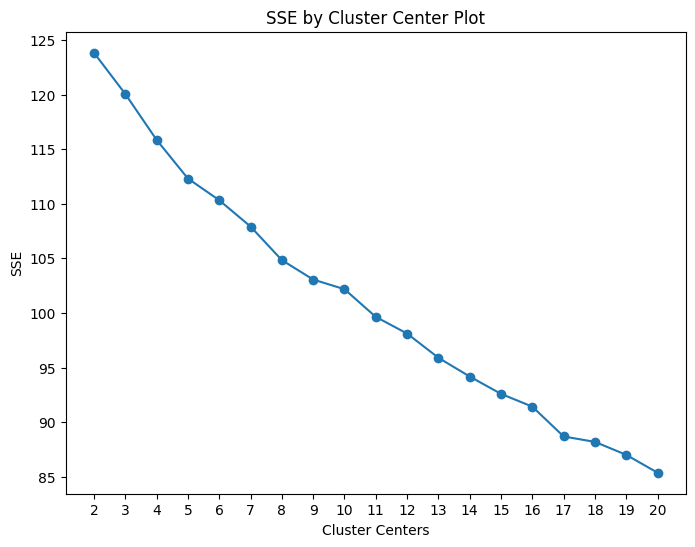

In [ ]:
find_optimal_clusters(tfidf_array, 20)

In [ ]:
clusters_tfidf = KMeans(init='k-means++', n_clusters=5, random_state=32).fit_predict(tfidf_array)
clusters_tfidf

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([2, 2, 3, 3, 3, 3, 3, 2, 3, 3, 1, 2, 2, 2, 1, 3, 2, 2, 1, 2, 3, 2,
       2, 1, 3, 0, 4, 0, 1, 1, 4, 0, 0, 0, 1, 1, 2, 3, 1, 1, 1, 1, 2, 2,
       2, 1, 2, 2, 1, 3, 3, 1, 2, 2, 2, 1, 1, 0, 3, 1, 3, 1, 1, 1, 3, 3,
       3, 3, 1, 3, 1, 1, 1, 3, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 3, 2, 1,
       3, 3, 1, 1, 4, 0, 3, 3, 3, 1, 1, 1, 1, 3, 3, 3, 2, 4, 4, 2, 2, 1,
       2, 2, 4, 4, 4, 1, 1, 3, 2, 2, 1, 2, 2, 1, 3, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 1, 4, 4, 4, 2, 3, 1, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
      dtype=int32)

In [ ]:
get_top_keywords(tfidf_array, clusters_tfidf, tfidf.get_feature_names_out(), 50)


Cluster 0
نتایج , پژوهش_بررسی , نتیجه , تعامل , ارائه , توجه , آموزش , تدوین , حاصل , دوره , انتخاب , نظام , اهداف , دیدگاه , مشارکت , کشور , کیفی , مدل , اساسی , مطالعه , نظری , شامل , معلمان , فرایند , نظر , سطح , مفهوم , مدیریت , درس , شده , انجام , جامعه , مقوله , یادگیری , دانش , اسناد , آموزشی , بررسی , حوزه , مقاله , توسعه , ایران , اصلی , مبتنی , نقش , رویکرد , ابعاد , نظریه , تربیتی , تربیت

Cluster 1
ابعاد , مهم , تجزیه_تحلیل , طراحی , توجه , مدیر , ایجاد , تحقیقات , کدگذاری , علمی , اصلی , بهبود , نتایج , درس , آوری , اثربخشی , ابزار , استفاده , عملکرد , نمونه , دوره , انجام , رویکرد , دانش , منابع , ویژگی , بررسی , ایران , تعامل , کیفیت , عوامل , دانشگاه , ارائه , شناسایی , توسعه , استخراج , سازمان , کیفی , مصاحبه , آموزشی , مقاله , فرایند , نظام , مقوله , مطالعه , گیری , دانشجو , شده , آموزش , یادگیری

Cluster 2
دست , منابع , درس , سازمانی , توجه , انجام , حوزه , محتوا , مبتنی , تاثیر , مطالعه , جامعه_آمارد , شامل , نیاز , مهارت , طرح , مصاحبه , توصیف , ابزار , جامعه , مد

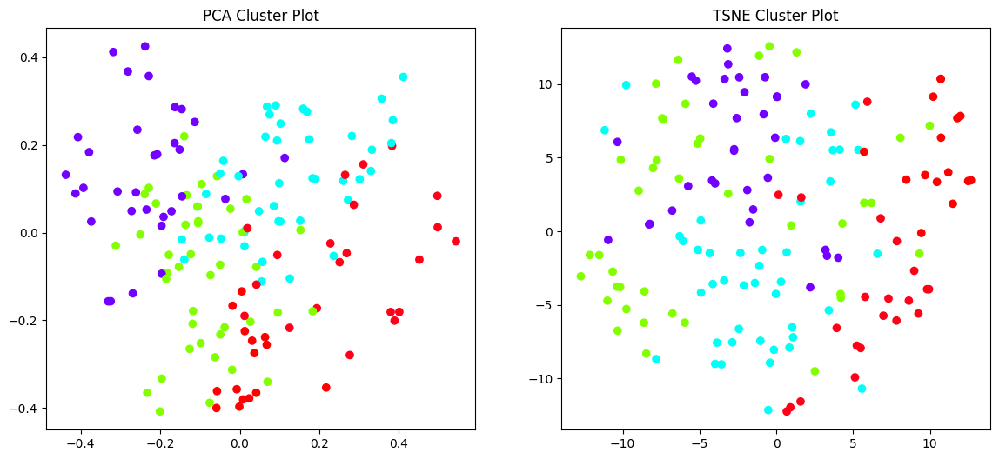

In [ ]:
plot_tsne_pca_2d(tfidf_array, clusters_tfidf)

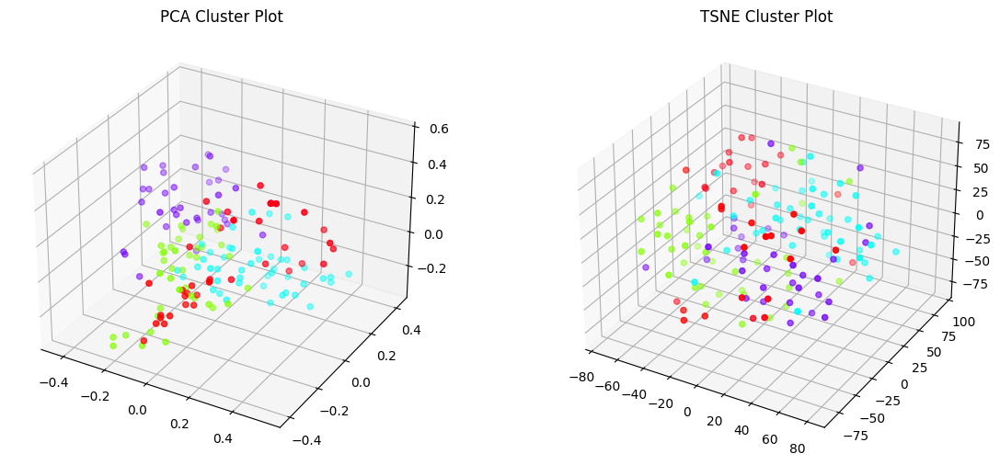

In [ ]:
plot_tsne_pca_3d(tfidf_array, clusters_tfidf)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import numpy as np
from scipy.spatial.distance import pdist, squareform

def jaccard_similarity(a, b):
    intersection = np.logical_and(a, b).sum()
    union = np.logical_or(a, b).sum()
    return intersection / union

def silhouette_score_jaccard(X, labels):
    n_samples = len(labels)
    unique_labels = np.unique(labels)
    n_clusters = len(unique_labels)

    jaccard_sim_matrix = np.zeros((n_samples, n_samples))
    for i in range(n_samples):
        for j in range(n_samples):
            if i != j:
                jaccard_sim_matrix[i, j] = jaccard_similarity(X[i], X[j])

    silhouette_scores = np.zeros(n_samples)
    for i in range(n_samples):
        same_cluster = labels == labels[i]
        other_cluster = labels != labels[i]

        a = np.mean(jaccard_sim_matrix[i, same_cluster]) if np.sum(same_cluster) > 1 else 0
        b = np.min([np.mean(jaccard_sim_matrix[i, labels == label]) for label in unique_labels if label != labels[i]])

        silhouette_scores[i] = (a - b) / max(a, b) if max(a, b) > 0 else 0

    return np.mean(silhouette_scores)

In [ ]:
silhouette_score_jaccard(tfidf_array, clusters_tfidf)

0.39567944119581855

In [ ]:
tfidf_clustered_dataset = pd.DataFrame({'title': token_df['title'], 'author': token_df['author'], 'cluster': clusters_tfidf, 'label': token_df['class_label']})

In [ ]:
tfidf_clustered_dataset

,title,author,cluster,label
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,2,مدیریت آموزشی و هدایت تحصیلی
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,2,مدیریت آموزشی و هدایت تحصیلی
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,3,آموزش و سازماندهی دانشگاهی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,3,اشتغال و کارآفرینی
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,3,مدیریت منابع انسانی و علوم رفتاری
...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی


<Axes: title={'center': 'cluster'}, ylabel='Frequency'>

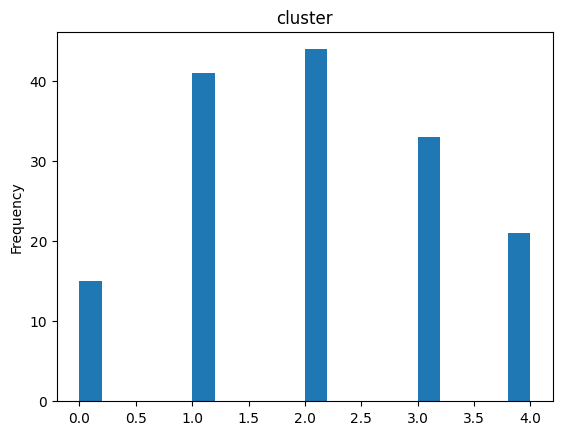

In [ ]:
tfidf_clustered_dataset['cluster'].plot(kind='hist', bins=20, title='cluster')

In [ ]:
print(len(tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 0]))
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 0]

15


,title,author,cluster,label
id,,,,
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,0,انقلاب
28,مناسبات تربیتی خانواده و دولت,جمیله علم الهدی,0,خانواده و دولت - رویکرد اسلامی
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,0,مدیریت آموزشی و هدایت تحصیلی
33,چرخش از عالم دو قطبی به جهان سه درجه‌ای,جمیله علم الهدی,0,تربیت - رویکرد اسلامی
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,0,آموزش و سازماندهی دانشگاهی
60,مدل ادراک و نگرش معلمان نسبت به توسعه حرفه‌ای ...,محمد قهرمانی,0,مدیریت آموزشی و هدایت تحصیلی
78,\nفهم مساله محور قرآن مبتنی بر رویکرد سازه گرا...,رضا محمدی چابکی,0,اسلامی - فهم مسئله محور قرآن
79,مطالعه تطبیقی استعاره تربیتی سفر در عرفان اسلا...,رضا محمدی چابکی,0,اسلامی
80,\nگذار از نظریه به عمل در تربیت اسلامی,رضا محمدی چابکی,0,اسلامی


In [ ]:
print(len(tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 1]))
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 1]

41


,title,author,cluster,label
id,,,,
11,بررسی نقش تداوم یادگیری الکترونیکی بر توسعه حر...,فرنوش اعلامی,1,آموزش الکترونیکی
15,دوره‌های الکترونیکی اثربخش سازمانی: توجه مضاع...,غلامرضا شمس,1,آموزش الکترونیکی
19,شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...,غلامرضا شمس,1,آموزش الکترونیکی
24,شناسایی شایستگی‌های رهبران آینده در نظام آموزش...,محمود ابوالقاسمی,1,انتخاب افراد شایسته
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,1,آموزش و سازماندهی دانشگاهی
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,1,مدیریت آموزشی و هدایت تحصیلی
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,جمیله علم الهدی,1,آموزش و سازماندهی دانشگاهی - کلاس معکوس
37,کلاس معکوس در آموزش عالی ایران: با تاکید بر مز...,جمیله علم الهدی,1,آموزش و سازماندهی دانشگاهی - کلاس معکوس
41,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,محمد قهرمانی,1,آموزش الکترونیکی


In [ ]:
print(len(tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 2]))
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 2]

44


,title,author,cluster,label
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,2,مدیریت آموزشی و هدایت تحصیلی
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,2,مدیریت آموزشی و هدایت تحصیلی
8,تأثیر آموزش کارآفرینی مبتنی بر فناوری بر توانم...,فرنوش اعلامی,2,اشتغال و کارآفرینی
12,بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...,فرنوش اعلامی,2,آموزش و سازماندهی دانشگاهی
13,مطالعه و ارائه الگوی مفهومی و کاربردی استارت آ...,فرنوش اعلامی,2,اشتغال و کارآفرینی
14,ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...,غلامرضا شمس,2,انتخاب افراد شایسته
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,2,انتخاب افراد شایسته
18,طراحی و اعتباربخشی الگوی مطلوب برنامه درسی رشت...,غلامرضا شمس,2,اشتغال و کارآفرینی
20,طراحی الگوهای مناسب جهت هدایت تحصیلی دانش آموز...,محمود ابوالقاسمی,2,مدیریت آموزشی و هدایت تحصیلی


In [ ]:
print(len(tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 3]))
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 3]

33


,title,author,cluster,label
id,,,,
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,3,آموزش و سازماندهی دانشگاهی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,3,اشتغال و کارآفرینی
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,3,مدیریت منابع انسانی و علوم رفتاری
6,تجربه زندگی تیم های راه اندازی دانشگاه.,فرنوش اعلامی,3,اشتغال و کارآفرینی
7,شناسایی ابعاد و مولفه‌های کلیدی اشتغال‌پذیری د...,فرنوش اعلامی,3,اشتغال و کارآفرینی
9,بررسی نقش برنامه‌های درسی رشته‌های علوم اجتماع...,فرنوش اعلامی,3,اشتغال و کارآفرینی
10,تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...,فرنوش اعلامی,3,آموزش و سازماندهی دانشگاهی
16,شناسایی چالش‌ها و فرصت‌های توسعه سازمانی از طر...,غلامرضا شمس,3,توسعه سازمانی و استفاده از فناوری
21,بررسی رابطه میان ساختار سازمانی و کارآفرینی سا...,محمود ابوالقاسمی,3,ساختار سازمانی - اشتغال و کارآفرینی


In [ ]:
print(len(tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 4]))
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 4]

21


,title,author,cluster,label
id,,,,
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,4,آموزش و سازماندهی دانشگاهی
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,4,آموزش و سازماندهی دانشگاهی
96,تدوین الگویی برای برنامه درسی مبتنی بر موک در ...,مرتضی رضائی زاده,4,آموزش و سازماندهی دانشگاهی
109,بررسي تأثير تدريس معادلات ديفرانسيل بر اساس رو...,نسیم اصغری,4,آموزش و سازماندهی دانشگاهی - معادلات دیفرانسیل
110,تثبیت درک و عملکرد معلمان ابتدایی از فرآیند طر...,نسیم اصغری,4,مدیریت آموزشی و هدایت تحصیلی
117,بررسی توانایی دانش آموزان در طرح مسئلهي ریاضی ...,محمد رضا فدایی,4,مدیریت آموزشی و هدایت تحصیلی
118,بررسی درک دانش آموزان سال پنجم ابتدایی از اعما...,ابراهیم ریحانی,4,مدیریت آموزشی و هدایت تحصیلی
119,تحلیل محتوای کتاب‌های درسی ریاضی دوره اول متوس...,ابراهیم ریحانی,4,مدیریت آموزشی و هدایت تحصیلی
143,تاملی در مولفه های برنامه درسی ریاضی مدرسه ای ...,علیرضا کیامنش,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 4]

,title,author,cluster,label
id,,,,
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,4,آموزش و سازماندهی دانشگاهی
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,4,آموزش و سازماندهی دانشگاهی
96,تدوین الگویی برای برنامه درسی مبتنی بر موک در ...,مرتضی رضائی زاده,4,آموزش و سازماندهی دانشگاهی
109,بررسي تأثير تدريس معادلات ديفرانسيل بر اساس رو...,نسیم اصغری,4,آموزش و سازماندهی دانشگاهی - معادلات دیفرانسیل
110,تثبیت درک و عملکرد معلمان ابتدایی از فرآیند طر...,نسیم اصغری,4,مدیریت آموزشی و هدایت تحصیلی
117,بررسی توانایی دانش آموزان در طرح مسئلهي ریاضی ...,محمد رضا فدایی,4,مدیریت آموزشی و هدایت تحصیلی
118,بررسی درک دانش آموزان سال پنجم ابتدایی از اعما...,ابراهیم ریحانی,4,مدیریت آموزشی و هدایت تحصیلی
119,تحلیل محتوای کتاب‌های درسی ریاضی دوره اول متوس...,ابراهیم ریحانی,4,مدیریت آموزشی و هدایت تحصیلی
143,تاملی در مولفه های برنامه درسی ریاضی مدرسه ای ...,علیرضا کیامنش,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 6]

,title,author,cluster,label
id,,,,


In [ ]:
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 5]

,title,author,cluster,label
id,,,,


In [ ]:
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 8]

,title,author,cluster,label
id,,,,


In [ ]:
evaluate_clusters(tfidf_array, clusters_tfidf)

Silhouette Score: 0.05
Davies-Bouldin Index: 3.67
Calinski-Harabasz Index: 5.36


#### silhouette on tfidf_all_vocabs

In [ ]:
from sklearn.metrics import silhouette_score


silhouette_avg = silhouette_score(tfidf_array, clusters_tfidf)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.048481003800602954


### tf-idf on keywords

In [ ]:
tfidf = TfidfVectorizer(
    min_df=3,
    max_df=0.85,
)


keywords = tfidf.fit_transform(all_keywords)
print('feature names')
print(tfidf.get_feature_names_out(), '\n')
keywords_tfidf = keywords.toarray()
print('matrix shape')
print(keywords_tfidf.shape)

feature names
['آسیب' 'آموزان' 'آموزش' 'آموزش_آموزش' 'آموزش_الکترونیکی' 'آموزش_بهسازی'
 'آموزش_مجازی' 'آموزش_پرورش' 'آموزشی' 'ابتدایی' 'اثربخشی' 'ارزشیابی'
 'ارزیابی' 'استاد' 'استاد_راهنما' 'استراتژی' 'اسلامی' 'اعضا' 'اعضا_هیأت'
 'اعضا_هیئت' 'الکترونیکی' 'الگو' 'انسانی' 'اهداف' 'ای' 'ایران' 'برنامه'
 'بنیاد' 'بهسازی' 'بهشتی' 'تحصیلی' 'تحلیل' 'تحلیل_محتوا' 'تدریس' 'تربیت'
 'تربیتی' 'تصمیم' 'تفکر' 'توسعه' 'توسعه_حرفه' 'حرفه' 'حرفهای' 'خلاقیت'
 'دانش' 'دانش_آموزان' 'دانشجو' 'دانشگاه' 'دانشگاه_شهید' 'دانشگاهی' 'درس'
 'درس_ریاضی' 'دوره' 'راهنما' 'رشد' 'رهبری' 'رویکرد' 'ریاضی' 'ریزی'
 'ساختار' 'سازمانی' 'سازمانی_دانشگاه' 'سبک' 'سند' 'سیاست' 'سیستم'
 'شایستگی' 'شناختی' 'شناسی' 'شهید' 'شهید_بهشتی' 'طراحی' 'علمی'
 'علمی_دانشگاه' 'علوم' 'عملکرد' 'عمومی' 'عوامل' 'فلسفه' 'قابلیت' 'قرآن'
 'متوسطه' 'مجازی' 'محتوا' 'مدارس' 'مدرسه' 'مدل' 'مدیریت' 'مسئله' 'مطالعه'
 'معلمان' 'معکوس' 'منابع' 'منابع_انسانی' 'مهارت' 'نظام' 'نظام_آموزش'
 'نظریه' 'نظریه_بنیاد' 'نوآوری' 'هیأت' 'هیأت_علمی' 'هیئت' 'پدیدارشناسی'

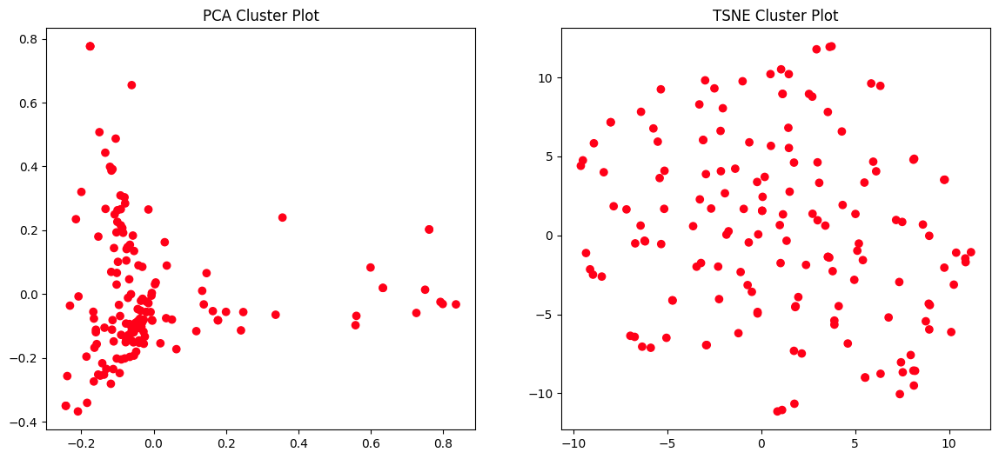

In [ ]:
plot_tsne_pca_2d(keywords_tfidf, np.array([1]*len(keywords_tfidf)))

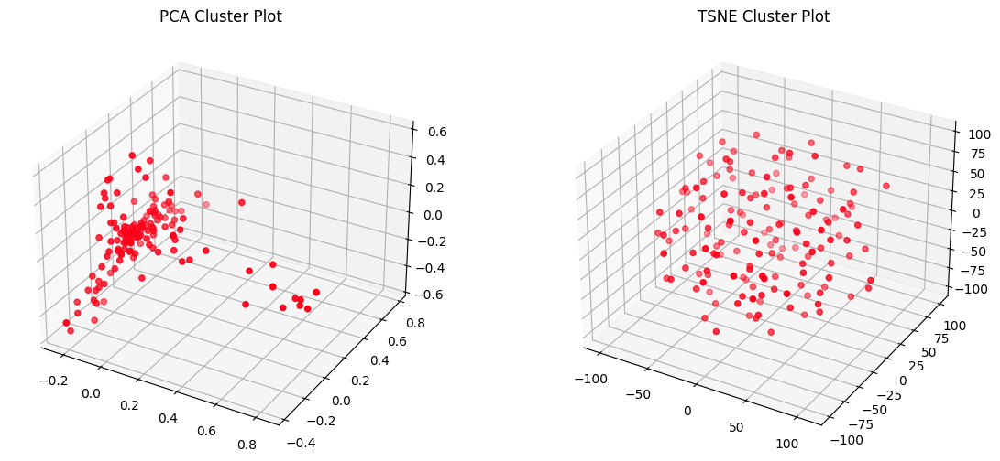

In [ ]:
plot_tsne_pca_3d(keywords_tfidf, np.array([1]*len(keywords_tfidf)))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 2 clusters with sse 137.44245762447878
Fit 3 clusters with sse 133.49566438452223
Fit 4 clusters with sse 129.3729579006319
Fit 5 clusters with sse 124.5646948941818
Fit 6 clusters with sse 121.37377401435637


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 7 clusters with sse 118.80527312296283
Fit 8 clusters with sse 114.86255095750761
Fit 9 clusters with sse 113.58463574527593


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 10 clusters with sse 110.69049606925002


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 11 clusters with sse 109.19323122750919
Fit 12 clusters with sse 105.03261685587933


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 13 clusters with sse 103.33300823886486
Fit 14 clusters with sse 102.14754337639945


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 15 clusters with sse 98.83576043782011


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 16 clusters with sse 97.63869674073874
Fit 17 clusters with sse 96.50811962092143


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 18 clusters with sse 93.04421328706238
Fit 19 clusters with sse 90.6148599898028


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 20 clusters with sse 88.58252717537144
Fit 21 clusters with sse 89.33294238715976


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 22 clusters with sse 85.98390601016129
Fit 23 clusters with sse 83.57350496741924


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 24 clusters with sse 81.42752324428633


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 25 clusters with sse 81.35306101192356


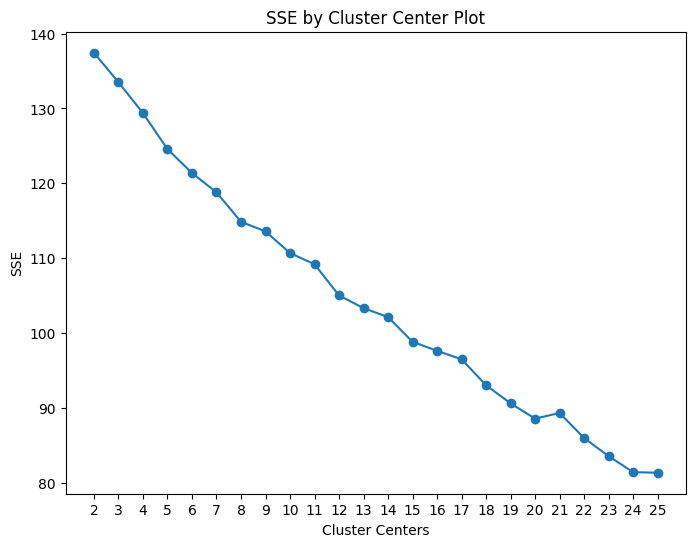

In [ ]:
find_optimal_clusters(keywords_tfidf, 25)

In [ ]:
clusters = KMeans(n_clusters=8, random_state=20).fit_predict(keywords_tfidf)
clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([5, 4, 7, 4, 1, 1, 1, 4, 1, 6, 6, 4, 4, 7, 0, 0, 0, 4, 0, 5, 1, 4,
       1, 0, 1, 7, 4, 4, 0, 5, 4, 4, 4, 5, 0, 0, 5, 4, 3, 6, 0, 6, 7, 0,
       6, 0, 0, 2, 0, 7, 7, 0, 4, 4, 0, 3, 0, 6, 1, 0, 4, 0, 3, 4, 1, 7,
       0, 7, 0, 1, 4, 2, 5, 0, 0, 4, 4, 5, 4, 5, 7, 4, 4, 5, 3, 1, 2, 3,
       7, 0, 0, 3, 7, 3, 0, 3, 0, 4, 3, 3, 4, 5, 0, 1, 0, 4, 2, 5, 7, 0,
       4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 2, 4, 5, 0, 7, 4, 4, 4, 4, 4, 4, 4,
       4, 0, 2, 3, 3, 4, 4, 4, 2, 6, 4, 4, 4, 4, 0, 4, 4, 4, 4, 2, 4, 5],
      dtype=int32)

In [ ]:
get_top_keywords(keywords_tfidf, clusters, tfidf.get_feature_names_out(), 10)


Cluster 0
آموزش_آموزش , برنامه , ریزی , سیاست , توسعه , نظام , عوامل , چالش , سازمانی , آموزش

Cluster 1
کارآفرینی , هیئت , سازمانی_دانشگاه , علمی , سازمانی , شهید_بهشتی , بهشتی , دانشگاه , شهید , دانشگاه_شهید

Cluster 2
دانشگاه , آموزش , دانشجو , گیری , تصمیم , پدیدارشناسی , تفکر , کیفی , تحلیل , پژوهش

Cluster 3
اثربخشی , دانشجو , الگو , معلمان , کلاس , سیستم , معکوس , الکترونیکی , یادگیری_الکترونیکی , یادگیری

Cluster 4
گری , درس_ریاضی , خلاقیت , آموزشی , رویکرد , تربیتی , دانشجو , دانش , درس , ریاضی

Cluster 5
مدیریت , آموزشی , محتوا , شناسی , مدارس , درس , تربیتی , ابتدایی , دوره , تربیت

Cluster 6
مطالعه , شناسی , آسیب , یادگیری , علمی , آموزش , توسعه , توسعه_حرفه , حرفه , ای

Cluster 7
هیأت_علمی , هیأت , اعضا_هیأت , دانشگاه , علمی_دانشگاه , نظریه_بنیاد , اعضا , بنیاد , علمی , نظریه


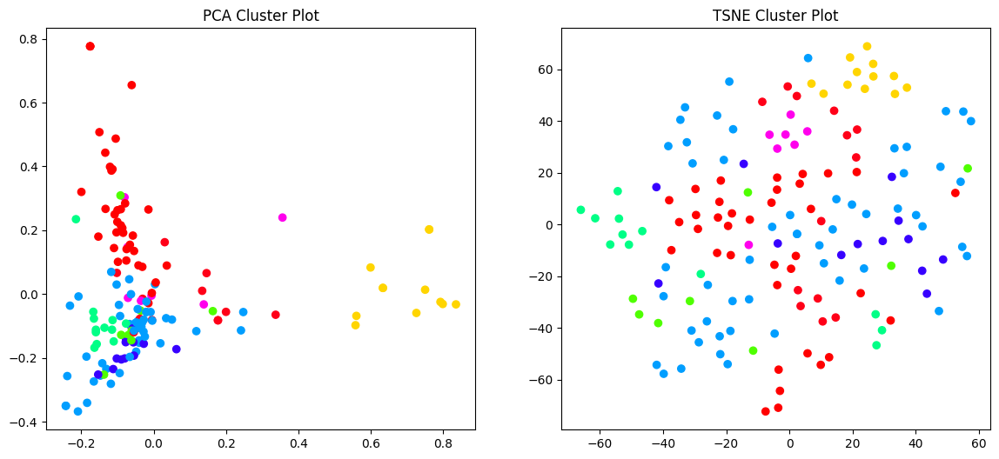

In [ ]:
plot_tsne_pca_2d(keywords_tfidf, clusters)

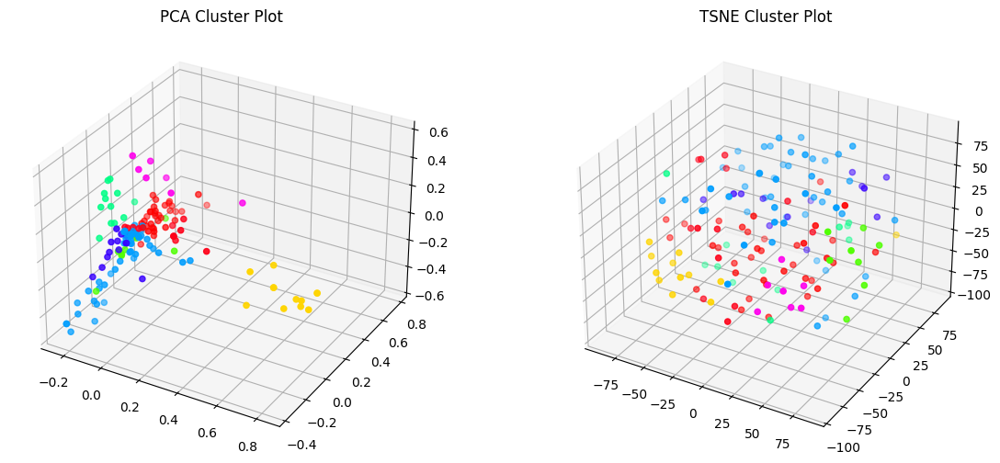

In [ ]:
plot_tsne_pca_3d(keywords_tfidf, clusters)

#### silhouette on tfidf_all_keywords

In [ ]:
silhouette_avg = silhouette_score(keywords_tfidf, clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.08162159113513086


In [ ]:
tfidf_titles = tfidf.fit_transform(all_titles)
print('feature names')
print(tfidf.get_feature_names_out(), '\n')
titles_tfidf = tfidf_titles.toarray()
print('matrix shape')
print(titles_tfidf.shape)

feature names
['آسیب' 'آموزان' 'آموزان_دختر' 'آموزش' 'آموزش_ایران' 'آموزشی'
 'آموزشی_مبتنی' 'ابتدایی' 'ابزار' 'اثربخشی' 'اثربخشی_آموزش'
 'اثربخشی_یادگیری' 'اجتماعی' 'اجرای' 'ارائه' 'ارائه_الگو' 'ارتقا'
 'ارزشیابی' 'ارزشیابی_توصیف' 'ارزیابی' 'اسلامی' 'اعتباریابی'
 'اعتباریابی_الگو' 'اعضا' 'اعضا_هیئتعلمی' 'الکترونیکی' 'الگو' 'الگو_مطلوب'
 'انسانی' 'ایران' 'بررسی' 'بررسی_نقش' 'بررسی_چالش' 'بهبود' 'بهسازی'
 'بهشتی' 'تأثیر' 'تاثیر' 'تاکید' 'تبیین' 'تجارب' 'تجربه' 'تحصیلی'
 'تحصیلی_دانش' 'تحقیقات' 'تحلیل' 'تدریس' 'تدوین' 'تربیت' 'تربیتی' 'تفکر'
 'تهران' 'توانمندسازی' 'توسعه' 'توسعه_حرفهای' 'توصیف' 'حرفهای' 'دانش'
 'دانش_آموزان' 'دانشجو' 'دانشکده' 'دانشگاه' 'دانشگاه_دولتی' 'دانشگاه_شهید'
 'دانشگاهی' 'دختر' 'درس' 'درس_ریاضی' 'دروس' 'درک' 'دوره' 'دوره_ابتدایی'
 'دوره_متوسطه' 'دولتی' 'دیدگاه' 'دیدگاه_اعضا' 'رابطه' 'رهبری' 'رویکرد'
 'ریاضی' 'ریاضی_دوره' 'ریاضی_مدرسه' 'ساختار' 'سازمان' 'سازمانی' 'سبک'
 'شایستگی' 'شناسایی' 'شناسی' 'شهر' 'شهر_تهران' 'شهید' 'شهید_بهشتی' 'ضرورت'
 'طراحی' 'طراحی_اعتبار

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 2 clusters with sse 139.93967779029003
Fit 3 clusters with sse 135.97797878784053


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 4 clusters with sse 133.17059955627732
Fit 5 clusters with sse 130.43056312312314


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 6 clusters with sse 128.06198363194014


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 7 clusters with sse 125.13750041921878
Fit 8 clusters with sse 123.14312936499412


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 9 clusters with sse 120.96795077040983
Fit 10 clusters with sse 117.98533950938437


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 11 clusters with sse 115.91368439090336


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 12 clusters with sse 114.43202168818516


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 13 clusters with sse 113.13412098008848


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 14 clusters with sse 110.57597938381551


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 15 clusters with sse 108.5832594192664


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 16 clusters with sse 107.11630424724535
Fit 17 clusters with sse 106.31111078518256


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 18 clusters with sse 103.78713285878445
Fit 19 clusters with sse 101.43749544356878


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 20 clusters with sse 98.97617044789902


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 21 clusters with sse 98.35121728900256
Fit 22 clusters with sse 96.55068367605794


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 23 clusters with sse 94.87500158774868


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 24 clusters with sse 93.43174402453513


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 25 clusters with sse 91.35419049330395


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 26 clusters with sse 89.42269914864727


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 27 clusters with sse 87.83364463018026


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 28 clusters with sse 86.54265992294191


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 29 clusters with sse 85.27745167265277


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 30 clusters with sse 83.28010640041481


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 31 clusters with sse 81.77934061399426


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 32 clusters with sse 81.97619799262702


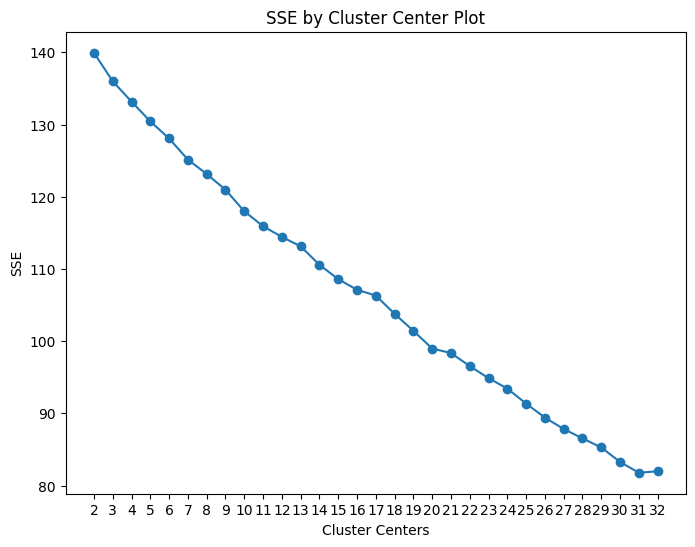

In [ ]:
find_optimal_clusters(titles_tfidf, 32)

In [ ]:
title_clusters = KMeans(n_clusters=8, random_state=20).fit_predict(titles_tfidf)
title_clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([4, 1, 3, 2, 3, 4, 2, 0, 3, 1, 6, 0, 0, 7, 6, 3, 5, 2, 6, 0, 1, 5,
       1, 5, 3, 5, 7, 7, 5, 0, 7, 2, 4, 1, 5, 5, 0, 3, 6, 1, 6, 4, 4, 5,
       5, 5, 6, 7, 5, 3, 1, 5, 4, 4, 5, 6, 5, 4, 3, 7, 2, 4, 6, 6, 4, 1,
       1, 4, 5, 3, 4, 4, 7, 4, 5, 5, 7, 7, 7, 5, 7, 0, 5, 5, 6, 3, 1, 6,
       3, 4, 5, 6, 5, 7, 3, 3, 3, 4, 6, 2, 2, 3, 5, 3, 6, 4, 0, 0, 0, 7,
       0, 0, 0, 0, 2, 1, 7, 3, 1, 0, 4, 7, 0, 6, 1, 4, 0, 2, 0, 6, 1, 0,
       2, 5, 0, 0, 6, 2, 2, 2, 4, 4, 0, 0, 5, 6, 0, 2, 2, 2, 2, 2, 2, 2],
      dtype=int32)

In [ ]:
silhouette_avg = silhouette_score(titles_tfidf, title_clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.04601882900082353


### 8. Word to Vec On All_Vocabs

In [ ]:
model = Word2Vec(all_vocabs, min_count=1)

w2v = dict(zip(model.wv.index_to_key , model.wv.vectors))
class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        self.dim = len(next(iter(word2vec.values())))

    def fit(self, X, y):
        return self

    def transform(self, X):
        return np.array([
            np.mean([self.word2vec[w] for w in words if w in self.word2vec]
                    or [np.zeros(self.dim)], axis=0)
            for words in X
        ])

In [ ]:
modelw = MeanEmbeddingVectorizer(w2v)
vectors_w2v = modelw.transform(all_vocabs)

In [ ]:
vectors_w2v

array([[ 0.07622708,  0.03034389,  0.27963296, ..., -0.10592059,
         0.0773296 ,  0.3430685 ],
       [ 0.1058431 ,  0.0449662 ,  0.35913846, ..., -0.08081776,
        -0.0227838 ,  0.25517932],
       [ 0.08535495,  0.03739829,  0.32553333, ..., -0.09816295,
         0.07649846,  0.3059765 ],
       ...,
       [ 0.10220271,  0.07953086,  0.2987338 , ..., -0.08907285,
         0.01192571,  0.31237578],
       [ 0.06516537,  0.03454731,  0.30052817, ..., -0.1318195 ,
         0.01395714,  0.29673365],
       [ 0.08222001,  0.04139447,  0.30566427, ..., -0.10524274,
         0.00919198,  0.28747085]], dtype=float32)

In [ ]:
vectors_w2v.shape

(154, 100)

### 9. Word To Vec On All_Titles

In [ ]:
all_titles

['ارزیابی_آمادگی آمادگی_مدارس مدارس_ابتدایی ابتدایی_شهر شهر_تهران تهران_استقرار استقرار_مدیریت مدیریت_مدرسه مدرسه_محور ارزیابی آمادگی مدارس ابتدایی شهر تهران استقرار مدیریت مدرسه محور',
 'بررسی_تحولات تحولات_مدیریت مدیریت_آموزشی آموزشی_مطالعه مطالعه_کیفی بررسی تحولات مدیریت آموزشی مطالعه کیفی',
 'بررسی_چالش چالش_آموزشی آموزشی_پژوهشی پژوهشی_سازمانی سازمانی_اعضا اعضا_هیئتعلمی هیئتعلمی_تازهکار تازهکار_دانشگاه دانشگاه_قندهار قندهار_افغانستان بررسی چالش آموزشی پژوهشی سازمانی اعضا هیئتعلمی تازهکار دانشگاه قندهار افغانستان',
 'توسعه_زیستبوم زیستبوم_کارآفرینی کارآفرینی_دانشجویی دانشجویی_رویکرد رویکرد_آزمایشگاه آزمایشگاه_زنده توسعه زیستبوم کارآفرینی دانشجویی رویکرد آزمایشگاه زنده',
 'تحلیل_عوامل عوامل_دلبستگی دلبستگی_شغل شغل_کارکنان کارکنان_دانشگاه دانشگاه_شهید شهید_بهشتی بهشتی_وفاداری وفاداری_دانشگاه تحلیل عوامل دلبستگی شغل کارکنان دانشگاه شهید بهشتی وفاداری دانشگاه',
 'تجربه_زندگی زندگی_تیم تیم_راه\u200cاندازی راه\u200cاندازی_دانشگاه تجربه زندگی تیم راه\u200cاندازی دانشگاه',
 'شناسایی_ابعاد ا

In [ ]:
titles_model = Word2Vec(all_titles, min_count=1)

titles_w2v = dict(zip(titles_model.wv.index_to_key , titles_model.wv.vectors))

titles_modelw = MeanEmbeddingVectorizer(titles_w2v)
titles_vectors_w2v = titles_modelw.transform(all_titles)

In [ ]:
titles_vectors_w2v

array([[-0.12112248,  0.21680582,  0.03918174, ..., -0.09874001,
         0.02914571,  0.14406073],
       [-0.12224182,  0.21745902,  0.04087986, ..., -0.09745885,
         0.02963422,  0.14732583],
       [-0.12080997,  0.216382  ,  0.03736914, ..., -0.09817338,
         0.03290947,  0.14844868],
       ...,
       [-0.12300662,  0.21751815,  0.03936876, ..., -0.1002694 ,
         0.02818561,  0.14540127],
       [-0.12163548,  0.21846764,  0.03942303, ..., -0.09987392,
         0.02889429,  0.1460967 ],
       [-0.12323771,  0.21801552,  0.03968849, ..., -0.09837876,
         0.02746787,  0.14711428]], dtype=float32)

### Plot Word To Vec On All_Titles

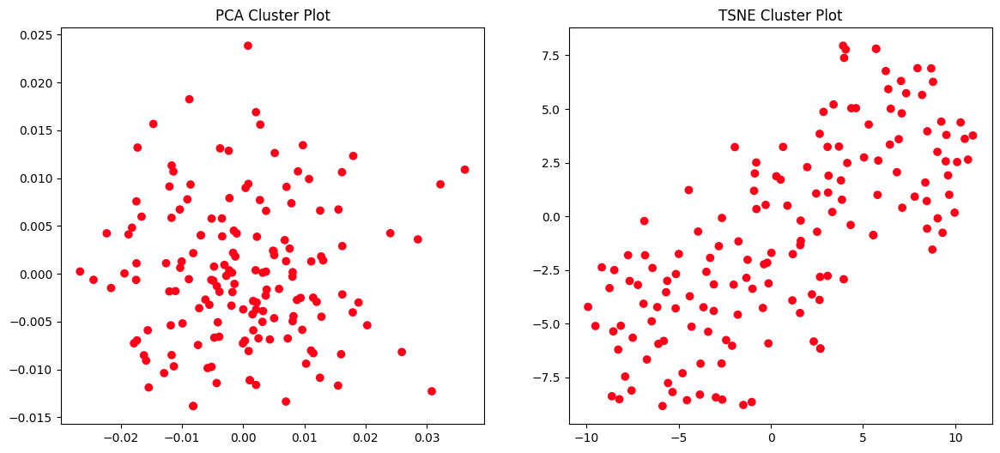

In [ ]:
plot_tsne_pca_2d(titles_vectors_w2v, np.array([1]*len(titles_vectors_w2v)))

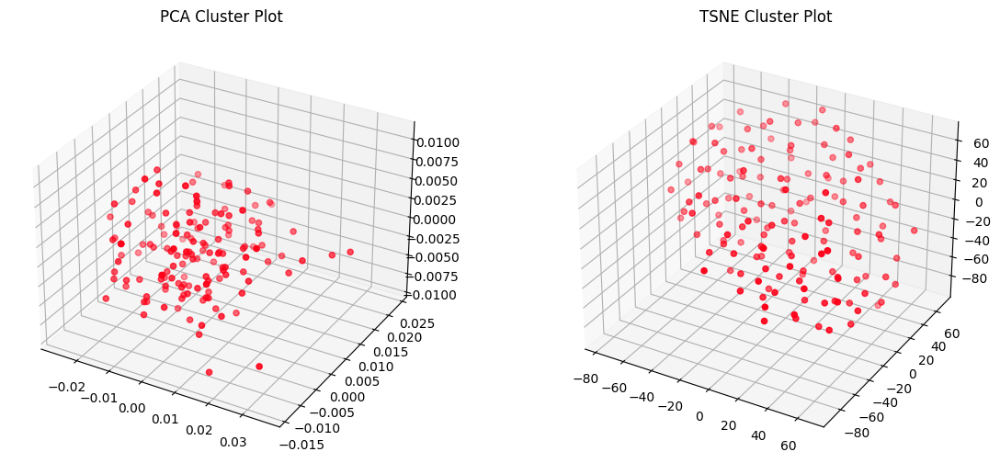

In [ ]:
plot_tsne_pca_3d(titles_vectors_w2v, np.array([1]*len(titles_vectors_w2v)))

In [ ]:
titles_vectors_w2v.shape

(154, 100)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 2 clusters with sse 0.023608267307281494
Fit 3 clusters with sse 0.01978149265050888


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 4 clusters with sse 0.016996942460536957
Fit 5 clusters with sse 0.015535670332610607


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 6 clusters with sse 0.01465766504406929
Fit 7 clusters with sse 0.013833314180374146


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 8 clusters with sse 0.013156726956367493


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 9 clusters with sse 0.012535369023680687
Fit 10 clusters with sse 0.012170408852398396


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 11 clusters with sse 0.01171102561056614
Fit 12 clusters with sse 0.011206189170479774


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 13 clusters with sse 0.010886909440159798
Fit 14 clusters with sse 0.010577310808002949


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 15 clusters with sse 0.010393653064966202


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 16 clusters with sse 0.010093703866004944
Fit 17 clusters with sse 0.00982489064335823


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 18 clusters with sse 0.009635803289711475


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 19 clusters with sse 0.009363467805087566
Fit 20 clusters with sse 0.009289856068789959


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


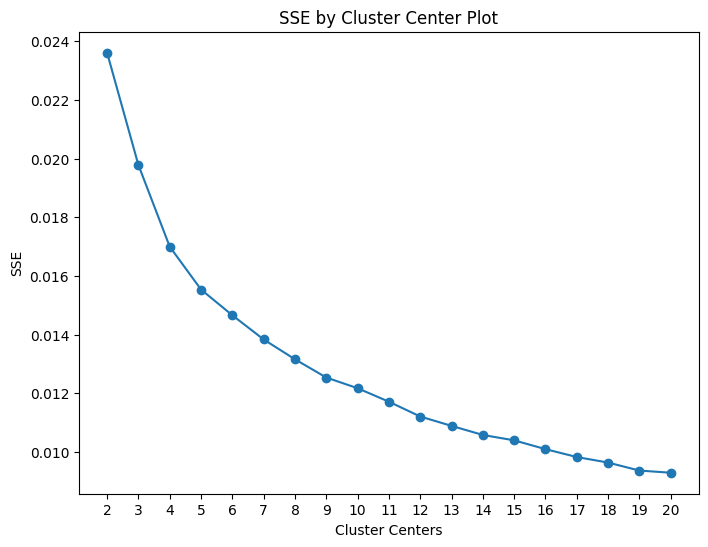

In [ ]:
find_optimal_clusters(titles_vectors_w2v, 20)

In [ ]:
clusters_title = KMeans(n_clusters=6, random_state=20, init='k-means++').fit_predict(titles_vectors_w2v)
clusters_title

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([4, 2, 2, 1, 4, 4, 4, 1, 3, 0, 0, 0, 2, 4, 2, 5, 0, 3, 1, 2, 3, 5,
       4, 1, 2, 0, 4, 3, 2, 2, 4, 5, 0, 3, 1, 1, 4, 2, 5, 2, 0, 2, 0, 3,
       5, 2, 0, 5, 2, 4, 4, 1, 3, 5, 1, 3, 1, 0, 3, 2, 2, 5, 4, 2, 0, 2,
       2, 4, 1, 4, 2, 3, 3, 3, 1, 3, 0, 0, 0, 0, 0, 3, 3, 5, 0, 0, 3, 1,
       4, 3, 3, 4, 1, 5, 4, 0, 4, 4, 4, 3, 0, 0, 1, 2, 1, 3, 0, 3, 2, 1,
       5, 3, 0, 3, 0, 0, 5, 2, 2, 3, 0, 4, 4, 2, 4, 4, 2, 0, 1, 2, 1, 3,
       2, 1, 0, 2, 4, 0, 3, 3, 0, 0, 1, 2, 4, 4, 5, 1, 0, 0, 4, 0, 5, 3],
      dtype=int32)

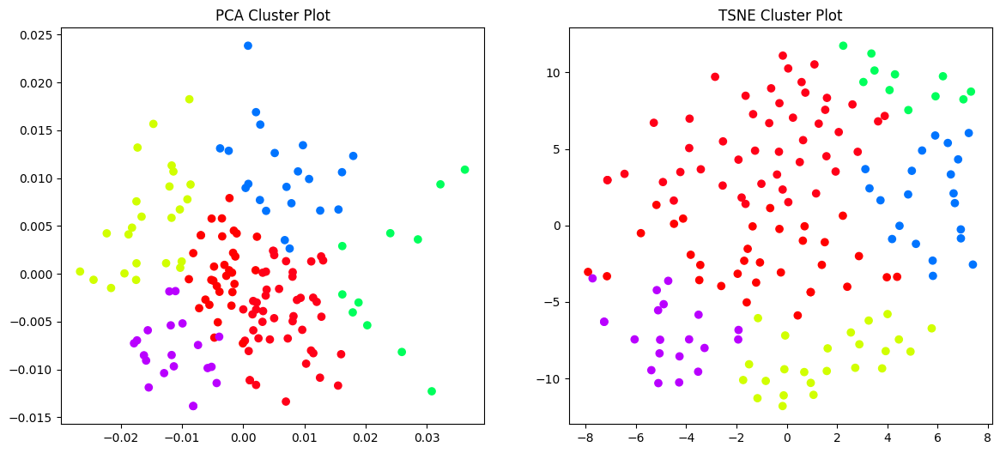

In [ ]:
plot_tsne_pca_2d(titles_vectors_w2v, clusters_title)

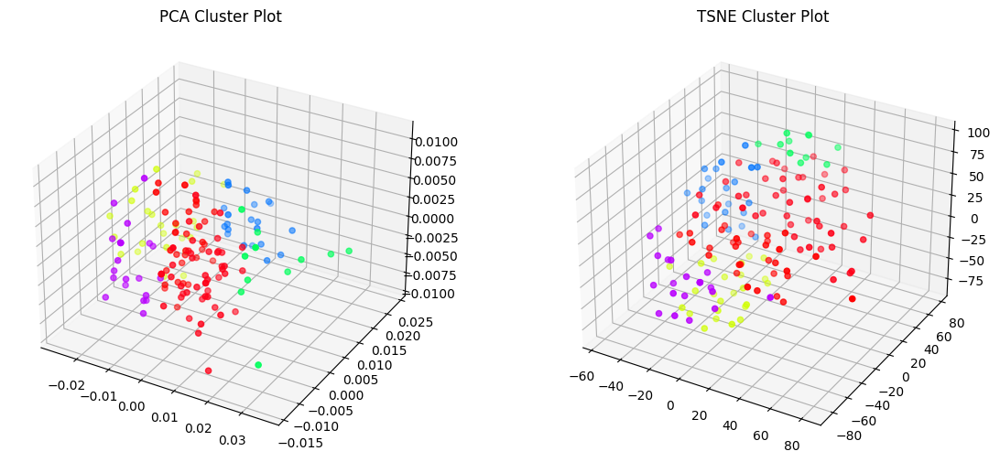

In [ ]:
plot_tsne_pca_3d(titles_vectors_w2v, clusters_title)

In [ ]:
title_w2v_clustered_dataset = pd.DataFrame({'title': token_df['title'], 'author': token_df['author'], 'cluster': clusters_title, 'label': token_df['class_label']})

<Axes: title={'center': 'cluster'}, ylabel='Frequency'>

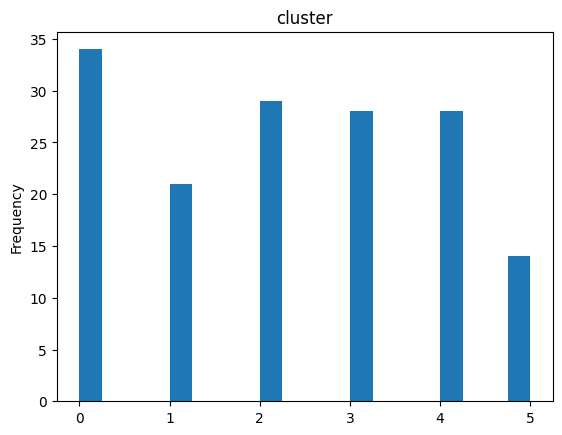

In [ ]:
title_w2v_clustered_dataset['cluster'].plot(kind='hist', bins=20, title='cluster')

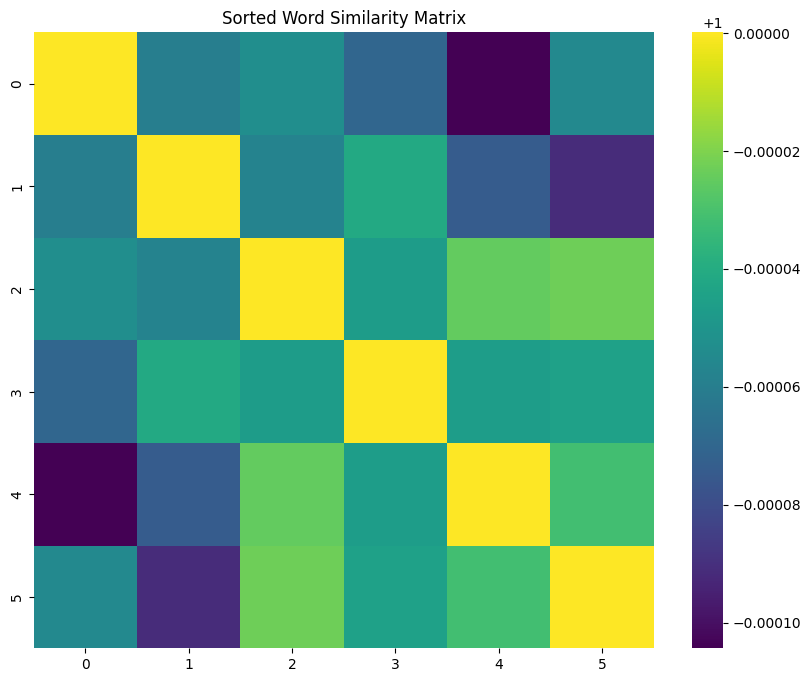

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

# Example data (replace with your actual data)
words = ['c1', 'c2', 'c3', 'c4', 'c5', 'c6']
w2v_matrix = titles_vectors_w2v
clusters = clusters_title

# Create a list of tuples (word, vector, cluster)
word_vector_cluster = list(zip(words, w2v_matrix, clusters))

# Sort the list by clusters
word_vector_cluster_sorted = sorted(word_vector_cluster, key=lambda x: x[2])

# Unzip the sorted list
words_sorted, w2v_matrix_sorted, clusters_sorted = zip(*word_vector_cluster_sorted)

# Convert to numpy arrays
w2v_matrix_sorted = np.array(w2v_matrix_sorted)

# Calculate the cosine similarity matrix
similarity_matrix = cosine_similarity(w2v_matrix_sorted)

# Create a heatmap for the sorted similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, cmap='viridis')
plt.title('Sorted Word Similarity Matrix')
plt.show()


In [ ]:
title_w2v_clustered_dataset[title_w2v_clustered_dataset['cluster'] == 0]

,title,author,cluster,label
id,,,,
10,تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...,فرنوش اعلامی,0,آموزش و سازماندهی دانشگاهی
11,بررسی نقش تداوم یادگیری الکترونیکی بر توسعه حر...,فرنوش اعلامی,0,آموزش الکترونیکی
12,بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...,فرنوش اعلامی,0,آموزش و سازماندهی دانشگاهی
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,0,انتخاب افراد شایسته
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,0,انقلاب
33,چرخش از عالم دو قطبی به جهان سه درجه‌ای,جمیله علم الهدی,0,تربیت - رویکرد اسلامی
43,تعیین کنندگان اثربخشی یادگیری الکترونیکی: مطال...,محمد قهرمانی,0,آموزش الکترونیکی
45,طراحی مدل تعالی نظام دانشگاهی با تاکید بر بنیا...,محمد قهرمانی,0,آموزش و سازماندهی دانشگاهی
49,عوامل سازمانی و زمینه ای توسعه حرفه‌ای معلمان ...,محمد قهرمانی,0,مدیریت آموزشی و هدایت تحصیلی


In [ ]:
title_w2v_clustered_dataset[title_w2v_clustered_dataset['cluster'] == 1]

,title,author,cluster,label
id,,,,
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,1,اشتغال و کارآفرینی
6,تجربه زندگی تیم های راه اندازی دانشگاه.,فرنوش اعلامی,1,اشتغال و کارآفرینی
8,تأثیر آموزش کارآفرینی مبتنی بر فناوری بر توانم...,فرنوش اعلامی,1,اشتغال و کارآفرینی
19,شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...,غلامرضا شمس,1,آموزش الکترونیکی
24,شناسایی شایستگی‌های رهبران آینده در نظام آموزش...,محمود ابوالقاسمی,1,انتخاب افراد شایسته
37,کلاس معکوس در آموزش عالی ایران: با تاکید بر مز...,جمیله علم الهدی,1,آموزش و سازماندهی دانشگاهی - کلاس معکوس
54,بررسی نظام آموزش و توسعه کارکنان در سازمان های...,محمد قهرمانی,1,اشتغال و کارآفرینی
59,چالش‌های برون‌سپاری آموزش به مؤسسات ارائه دهند...,محمد قهرمانی,1,آموزش و سازماندهی دانشگاهی
71,آموزش دانشگاه: یک پدیده غفلت شده در سیستم آموز...,محمد یمنی دوزی سرخابی,1,آموزش و سازماندهی دانشگاهی


In [ ]:
title_w2v_clustered_dataset[title_w2v_clustered_dataset['cluster'] == 2]

,title,author,cluster,label
id,,,,
16,شناسایی چالش‌ها و فرصت‌های توسعه سازمانی از طر...,غلامرضا شمس,2,توسعه سازمانی و استفاده از فناوری
41,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,محمد قهرمانی,2,آموزش الکترونیکی
47,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مدیران ...,محمد قهرمانی,2,انتخاب افراد شایسته
50,ارزشیابی خروجی‌ها، اثرات و پیامدهای پژوهش های ...,محمد قهرمانی,2,مدیریت - انتخاب افراد شایسته
64,یک مطالعه تحلیلی از جنبه ها و مؤلفه های تحقیقا...,محمد یمنی دوزی سرخابی,2,آموزش و سازماندهی دانشگاهی
67,تجزیه و تحلیل اثرات ادغام بر فرهنگ دانشگاهی.,محمد یمنی دوزی سرخابی,2,آموزش و سازماندهی دانشگاهی
73,آسیب شناسی ساختاری پردیس خودمختار دانشگاههای د...,محمد یمنی دوزی سرخابی,2,آموزش و سازماندهی دانشگاهی
86,تاریخ فلسفه تعلیم و تربیت در ایران,رضا محمدی چابکی,2,فلسفه تعلیم و تربیت
115,مقايسه تأثير روش‌های مختلف ارزشيابی توصيفی بر ...,محمدرضا سرمدي,2,مدیریت آموزشی و هدایت تحصیلی


In [ ]:
title_w2v_clustered_dataset[title_w2v_clustered_dataset['cluster'] == 3]

,title,author,cluster,label
id,,,,
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,3,آموزش و سازماندهی دانشگاهی
15,دوره‌های الکترونیکی اثربخش سازمانی: توجه مضاع...,غلامرضا شمس,3,آموزش الکترونیکی
22,طراحی الگوی تخصیص منابع آموزش عالی در ایران,محمود ابوالقاسمی,3,مدیریت آموزشی و هدایت تحصیلی
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,3,آموزش و سازماندهی دانشگاهی
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,جمیله علم الهدی,3,آموزش و سازماندهی دانشگاهی - کلاس معکوس
42,شناسایی شاخص های اثرگذار در طراحی سامانه موبای...,محمد قهرمانی,3,آموزش الکترونیکی
44,آسیب شناسی برنامه های آموزش مداوم پرستاران: یک...,محمد قهرمانی,3,مدیریت آموزشی و هدایت تحصیلی - پرستاری
57,تدوین الگوی مدیریت استراتژیک آموزش عالی ایران,محمد قهرمانی,3,آموزش و سازماندهی دانشگاهی
63,عملکرد هیئت امنا در دانشگاه های علوم پزشکی ایا...,محمد یمنی دوزی سرخابی,3,آموزش و سازماندهی دانشگاهی


In [ ]:
title_w2v_clustered_dataset[title_w2v_clustered_dataset['cluster'] == 4]

,title,author,cluster,label
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,4,مدیریت آموزشی و هدایت تحصیلی
14,ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...,غلامرضا شمس,4,انتخاب افراد شایسته
23,بررسی نقش و اهمیت مدیران ارشد دانش در توسعه مد...,محمود ابوالقاسمی,4,آموزش و سازماندهی دانشگاهی
53,تجارب اعضای هیأت علمی از نخستین روزهای تدریس د...,محمد قهرمانی,4,آموزش و سازماندهی دانشگاهی
55,تبیین مدل بومی مدیریت مدارس متوسطه استان کرمان,محمد قهرمانی,4,مدیریت آموزشی و هدایت تحصیلی
60,مدل ادراک و نگرش معلمان نسبت به توسعه حرفه‌ای ...,محمد قهرمانی,4,مدیریت آموزشی و هدایت تحصیلی
61,بررسی رابطه‌ی میان ساختار سازمانی و کارآفرینی ...,محمد قهرمانی,4,اشتغال و کارآفرینی
65,به دنبال ارزش از طریق یادگیری شبکه ای در زمینه...,محمد یمنی دوزی سرخابی,4,یادگیری شبکه‌ای
70,تأمل در فعالیت های دانشگاهی در دانشگاه ها از د...,محمد یمنی دوزی سرخابی,4,آموزش و سازماندهی دانشگاهی - کلاس معکوس


In [ ]:
title_w2v_clustered_dataset[title_w2v_clustered_dataset['cluster'] == 5]

,title,author,cluster,label
id,,,,
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,5,مدیریت آموزشی و هدایت تحصیلی
10,تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...,فرنوش اعلامی,5,آموزش و سازماندهی دانشگاهی
11,بررسی نقش تداوم یادگیری الکترونیکی بر توسعه حر...,فرنوش اعلامی,5,آموزش الکترونیکی
12,بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...,فرنوش اعلامی,5,آموزش و سازماندهی دانشگاهی
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,5,انتخاب افراد شایسته
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,5,انقلاب
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,5,آموزش و سازماندهی دانشگاهی
28,مناسبات تربیتی خانواده و دولت,جمیله علم الهدی,5,خانواده و دولت - رویکرد اسلامی
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,5,مدیریت آموزشی و هدایت تحصیلی


In [ ]:
silhouette_avg = silhouette_score(titles_vectors_w2v, clusters_title)

print("The average silhouette_score is :", silhouette_avg)


The average silhouette_score is : 0.16692628


In [ ]:
from sklearn.metrics import davies_bouldin_score

dbs = davies_bouldin_score(titles_vectors_w2v, clusters_title)
print(dbs)

1.473047982611616


### Plot Word To Vec On All_Vocabs

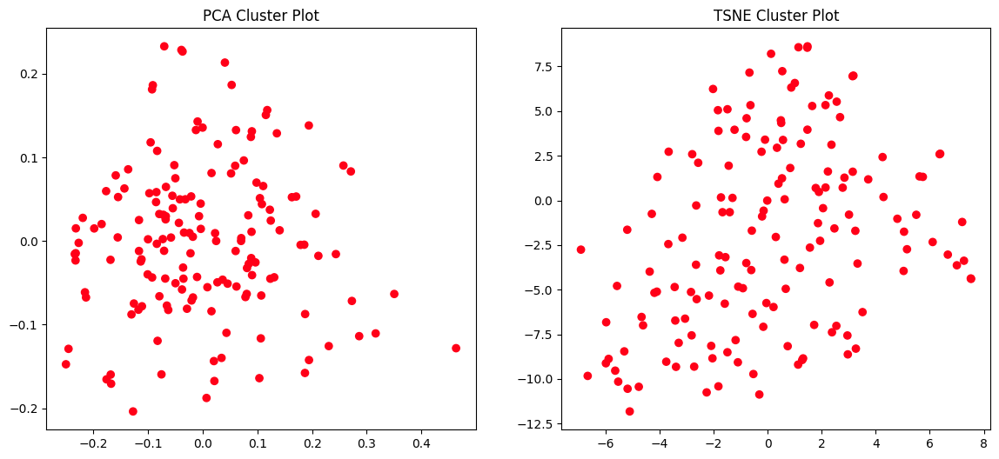

In [ ]:
plot_tsne_pca_2d(vectors_w2v, np.array([1]*len(vectors_w2v)))

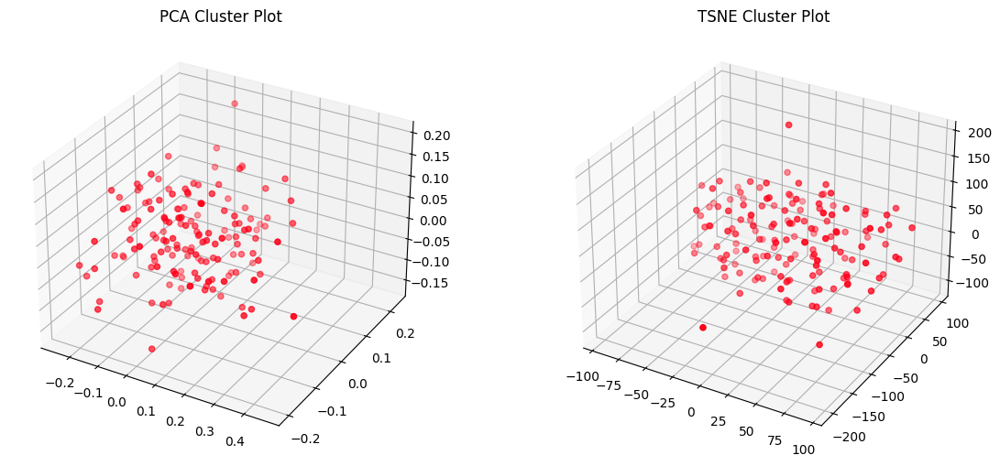

In [ ]:
plot_tsne_pca_3d(vectors_w2v, np.array([1]*len(vectors_w2v)))

In [ ]:
vectors_w2v.shape

(154, 100)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 2 clusters with sse 6.388071060180664
Fit 3 clusters with sse 5.780117988586426


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 4 clusters with sse 5.360574722290039
Fit 5 clusters with sse 5.089345932006836


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 6 clusters with sse 4.802106857299805


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 7 clusters with sse 4.571026802062988


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 8 clusters with sse 4.3661932945251465
Fit 9 clusters with sse 4.179605007171631


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 10 clusters with sse 4.036129474639893


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 11 clusters with sse 3.9025487899780273


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 12 clusters with sse 3.767035961151123


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 13 clusters with sse 3.7417638301849365


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 14 clusters with sse 3.6135001182556152


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 15 clusters with sse 3.5508546829223633


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 16 clusters with sse 3.4149091243743896


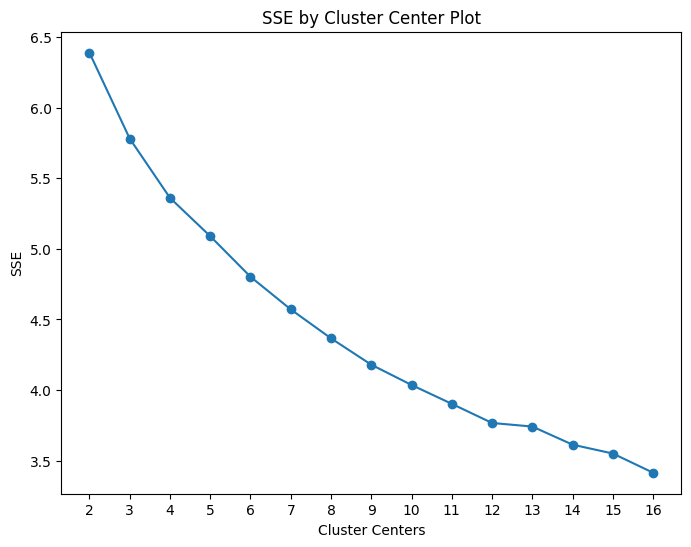

In [ ]:
find_optimal_clusters(vectors_w2v, 16)

In [ ]:
clusters = KMeans(n_clusters=7, random_state=20).fit_predict(vectors_w2v)
clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([6, 5, 5, 6, 0, 5, 1, 2, 1, 3, 0, 6, 5, 1, 2, 4, 1, 1, 5, 1, 6, 1,
       6, 6, 5, 4, 6, 4, 3, 1, 3, 4, 4, 1, 5, 0, 1, 3, 0, 1, 0, 5, 3, 1,
       1, 1, 5, 6, 5, 3, 3, 5, 3, 1, 1, 0, 5, 4, 6, 5, 3, 4, 3, 3, 3, 5,
       5, 3, 5, 3, 6, 1, 3, 6, 5, 3, 4, 4, 3, 1, 6, 2, 3, 4, 0, 3, 5, 3,
       5, 0, 6, 2, 2, 1, 2, 6, 2, 3, 0, 5, 6, 1, 5, 5, 6, 5, 4, 0, 5, 2,
       5, 5, 5, 4, 4, 4, 5, 5, 5, 1, 3, 6, 6, 5, 3, 6, 1, 3, 5, 5, 2, 6,
       2, 5, 2, 2, 0, 4, 2, 2, 4, 3, 2, 2, 6, 6, 6, 2, 0, 4, 6, 1, 5, 1],
      dtype=int32)

In [ ]:
# get_top_keywords(vectors_w2v, clusters, tfidf.get_feature_names_out(), 10)

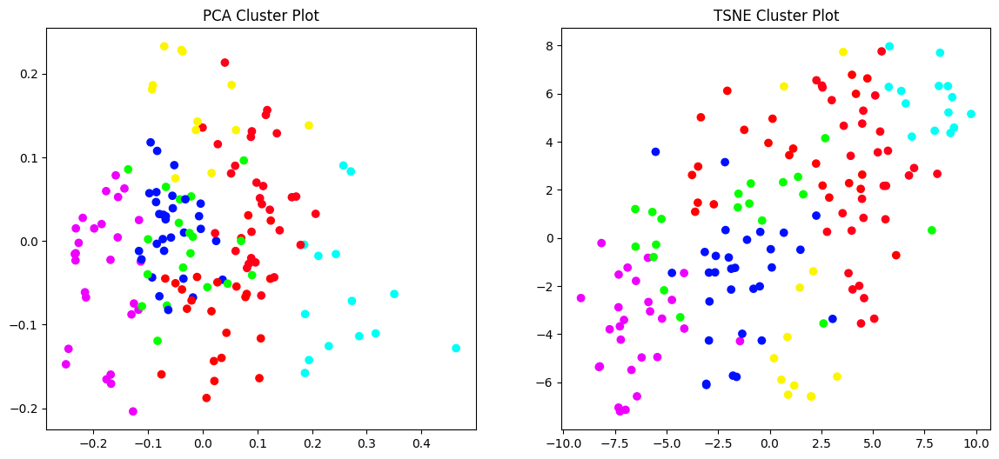

In [ ]:
plot_tsne_pca_2d(vectors_w2v, clusters)

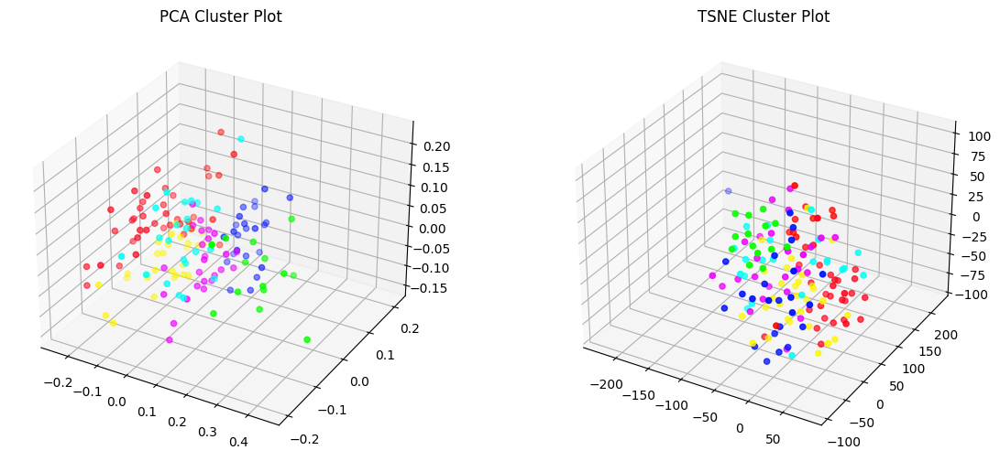

In [ ]:
plot_tsne_pca_3d(vectors_w2v, clusters)

In [ ]:
w2v_clustered_dataset = pd.DataFrame({'title': token_df['title'], 'author': token_df['author'], 'cluster': clusters, 'label': token_df['class_label']})

<Axes: title={'center': 'cluster'}, ylabel='Frequency'>

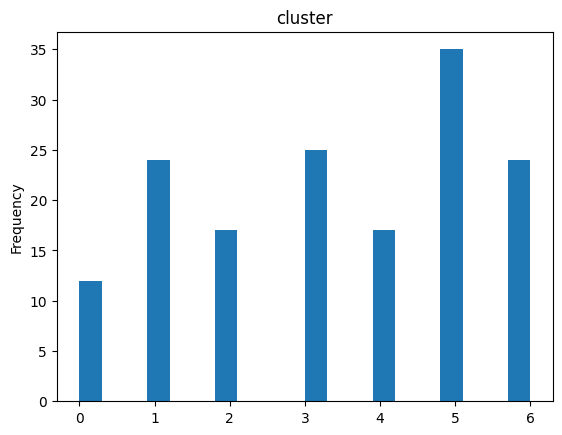

In [ ]:
w2v_clustered_dataset['cluster'].plot(kind='hist', bins=20, title='cluster')

In [ ]:
w2v_clustered_dataset[w2v_clustered_dataset['cluster'] == 0]

,title,author,cluster,label
id,,,,
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,0,مدیریت آموزشی و هدایت تحصیلی
13,مطالعه و ارائه الگوی مفهومی و کاربردی استارت آ...,فرنوش اعلامی,0,اشتغال و کارآفرینی
15,دوره‌های الکترونیکی اثربخش سازمانی: توجه مضاع...,غلامرضا شمس,0,آموزش الکترونیکی
19,شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...,غلامرضا شمس,0,آموزش الکترونیکی
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,0,آموزش و سازماندهی دانشگاهی
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,جمیله علم الهدی,0,آموزش و سازماندهی دانشگاهی - کلاس معکوس
44,آسیب شناسی برنامه های آموزش مداوم پرستاران: یک...,محمد قهرمانی,0,مدیریت آموزشی و هدایت تحصیلی - پرستاری
49,عوامل سازمانی و زمینه ای توسعه حرفه‌ای معلمان ...,محمد قهرمانی,0,مدیریت آموزشی و هدایت تحصیلی
51,آسیب شناسی فرایند سیاست پژوهی در نظام آموزش عا...,محمد قهرمانی,0,سیاست - سازماندهی آموزشی


In [ ]:
w2v_clustered_dataset[w2v_clustered_dataset['cluster'] == 1]

,title,author,cluster,label
id,,,,
7,شناسایی ابعاد و مولفه‌های کلیدی اشتغال‌پذیری د...,فرنوش اعلامی,1,اشتغال و کارآفرینی
9,بررسی نقش برنامه‌های درسی رشته‌های علوم اجتماع...,فرنوش اعلامی,1,اشتغال و کارآفرینی
14,ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...,غلامرضا شمس,1,انتخاب افراد شایسته
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,1,انتخاب افراد شایسته
18,طراحی و اعتباربخشی الگوی مطلوب برنامه درسی رشت...,غلامرضا شمس,1,اشتغال و کارآفرینی
20,طراحی الگوهای مناسب جهت هدایت تحصیلی دانش آموز...,محمود ابوالقاسمی,1,مدیریت آموزشی و هدایت تحصیلی
22,طراحی الگوی تخصیص منابع آموزش عالی در ایران,محمود ابوالقاسمی,1,مدیریت آموزشی و هدایت تحصیلی
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,1,مدیریت آموزشی و هدایت تحصیلی
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,1,آموزش و سازماندهی دانشگاهی


In [ ]:
w2v_clustered_dataset[w2v_clustered_dataset['cluster'] == 2]

,title,author,cluster,label
id,,,,
9,بررسی نقش برنامه‌های درسی رشته‌های علوم اجتماع...,فرنوش اعلامی,2,اشتغال و کارآفرینی
20,طراحی الگوهای مناسب جهت هدایت تحصیلی دانش آموز...,محمود ابوالقاسمی,2,مدیریت آموزشی و هدایت تحصیلی
22,طراحی الگوی تخصیص منابع آموزش عالی در ایران,محمود ابوالقاسمی,2,مدیریت آموزشی و هدایت تحصیلی
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,2,آموزش و سازماندهی دانشگاهی
38,طراحی و اعتباریابی الگوی تربیت توحیدی در دوره ...,جمیله علم الهدی,2,مدیریت آموزشی و هدایت تحصیلی
42,شناسایی شاخص های اثرگذار در طراحی سامانه موبای...,محمد قهرمانی,2,آموزش الکترونیکی
46,طراحی و اعتباریابی الگوی آسیب شناسی فرایند سیا...,محمد قهرمانی,2,سیاست - سازماندهی آموزشی
47,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مدیران ...,محمد قهرمانی,2,انتخاب افراد شایسته
48,تبیین علی ظرفیت خط مشی های نظام آموزش عالی ایر...,محمد قهرمانی,2,سیاست - سازماندهی آموزشی


In [ ]:
w2v_clustered_dataset[w2v_clustered_dataset['cluster'] == 4]

,title,author,cluster,label
id,,,,
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,4,مدیریت منابع انسانی و علوم رفتاری
6,تجربه زندگی تیم های راه اندازی دانشگاه.,فرنوش اعلامی,4,اشتغال و کارآفرینی
10,تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...,فرنوش اعلامی,4,آموزش و سازماندهی دانشگاهی
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,4,آموزش و سازماندهی دانشگاهی
39,شناسایی الگوی مطلوب نظارت بر پایان‌نامه‌ها مطا...,محمد قهرمانی,4,آموزش و سازماندهی دانشگاهی
45,طراحی مدل تعالی نظام دانشگاهی با تاکید بر بنیا...,محمد قهرمانی,4,آموزش و سازماندهی دانشگاهی
52,ارزیابی معیارهای موثر بر شایسته یابی و شایسته ...,محمد قهرمانی,4,انتخاب افراد شایسته - سازماندهی آموزشی
53,تجارب اعضای هیأت علمی از نخستین روزهای تدریس د...,محمد قهرمانی,4,آموزش و سازماندهی دانشگاهی
58,بررسی و ارائه یک الگوی تضمین کیفیت در مراکز یا...,محمد قهرمانی,4,آموزش الکترونیکی


In [ ]:
w2v_clustered_dataset[w2v_clustered_dataset['cluster'] == 5]

,title,author,cluster,label
id,,,,
7,شناسایی ابعاد و مولفه‌های کلیدی اشتغال‌پذیری د...,فرنوش اعلامی,5,اشتغال و کارآفرینی
14,ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...,غلامرضا شمس,5,انتخاب افراد شایسته
16,شناسایی چالش‌ها و فرصت‌های توسعه سازمانی از طر...,غلامرضا شمس,5,توسعه سازمانی و استفاده از فناوری
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,5,انتخاب افراد شایسته
18,طراحی و اعتباربخشی الگوی مطلوب برنامه درسی رشت...,غلامرضا شمس,5,اشتغال و کارآفرینی
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,5,انقلاب
28,مناسبات تربیتی خانواده و دولت,جمیله علم الهدی,5,خانواده و دولت - رویکرد اسلامی
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,5,مدیریت آموزشی و هدایت تحصیلی
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,5,مدیریت آموزشی و هدایت تحصیلی


In [ ]:
w2v_clustered_dataset[w2v_clustered_dataset['cluster'] == 6]

,title,author,cluster,label
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,6,مدیریت آموزشی و هدایت تحصیلی
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,6,آموزش و سازماندهی دانشگاهی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,6,اشتغال و کارآفرینی
12,بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...,فرنوش اعلامی,6,آموزش و سازماندهی دانشگاهی
21,بررسی رابطه میان ساختار سازمانی و کارآفرینی سا...,محمود ابوالقاسمی,6,ساختار سازمانی - اشتغال و کارآفرینی
23,بررسی نقش و اهمیت مدیران ارشد دانش در توسعه مد...,محمود ابوالقاسمی,6,آموزش و سازماندهی دانشگاهی
24,شناسایی شایستگی‌های رهبران آینده در نظام آموزش...,محمود ابوالقاسمی,6,انتخاب افراد شایسته
25,بررسی چالش‌های آموزش عالی بین‌المللی در دانشگا...,محبوبه عارفی,6,آموزش و سازماندهی دانشگاهی
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,6,آموزش و سازماندهی دانشگاهی


In [ ]:
silhouette_avg = silhouette_score(vectors_w2v, clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.10972713


## Word To Vec with keywords

In [ ]:
model = Word2Vec(all_keywords, min_count=1)
w2v = dict(zip(model.wv.index_to_key , model.wv.vectors))

modelw = MeanEmbeddingVectorizer(w2v)
keywords_w2v = modelw.transform(all_keywords)

keywords_w2v.shape

(154, 100)

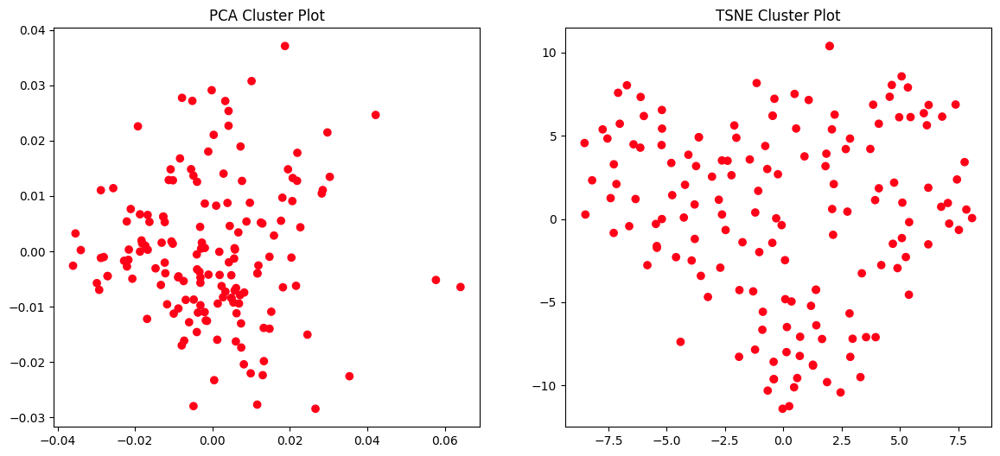

In [ ]:
plot_tsne_pca_2d(keywords_w2v, np.array([1]*len(keywords_w2v)))

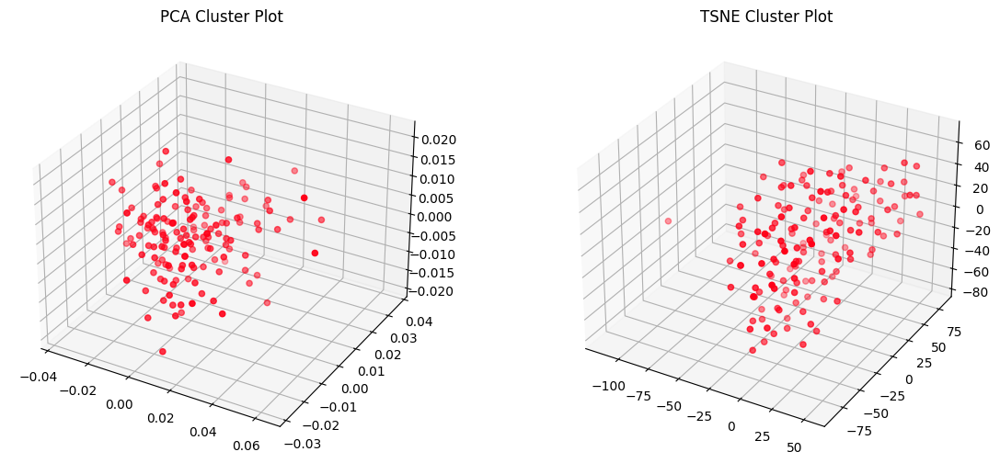

In [ ]:
plot_tsne_pca_3d(keywords_w2v, np.array([1]*len(keywords_w2v)))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 2 clusters with sse 0.05944807082414627
Fit 3 clusters with sse 0.045562878251075745
Fit 4 clusters with sse 0.037943173199892044


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 5 clusters with sse 0.03380078822374344
Fit 6 clusters with sse 0.029885008931159973


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 7 clusters with sse 0.027277830988168716
Fit 8 clusters with sse 0.025828789919614792
Fit 9 clusters with sse 0.02429109439253807


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 10 clusters with sse 0.023029090836644173
Fit 11 clusters with sse 0.0222463496029377


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 12 clusters with sse 0.021004660055041313


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 13 clusters with sse 0.020241383463144302


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 14 clusters with sse 0.019747382029891014
Fit 15 clusters with sse 0.01899973675608635


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 16 clusters with sse 0.018762946128845215


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 17 clusters with sse 0.017576763406395912


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 18 clusters with sse 0.016973599791526794


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 19 clusters with sse 0.01676761358976364


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 20 clusters with sse 0.01602328196167946


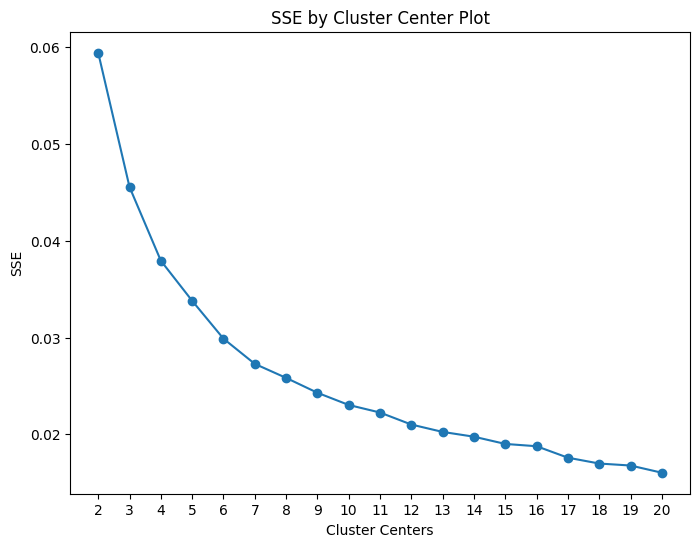

In [ ]:
find_optimal_clusters(keywords_w2v, 20)

In [ ]:
clusters = KMeans(n_clusters=7, random_state=20).fit_predict(keywords_w2v)
clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([1, 0, 6, 4, 1, 6, 6, 4, 3, 6, 3, 6, 4, 3, 6, 0, 1, 1, 6, 0, 6, 6,
       3, 6, 6, 0, 1, 6, 6, 3, 3, 0, 3, 4, 2, 4, 3, 0, 1, 4, 4, 2, 3, 2,
       0, 6, 0, 5, 2, 3, 1, 4, 1, 0, 6, 3, 2, 0, 6, 2, 6, 6, 3, 6, 1, 2,
       5, 6, 2, 3, 3, 5, 3, 6, 2, 6, 0, 3, 1, 3, 3, 1, 6, 0, 1, 6, 6, 4,
       2, 6, 4, 3, 4, 3, 2, 1, 2, 3, 3, 4, 1, 6, 2, 6, 1, 4, 3, 1, 1, 5,
       6, 0, 6, 3, 3, 2, 6, 2, 6, 4, 6, 3, 1, 4, 1, 3, 3, 3, 4, 3, 2, 6,
       6, 2, 0, 4, 3, 1, 3, 6, 3, 0, 1, 6, 1, 1, 4, 4, 3, 1, 3, 0, 3, 3],
      dtype=int32)

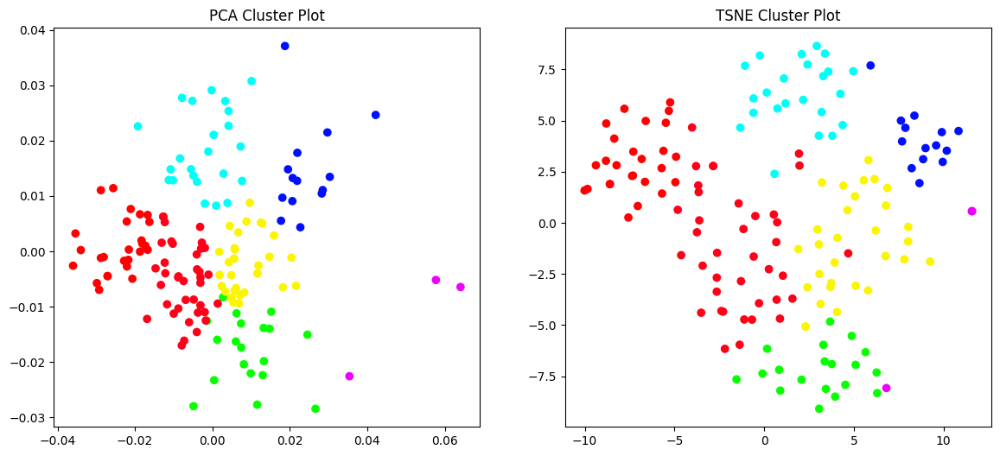

In [ ]:
plot_tsne_pca_2d(keywords_w2v, clusters)

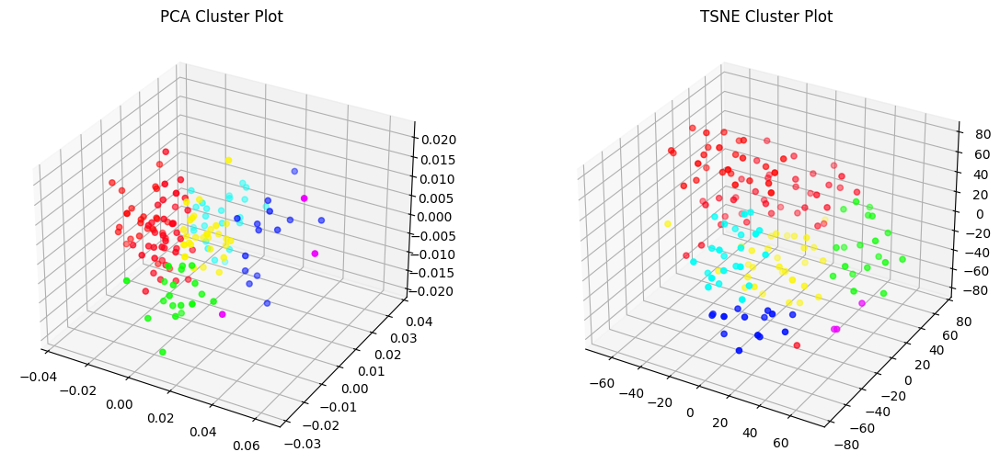

In [ ]:
plot_tsne_pca_3d(keywords_w2v, clusters)

In [ ]:
keywords_w2v_df = pd.DataFrame({'title': token_df['title'], 'author': token_df['author'], 'keywords': token_df['keywords'], 'cluster': clusters})

In [ ]:
keywords_w2v_df

,title,author,keywords,cluster
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,ارزیابی، مدارس ابتدایی، مدیریت مدرسه محور,1
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,تحولات رشته مدیریت آموزشی نقاط قوت و ضعف فرصت ...,0
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,چالش­های آموزشی چالش‌های پژوهشی چالش‌های ساز...,6
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,زیست بوم کارآفرینی کارآفرینی دانشجویی استارتاپ...,4
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,دلبستگی کارکنان وفاداری سازمانی دانشگاه شهید...,1
...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,\nبرنامه درسی ریاضی ، بنیان های منطقی یادگیری ...,1
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,ارزشیابی توصیفی ، ریاضی ، دوره ابتدائی,3
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,سواد مالی ، تصمیم گیری مالی ، ابزار مالی ، برن...,0


In [ ]:
silhouette_avg = silhouette_score(keywords_w2v, clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.21094988


In [ ]:
def show_clustering_result(titles, clusters):

  clustered_docs = [[] for i in range(max(clusters)+1)]
  for i in range(len(titles)):
    clustered_docs[clusters[i]].append(titles[i])


  for i in range(len(clustered_docs)):
    print(f'Cluster: {i}')
    for title in clustered_docs[i]:
      print(title)
    print()

In [ ]:
# show_clustering_result(token_df['title'], clusters) fix error

### Vectoring Using Transfomer - ParseBert

In [ ]:
from transformers import BertTokenizer
from keras.preprocessing.sequence import pad_sequences

In [ ]:
df = token_df

### Bert On Text

In [ ]:
tokenizer = BertTokenizer.from_pretrained("HooshvareLab/bert-base-parsbert-uncased")

bert_array = []
for text in token_df['suburl_title']:
    tokens = tokenizer.encode_plus(
                                    text,
                                    max_length=55,
                                    truncation=True,
                                    add_special_tokens=True, # Add '[CLS]' and '[SEP]'
                                    return_token_type_ids=True,
                                    return_attention_mask=True,
                                    padding='max_length',
                                    return_tensors='pt',  # Return PyTorch tensors
                                    )

    bert_array.append(list(tokens['input_ids'].flatten()))

bert_array = np.array(bert_array)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


vocab.txt:   0%|          | 0.00/1.22M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/434 [00:00<?, ?B/s]

In [ ]:
bert_array

array([[ 2, 24,  8, ...,  0,  0,  0],
       [ 2, 24,  8, ...,  0,  0,  0],
       [ 2, 24,  8, ...,  0,  0,  0],
       ...,
       [ 2, 24,  8, ...,  0,  0,  0],
       [ 2, 24,  8, ...,  0,  0,  0],
       [ 2, 24,  8, ..., 13,  8,  4]])

In [ ]:
bert_array.shape

(154, 55)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 2 clusters with sse 169567793173.36035
Fit 3 clusters with sse 156470981428.39697
Fit 4 clusters with sse 147656299739.67175
Fit 5 clusters with sse 134962072958.1272
Fit 6 clusters with sse 126424164452.14894
Fit 7 clusters with sse 117217909326.91878
Fit 8 clusters with sse 110078894871.26614
Fit 9 clusters with sse 103357200507.72635
Fit 10 clusters with sse 96254915571.47421
Fit 11 clusters with sse 91407971580.73672


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 12 clusters with sse 88769852157.77438
Fit 13 clusters with sse 80473719971.77695
Fit 14 clusters with sse 77566912066.6416


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 15 clusters with sse 72931795004.23227
Fit 16 clusters with sse 70760208653.04053


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 17 clusters with sse 68164186814.59955
Fit 18 clusters with sse 65129483342.043724


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 19 clusters with sse 64290901399.53208


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 20 clusters with sse 62041214624.95206


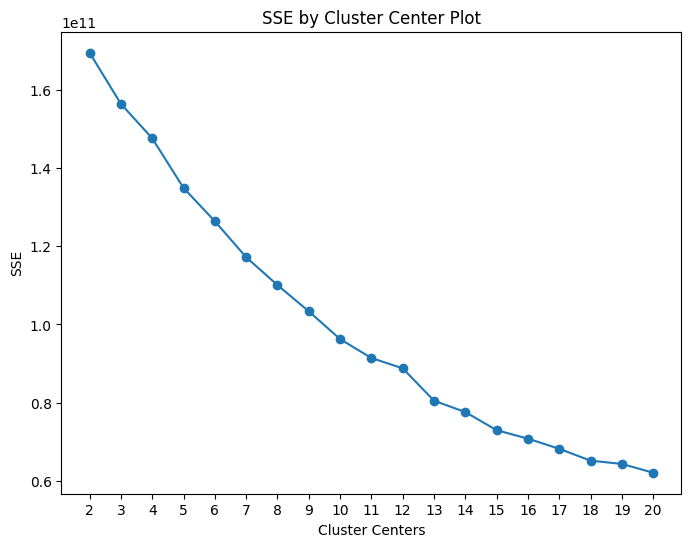

In [ ]:
find_optimal_clusters(bert_array, 20)

In [ ]:
clusters = KMeans(n_clusters=6, random_state=20).fit_predict(bert_array)
clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([1, 1, 0, 5, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 5, 1, 1, 1, 1,
       1, 5, 1, 1, 1, 1, 1, 3, 2, 2, 1, 5, 1, 0, 1, 1, 3, 1, 1, 0, 1, 0,
       1, 1, 1, 5, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 5, 1, 1, 1, 1, 1, 1, 0, 1, 5, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1,
       1, 1, 1, 4, 1, 1, 1, 1, 1, 5, 1, 1, 1, 2, 1, 1, 5, 1, 1, 1, 1, 1],
      dtype=int32)

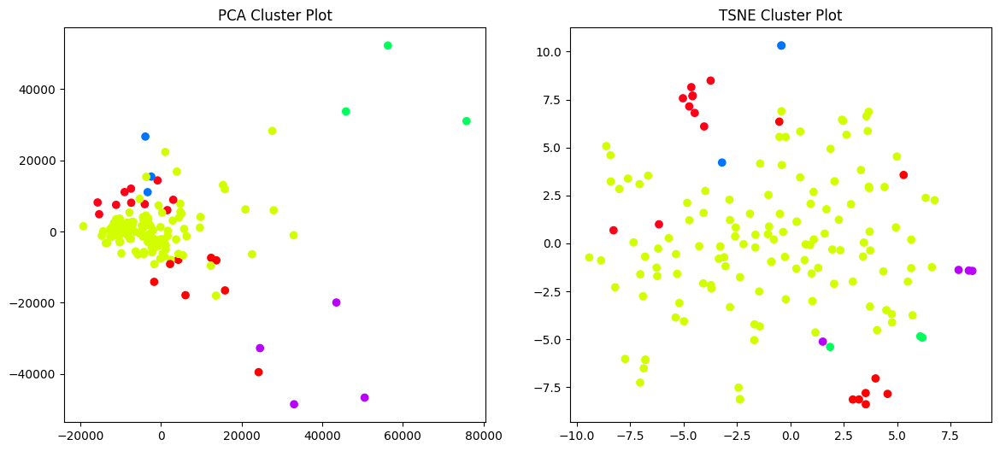

In [ ]:
plot_tsne_pca_2d(bert_array, clusters)

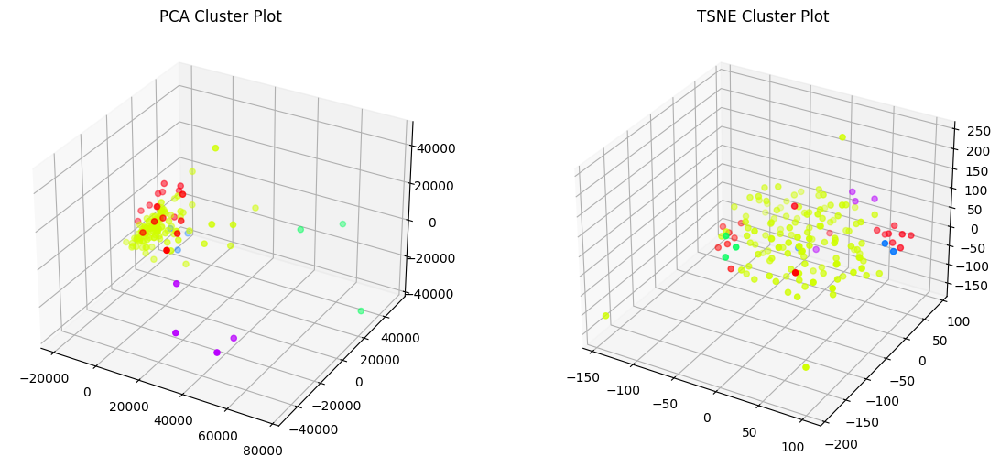

In [ ]:
plot_tsne_pca_3d(bert_array, clusters)

In [ ]:
silhouette_avg = silhouette_score(bert_array, clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.27760475540917623


### Bert On Title

In [ ]:
bert_array_title = []
for title in token_df['title']:
    tokens_title = tokenizer.encode_plus(
                                    title,
                                    max_length=250,
                                    truncation=True,
                                    add_special_tokens=True, # Add '[CLS]' and '[SEP]'
                                    return_token_type_ids=True,
                                    return_attention_mask=True,
                                    padding='max_length',
                                    return_tensors='pt',  # Return PyTorch tensors
                                    )

    bert_array_title.append(list(tokens_title['input_ids'].flatten()))

bert_array_title = np.array(bert_array_title)

In [ ]:
bert_array_title

array([[   2, 4335, 2777, ...,    0,    0,    0],
       [   2, 2712, 5586, ...,    0,    0,    0],
       [   2, 2712, 6870, ...,    0,    0,    0],
       ...,
       [   2, 5430, 9455, ...,    0,    0,    0],
       [   2, 3014, 2383, ...,    0,    0,    0],
       [   2, 4955, 4908, ...,    0,    0,    0]])

In [ ]:
bert_array_title.shape

(154, 250)

In [ ]:
pca2 = PCA(n_components=20).fit_transform(bert_array_title)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 2 clusters with sse 198330751969.9275
Fit 3 clusters with sse 183080614092.64154
Fit 4 clusters with sse 167870329536.71796
Fit 5 clusters with sse 154467457987.90903
Fit 6 clusters with sse 143653267326.77744


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 7 clusters with sse 131973223884.3529
Fit 8 clusters with sse 122886322783.42557


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 9 clusters with sse 115719007300.87799
Fit 10 clusters with sse 106121659632.12613


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 11 clusters with sse 98306077716.36522
Fit 12 clusters with sse 90227102266.53346


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 13 clusters with sse 85552386369.28937


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 14 clusters with sse 79327023939.1159
Fit 15 clusters with sse 76153864041.09622


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 16 clusters with sse 71995663509.50879


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 17 clusters with sse 69396963885.58015


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 18 clusters with sse 66926843233.81413


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 19 clusters with sse 62693454126.82661
Fit 20 clusters with sse 61434038324.97626


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 21 clusters with sse 58307340884.89585


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 22 clusters with sse 57018708537.79155


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 23 clusters with sse 53237254665.07654


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 24 clusters with sse 50509572690.40741


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 25 clusters with sse 49274114427.13094


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 26 clusters with sse 47134918381.37509


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 27 clusters with sse 46616132137.475815


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 28 clusters with sse 43458075089.54913


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 29 clusters with sse 42872104266.74622


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 30 clusters with sse 40460018314.5238


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 31 clusters with sse 38657505826.01126


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 32 clusters with sse 38124187997.60655


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 33 clusters with sse 37246915886.6066


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 34 clusters with sse 35990146178.78802


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 35 clusters with sse 34520715794.10007


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 36 clusters with sse 33138840134.974564


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 37 clusters with sse 32338715231.740913


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 38 clusters with sse 31310919105.349667


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 39 clusters with sse 31035002468.890545


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Fit 40 clusters with sse 29755500454.62584


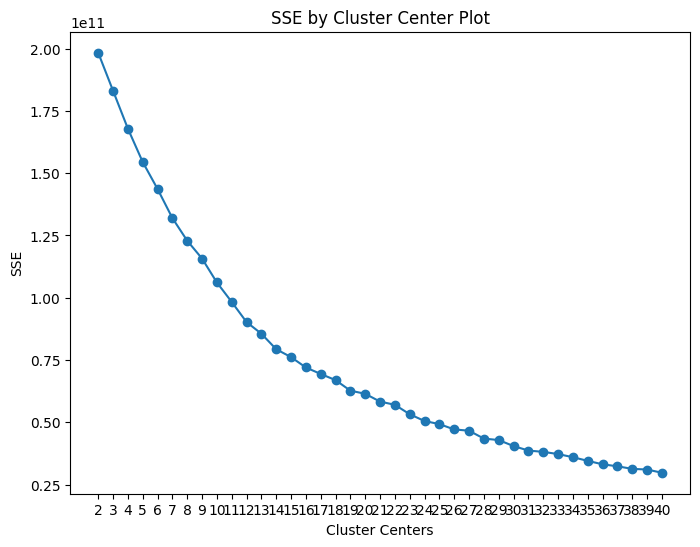

In [ ]:
find_optimal_clusters(bert_array_title,40)

In [ ]:
bert_title_clusters = KMeans(n_clusters=6, random_state=20).fit_predict(bert_array_title)
bert_title_clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 4, 0, 1, 1, 1, 1, 1, 1, 4, 1, 1, 2, 1, 4,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 4, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 4, 1, 4, 1, 4, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 4, 0, 1, 1, 1, 1, 1, 5, 1, 1, 3, 1,
       0, 1, 1, 0, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 4, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 0],
      dtype=int32)

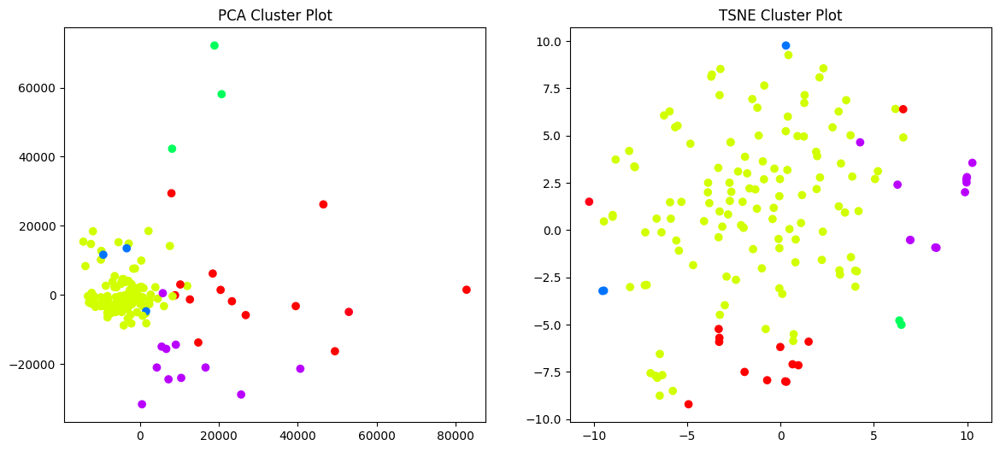

In [ ]:
plot_tsne_pca_2d(bert_array_title, bert_title_clusters)

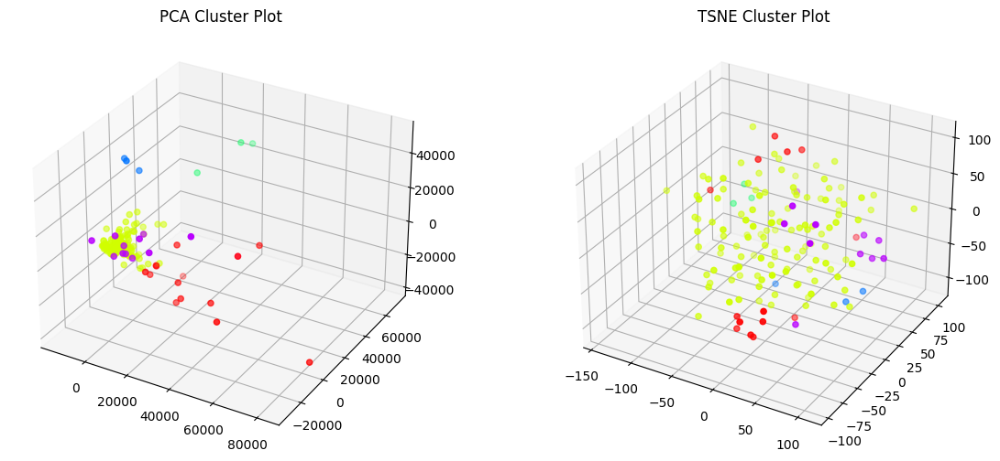

In [ ]:
plot_tsne_pca_3d(bert_array_title, bert_title_clusters)

In [ ]:
bert_title_clustered_dataset = pd.DataFrame({'title': token_df['title'], 'author': token_df['author'], 'cluster': bert_title_clusters, 'label': token_df['class_label']})
bert_title_clustered_dataset

,title,author,cluster,label
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,1,مدیریت آموزشی و هدایت تحصیلی
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,1,مدیریت آموزشی و هدایت تحصیلی
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,0,آموزش و سازماندهی دانشگاهی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,1,اشتغال و کارآفرینی
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,1,مدیریت منابع انسانی و علوم رفتاری
...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,1,مدیریت آموزشی و هدایت تحصیلی - ریاضی
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,1,مدیریت آموزشی و هدایت تحصیلی - ریاضی
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,1,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
bert_title_clustered_dataset[bert_title_clustered_dataset['cluster'] == 0]

,title,author,cluster,label
id,,,,
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,0,آموزش و سازماندهی دانشگاهی
13,مطالعه و ارائه الگوی مفهومی و کاربردی استارت آ...,فرنوش اعلامی,0,اشتغال و کارآفرینی
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,0,آموزش و سازماندهی دانشگاهی
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,0,مدیریت آموزشی و هدایت تحصیلی
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,0,مدیریت آموزشی و هدایت تحصیلی
52,ارزیابی معیارهای موثر بر شایسته یابی و شایسته ...,محمد قهرمانی,0,انتخاب افراد شایسته - سازماندهی آموزشی
70,تأمل در فعالیت های دانشگاهی در دانشگاه ها از د...,محمد یمنی دوزی سرخابی,0,آموزش و سازماندهی دانشگاهی - کلاس معکوس
103,رویکرد کلاس درس معکوس: نرم‌افزارهای نوظهور، کا...,اسماعیل جعفری,0,آموزش و سازماندهی دانشگاهی - کلاس معکوس
115,مقايسه تأثير روش‌های مختلف ارزشيابی توصيفی بر ...,محمدرضا سرمدي,0,مدیریت آموزشی و هدایت تحصیلی


In [ ]:
bert_title_clustered_dataset[bert_title_clustered_dataset['cluster'] == 1]

,title,author,cluster,label
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,1,مدیریت آموزشی و هدایت تحصیلی
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,1,مدیریت آموزشی و هدایت تحصیلی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,1,اشتغال و کارآفرینی
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,1,مدیریت منابع انسانی و علوم رفتاری
6,تجربه زندگی تیم های راه اندازی دانشگاه.,فرنوش اعلامی,1,اشتغال و کارآفرینی
...,...,...,...,...
155,تجربه زیسته یک متخصص برنامه درسی ریاضی در تلفی...,زهرا گویا,1,تاثیر بحران بر آموزش - ریاضی
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,1,مدیریت آموزشی و هدایت تحصیلی - ریاضی
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,1,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
bert_title_clustered_dataset[bert_title_clustered_dataset['cluster'] == 2]

,title,author,cluster,label
id,,,,
44,آسیب شناسی برنامه های آموزش مداوم پرستاران: یک...,محمد قهرمانی,2,مدیریت آموزشی و هدایت تحصیلی - پرستاری
61,بررسی رابطه‌ی میان ساختار سازمانی و کارآفرینی ...,محمد قهرمانی,2,اشتغال و کارآفرینی
79,مطالعه تطبیقی استعاره تربیتی سفر در عرفان اسلا...,رضا محمدی چابکی,2,اسلامی


In [ ]:
bert_title_clustered_dataset[bert_title_clustered_dataset['cluster'] == 3]

,title,author,cluster,label
id,,,,
100,شناسایی و رتبه بندی چالش های یادگیرندگان در آم...,مرتضی رضائی زاده,3,آموزش الکترونیکی
112,\nارتقای تفکر تابعی: شناسایی طرح واره‌های پیش ...,نسیم اصغری,3,مدیریت آموزشی و هدایت تحصیلی
152,چالش‌های یادگیری ریاضی دانشجویان در دانشگاه ال...,زهرا گویا,3,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
bert_title_clustered_dataset[bert_title_clustered_dataset['cluster'] == 4]

,title,author,cluster,label
id,,,,
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,4,آموزش و سازماندهی دانشگاهی
41,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,محمد قهرمانی,4,آموزش الکترونیکی
46,طراحی و اعتباریابی الگوی آسیب شناسی فرایند سیا...,محمد قهرمانی,4,سیاست - سازماندهی آموزشی
66,رضایت دانشجویان از فرآیند انجام پایان نامه و ع...,محمد یمنی دوزی سرخابی,4,آموزش و سازماندهی دانشگاهی
83,تغییر نقش معلم مبتنی بر نظریه پیچیدگی: از بازن...,رضا محمدی چابکی,4,بازنمایی
85,فهم مسأله محور قرآن مبتنی بر رویکرد سازه‌گرایی...,رضا محمدی چابکی,4,اسلامی - فهم مسئله محور قرآن
87,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,مرتضی رضائی زاده,4,آموزش الکترونیکی
102,شناسایی و مدلسازی ویژگی‌های شخصیتی تسهیل‌کنندة...,مرتضی رضائی زاده,4,اشتغال و کارآفرینی
121,بررسی چارچوب‌های درک شاگردان از رابطه بین نمود...,ابراهیم ریحانی,4,مدیریت آموزشی و هدایت تحصیلی


In [ ]:
bert_title_clustered_dataset[bert_title_clustered_dataset['cluster'] == 5]

,title,author,cluster,label
id,,,,
109,بررسي تأثير تدريس معادلات ديفرانسيل بر اساس رو...,نسیم اصغری,5,آموزش و سازماندهی دانشگاهی - معادلات دیفرانسیل


In [ ]:
silhouette_avg = silhouette_score(bert_array_title, title_clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : -0.13467277191546959


## Clustering Using AgglomerativeClustering

#### using vectors_w2v



In [ ]:
clustering = AgglomerativeClustering(distance_threshold=0, n_clusters=None).fit(titles_vectors_w2v)

In [ ]:
from scipy.cluster.hierarchy import dendrogram
def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    fig = plt.figure(figsize=(24, 12))
    dendrogram(linkage_matrix, **kwargs)

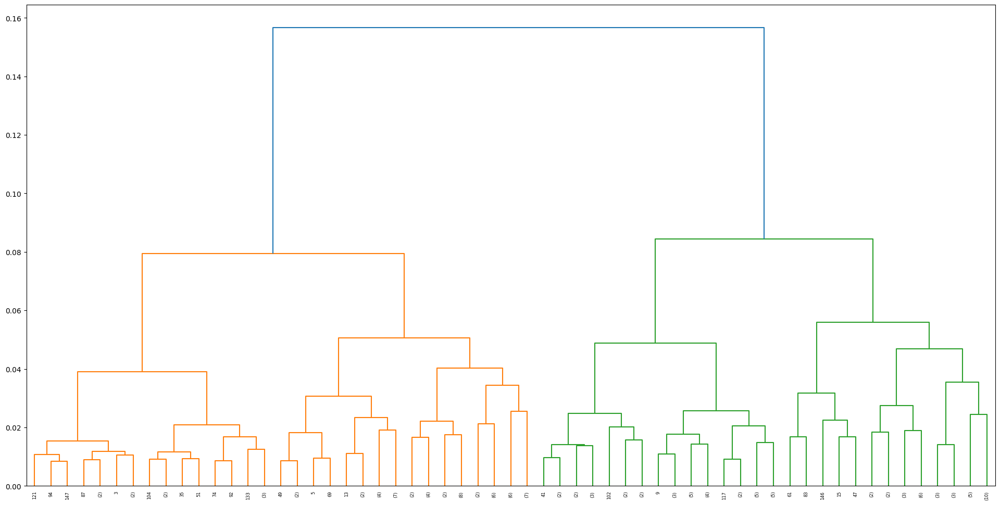

In [ ]:
plot_dendrogram(clustering, truncate_mode="level", p=5)

In [ ]:
clustering = AgglomerativeClustering(n_clusters=6).fit(vectors_w2v)

clusters = clustering.labels_

clusters

array([2, 3, 3, 5, 2, 2, 1, 5, 2, 0, 2, 2, 3, 1, 5, 1, 1, 1, 5, 1, 2, 1,
       2, 2, 3, 0, 2, 0, 2, 1, 1, 0, 0, 0, 3, 2, 1, 2, 2, 2, 2, 3, 2, 2,
       1, 2, 3, 1, 3, 0, 0, 3, 1, 2, 3, 0, 3, 0, 2, 3, 0, 0, 0, 0, 2, 3,
       3, 1, 3, 0, 2, 1, 2, 2, 3, 2, 0, 0, 0, 1, 2, 3, 2, 0, 2, 2, 3, 2,
       3, 2, 2, 5, 3, 0, 4, 2, 4, 2, 2, 3, 3, 1, 3, 3, 2, 3, 0, 2, 3, 4,
       1, 3, 3, 0, 0, 0, 3, 3, 5, 1, 1, 2, 3, 3, 0, 2, 1, 1, 3, 3, 4, 5,
       4, 3, 4, 4, 2, 0, 5, 5, 1, 0, 4, 4, 2, 2, 2, 5, 2, 0, 2, 0, 3, 0])

In [ ]:
silhouette_avg = silhouette_score(vectors_w2v, clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.08542229


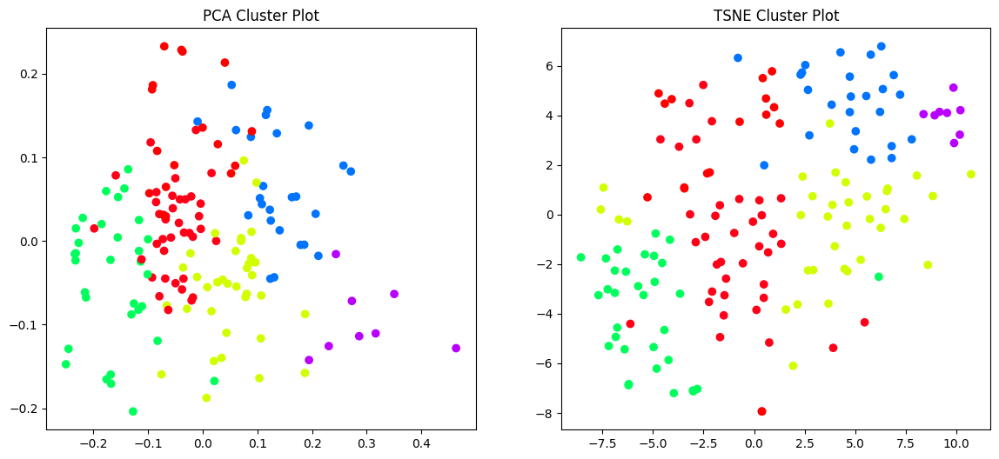

In [ ]:
plot_tsne_pca_2d(vectors_w2v, clusters)

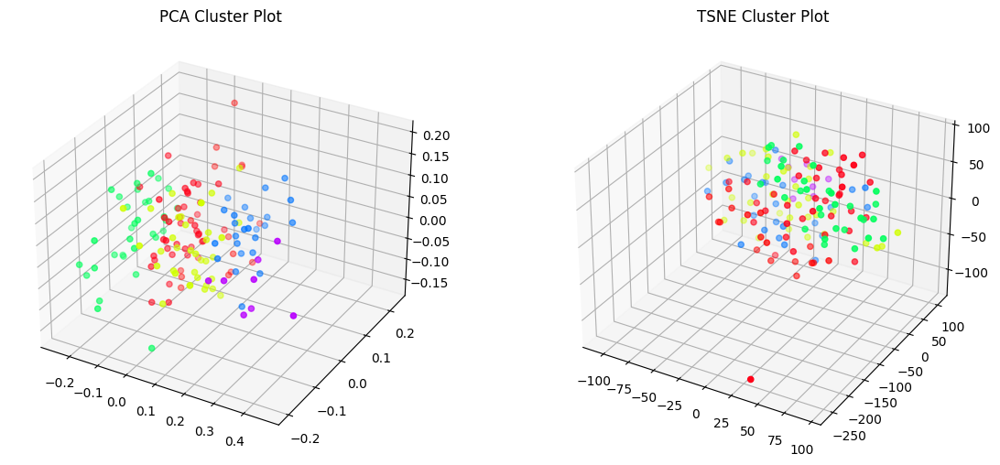

In [ ]:
plot_tsne_pca_3d(vectors_w2v, clusters)

#### using keywords w2v


In [ ]:
clustering = AgglomerativeClustering(n_clusters=8).fit(keywords_w2v)

clusters = clustering.labels_

clusters

array([5, 2, 2, 7, 5, 2, 2, 7, 3, 2, 3, 2, 7, 0, 2, 0, 5, 5, 2, 0, 2, 2,
       5, 2, 2, 0, 5, 2, 2, 0, 3, 0, 3, 7, 1, 7, 3, 0, 4, 7, 7, 1, 3, 1,
       0, 2, 2, 6, 1, 3, 5, 7, 5, 0, 0, 3, 1, 0, 2, 1, 2, 0, 3, 2, 5, 1,
       6, 2, 1, 5, 0, 6, 3, 0, 1, 2, 0, 0, 4, 3, 5, 5, 2, 0, 4, 2, 2, 7,
       2, 2, 2, 3, 7, 3, 1, 5, 1, 3, 3, 7, 5, 2, 1, 2, 5, 3, 3, 4, 4, 1,
       0, 0, 2, 3, 3, 1, 2, 1, 2, 7, 2, 3, 5, 7, 5, 3, 3, 0, 2, 0, 1, 2,
       2, 1, 0, 3, 3, 5, 3, 2, 3, 0, 5, 0, 5, 5, 7, 7, 3, 5, 3, 0, 0, 3])

In [ ]:
silhouette_avg = silhouette_score(keywords_w2v, clusters)

print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.1721807


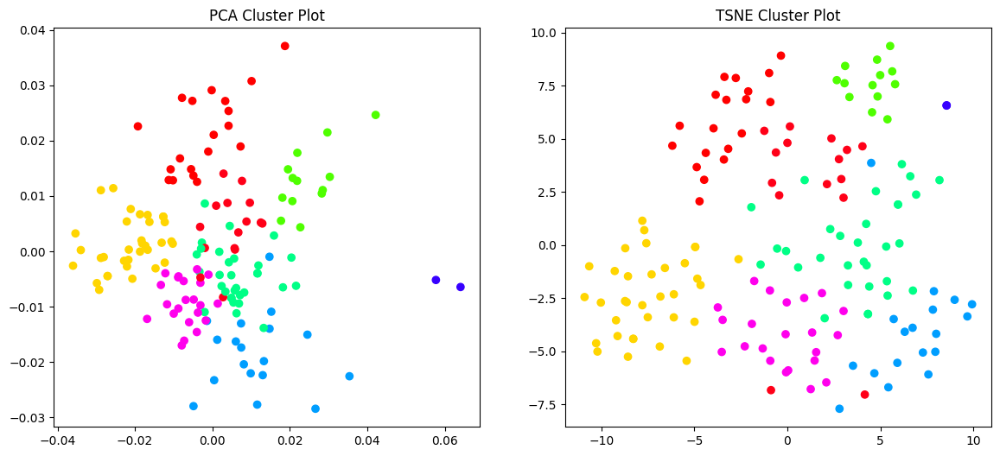

In [ ]:
plot_tsne_pca_2d(keywords_w2v, clusters)

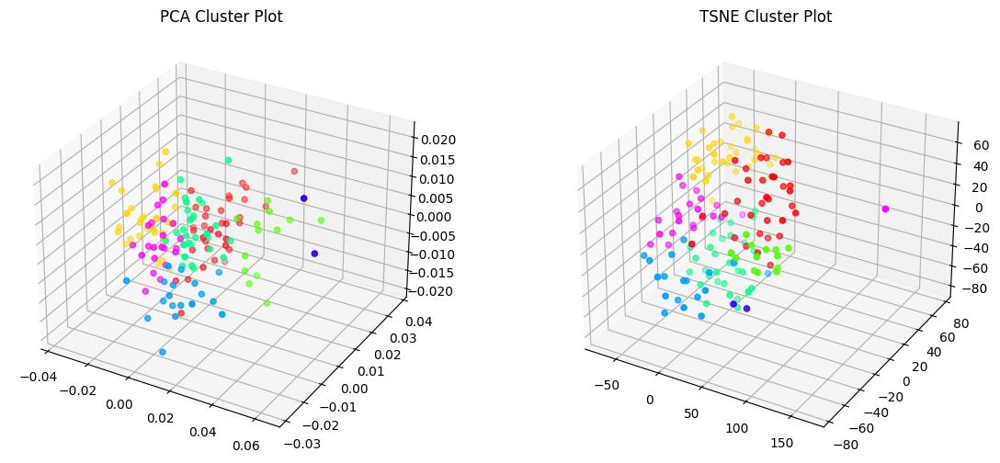

In [ ]:
plot_tsne_pca_3d(keywords_w2v, clusters)

In [ ]:
# show_clustering_result(token_df['title'], clusters)

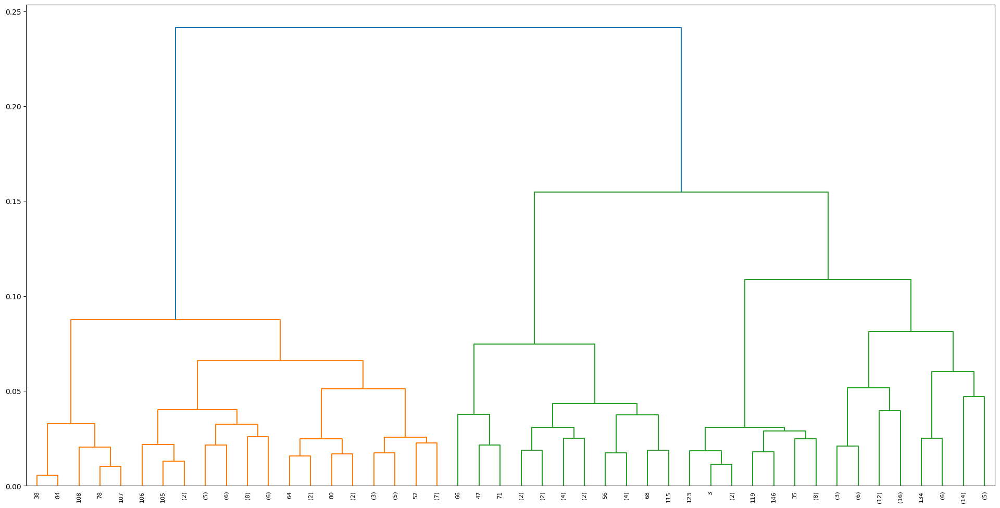

In [ ]:
c = AgglomerativeClustering(distance_threshold=0, n_clusters=None).fit(keywords_w2v)
plot_dendrogram(c, truncate_mode="level", p=5)

In [ ]:
clustering = AgglomerativeClustering(n_clusters=7).fit(keywords_w2v)
clusters = clustering.labels_
clusters

array([0, 5, 5, 3, 0, 5, 5, 3, 0, 5, 0, 5, 3, 2, 5, 2, 0, 0, 5, 2, 5, 5,
       0, 5, 5, 2, 0, 5, 5, 2, 0, 2, 0, 3, 1, 3, 0, 2, 4, 3, 3, 1, 0, 1,
       2, 5, 5, 6, 1, 0, 0, 3, 0, 2, 2, 0, 1, 2, 5, 1, 5, 2, 0, 5, 0, 1,
       6, 5, 1, 0, 2, 6, 0, 2, 1, 5, 2, 2, 4, 0, 0, 0, 5, 2, 4, 5, 5, 3,
       5, 5, 5, 0, 3, 0, 1, 0, 1, 0, 0, 3, 0, 5, 1, 5, 0, 0, 0, 4, 4, 1,
       2, 2, 5, 0, 0, 1, 5, 1, 5, 3, 5, 0, 0, 3, 0, 0, 0, 2, 5, 2, 1, 5,
       5, 1, 2, 0, 0, 0, 0, 5, 0, 2, 0, 2, 0, 0, 3, 3, 0, 0, 0, 2, 2, 0])

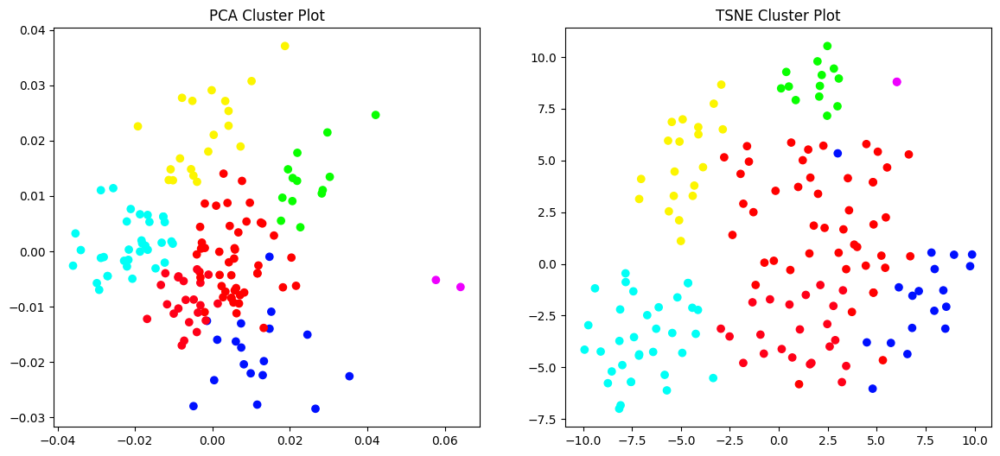

In [ ]:
plot_tsne_pca_2d(keywords_w2v, clusters)

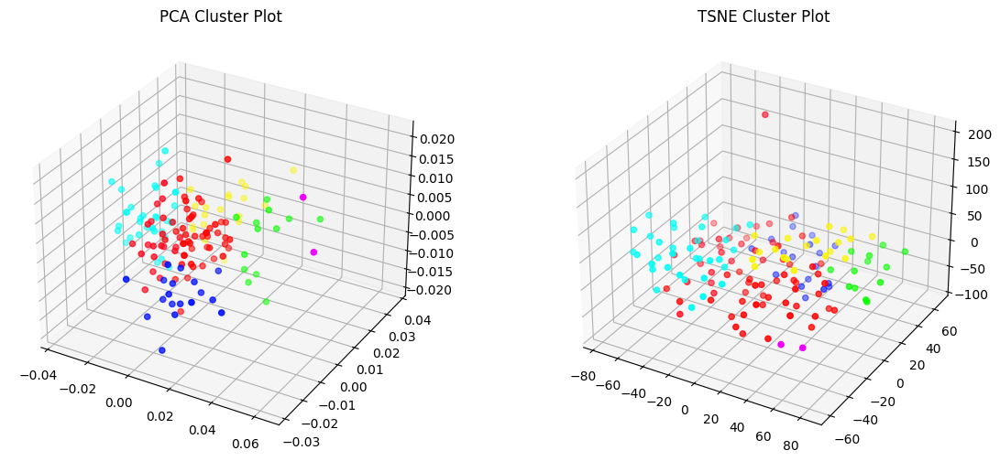

In [ ]:
plot_tsne_pca_3d(keywords_w2v, clusters)

# bia injaaaaaaaaaaaaaaaaaaaaaaa:

In [ ]:
keywords_w2v_df = pd.DataFrame({'title': token_df['title'], 'author': token_df['author'], 'label': token_df['class_label'], 'cluster': clusters})

In [ ]:
keywords_w2v_df

,title,author,label,cluster
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,مدیریت آموزشی و هدایت تحصیلی,0
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,مدیریت آموزشی و هدایت تحصیلی,5
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,آموزش و سازماندهی دانشگاهی,5
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,اشتغال و کارآفرینی,3
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,مدیریت منابع انسانی و علوم رفتاری,0
...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,0
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,0
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,2


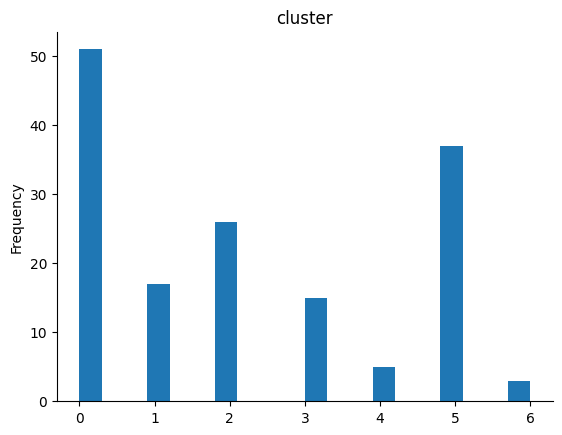

In [ ]:
from matplotlib import pyplot as plt
keywords_w2v_df['cluster'].plot(kind='hist', bins=20, title='cluster')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['cluster'] == 0]))
keywords_w2v_df[keywords_w2v_df['cluster'] == 0]

51


,title,author,label,cluster
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,مدیریت آموزشی و هدایت تحصیلی,0
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,مدیریت منابع انسانی و علوم رفتاری,0
9,بررسی نقش برنامه‌های درسی رشته‌های علوم اجتماع...,فرنوش اعلامی,اشتغال و کارآفرینی,0
11,بررسی نقش تداوم یادگیری الکترونیکی بر توسعه حر...,فرنوش اعلامی,آموزش الکترونیکی,0
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,انتخاب افراد شایسته,0
18,طراحی و اعتباربخشی الگوی مطلوب برنامه درسی رشت...,غلامرضا شمس,اشتغال و کارآفرینی,0
23,بررسی نقش و اهمیت مدیران ارشد دانش در توسعه مد...,محمود ابوالقاسمی,آموزش و سازماندهی دانشگاهی,0
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,0
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,0


In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['cluster'] == 1]))
keywords_w2v_df[keywords_w2v_df['cluster'] == 1]

17


,title,author,label,cluster
id,,,,
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی - کلاس معکوس,1
44,آسیب شناسی برنامه های آموزش مداوم پرستاران: یک...,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی - پرستاری,1
46,طراحی و اعتباریابی الگوی آسیب شناسی فرایند سیا...,محمد قهرمانی,سیاست - سازماندهی آموزشی,1
51,آسیب شناسی فرایند سیاست پژوهی در نظام آموزش عا...,محمد قهرمانی,سیاست - سازماندهی آموزشی,1
59,چالش‌های برون‌سپاری آموزش به مؤسسات ارائه دهند...,محمد قهرمانی,آموزش و سازماندهی دانشگاهی,1
62,به‌سازی نظام تصمیم گیری در آموزش و پرورش از دی...,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی,1
68,استراتژی های توسعه دانشکده بر اساس برنامه های ...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,1
71,آموزش دانشگاه: یک پدیده غفلت شده در سیستم آموز...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,1
77,آموزه‌های نظریه آشوب در نظام آموزش و برنامه در...,رضا محمدی چابکی,مدیریت آموزشی و هدایت تحصیلی,1


In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['cluster'] == 2]))
keywords_w2v_df[keywords_w2v_df['cluster'] == 2]

26


,title,author,label,cluster
id,,,,
14,ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...,غلامرضا شمس,انتخاب افراد شایسته,2
16,شناسایی چالش‌ها و فرصت‌های توسعه سازمانی از طر...,غلامرضا شمس,توسعه سازمانی و استفاده از فناوری,2
20,طراحی الگوهای مناسب جهت هدایت تحصیلی دانش آموز...,محمود ابوالقاسمی,مدیریت آموزشی و هدایت تحصیلی,2
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,انقلاب,2
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,2
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,2
39,شناسایی الگوی مطلوب نظارت بر پایان‌نامه‌ها مطا...,محمد قهرمانی,آموزش و سازماندهی دانشگاهی,2
47,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مدیران ...,محمد قهرمانی,انتخاب افراد شایسته,2
56,تحلیل ساختاری اثر سبک رهبری توزیعی بر پیشرفت ت...,محمد قهرمانی,انتخاب افراد شایسته,2


In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['cluster'] == 3]))
keywords_w2v_df[keywords_w2v_df['cluster'] == 3]

15


,title,author,label,cluster
id,,,,
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,اشتغال و کارآفرینی,3
8,تأثیر آموزش کارآفرینی مبتنی بر فناوری بر توانم...,فرنوش اعلامی,اشتغال و کارآفرینی,3
13,مطالعه و ارائه الگوی مفهومی و کاربردی استارت آ...,فرنوش اعلامی,اشتغال و کارآفرینی,3
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,3
37,کلاس معکوس در آموزش عالی ایران: با تاکید بر مز...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی - کلاس معکوس,3
42,شناسایی شاخص های اثرگذار در طراحی سامانه موبای...,محمد قهرمانی,آموزش الکترونیکی,3
43,تعیین کنندگان اثربخشی یادگیری الکترونیکی: مطال...,محمد قهرمانی,آموزش الکترونیکی,3
54,بررسی نظام آموزش و توسعه کارکنان در سازمان های...,محمد قهرمانی,اشتغال و کارآفرینی,3
90,بررسی روش های ایجاد تعامل و بهبود مشارکت دانشج...,مرتضی رضائی زاده,آموزش و سازماندهی دانشگاهی,3


In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['cluster'] == 4]))
keywords_w2v_df[keywords_w2v_df['cluster'] == 4]

5


,title,author,label,cluster
id,,,,
41,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,محمد قهرمانی,آموزش الکترونیکی,4
81,از رنج تا گنج: تحلیل رویکردهای سه گانه به نقش ...,رضا محمدی چابکی,سختی و رنج,4
87,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,مرتضی رضائی زاده,آموزش الکترونیکی,4
111,ارائه الگویی برای ارتقای توانمندی معلمان دوره ...,نسیم اصغری,مدیریت آموزشی و هدایت تحصیلی,4
112,\nارتقای تفکر تابعی: شناسایی طرح واره‌های پیش ...,نسیم اصغری,مدیریت آموزشی و هدایت تحصیلی,4


In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['cluster'] == 5]))
keywords_w2v_df[keywords_w2v_df['cluster'] == 5]

37


,title,author,label,cluster
id,,,,
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,مدیریت آموزشی و هدایت تحصیلی,5
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,آموزش و سازماندهی دانشگاهی,5
6,تجربه زندگی تیم های راه اندازی دانشگاه.,فرنوش اعلامی,اشتغال و کارآفرینی,5
7,شناسایی ابعاد و مولفه‌های کلیدی اشتغال‌پذیری د...,فرنوش اعلامی,اشتغال و کارآفرینی,5
10,تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...,فرنوش اعلامی,آموزش و سازماندهی دانشگاهی,5
12,بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...,فرنوش اعلامی,آموزش و سازماندهی دانشگاهی,5
15,دوره‌های الکترونیکی اثربخش سازمانی: توجه مضاع...,غلامرضا شمس,آموزش الکترونیکی,5
19,شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...,غلامرضا شمس,آموزش الکترونیکی,5
21,بررسی رابطه میان ساختار سازمانی و کارآفرینی سا...,محمود ابوالقاسمی,ساختار سازمانی - اشتغال و کارآفرینی,5


In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['cluster'] == 6]))
keywords_w2v_df[keywords_w2v_df['cluster'] == 6]

3


,title,author,label,cluster
id,,,,
50,ارزشیابی خروجی‌ها، اثرات و پیامدهای پژوهش های ...,محمد قهرمانی,مدیریت - انتخاب افراد شایسته,6
69,نتایج توسعه دانشکده بر اساس برنامه تکامل و نوآ...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,6
74,آسیب شناسی عملکردی پردیس های خودمختار دانشگاه ...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,6


In [ ]:
print(len(keywords_w2v_df[keywords_w2v_df['author'] == "جمیله علم الهدی"]))
keywords_w2v_df[keywords_w2v_df['author'] == "جمیله علم الهدی"]

12


,title,author,label,cluster
id,,,,
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,انقلاب,4
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,3
28,مناسبات تربیتی خانواده و دولت,جمیله علم الهدی,خانواده و دولت - رویکرد اسلامی,4
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,4
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,4
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,6
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,4
33,چرخش از عالم دو قطبی به جهان سه درجه‌ای,جمیله علم الهدی,تربیت - رویکرد اسلامی,6
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,0


## Project Phase **2**

### Task 1

In [ ]:
def count_articles_per_author_label_by_cluster_version_two(dataframe, clusters):

    result = {}

    for cluster_number in clusters:
        cluster_data = dataframe[dataframe['cluster'] == cluster_number]

        for author, group in cluster_data.groupby('author'):
            if author not in result:
                result[author] = {}
            if f'Cluster {cluster_number}' not in result[author]:
                result[author][f'Cluster {cluster_number}'] = 0
            result[author][f'Cluster {cluster_number}'] += len(group)
    return result

In [ ]:
tfidf_clustered_dataset[tfidf_clustered_dataset['cluster'] == 4]
tfidf_array

array([[0.        , 0.13387252, 0.08993126, ..., 0.08531089, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.09581174, 0.24224156, 0.10848673, ..., 0.        , 0.08301672,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.25496766, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
tfidf_clustered_dataset

,title,author,cluster,label
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,2,مدیریت آموزشی و هدایت تحصیلی
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,2,مدیریت آموزشی و هدایت تحصیلی
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,3,آموزش و سازماندهی دانشگاهی
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,3,اشتغال و کارآفرینی
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,3,مدیریت منابع انسانی و علوم رفتاری
...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,4,مدیریت آموزشی و هدایت تحصیلی - ریاضی


In [ ]:
tfidf_clustered_dataset['cluster']

In [ ]:
z_clusters = [0, 1, 2, 3, 4]
result = count_articles_per_author_label_by_cluster_version_two(tfidf_clustered_dataset, z_clusters)

In [ ]:
import json

res = json.dumps(result, indent=4, ensure_ascii=False)

print(res)

{
    "جمیله علم الهدی": {
        "Cluster 0": 5,
        "Cluster 1": 4,
        "Cluster 2": 1,
        "Cluster 4": 2
    },
    "رضا محمدی چابکی": {
        "Cluster 0": 8,
        "Cluster 1": 1,
        "Cluster 2": 1
    },
    "محمد قهرمانی": {
        "Cluster 0": 1,
        "Cluster 1": 10,
        "Cluster 2": 8,
        "Cluster 3": 4
    },
    "مرتضی رضائی زاده": {
        "Cluster 0": 1,
        "Cluster 1": 6,
        "Cluster 2": 1,
        "Cluster 3": 6,
        "Cluster 4": 1
    },
    "اباصلت خراسانی": {
        "Cluster 1": 2,
        "Cluster 2": 2,
        "Cluster 3": 1
    },
    "ابراهیم ریحانی": {
        "Cluster 1": 1,
        "Cluster 2": 1,
        "Cluster 4": 2
    },
    "اسماعیل جعفری": {
        "Cluster 1": 2,
        "Cluster 3": 2
    },
    "علی دلاور": {
        "Cluster 1": 1,
        "Cluster 2": 11
    },
    "علیرضا کیامنش": {
        "Cluster 1": 1,
        "Cluster 2": 2,
        "Cluster 3": 1,
        "Cluster 4": 3
    },
    "غلامرض

In [ ]:
authors = list(result.keys())
authors

['جمیله علم الهدی',
 'رضا محمدی چابکی',
 'محمد قهرمانی',
 'مرتضی رضائی زاده',
 'اباصلت خراسانی',
 'ابراهیم ریحانی',
 'اسماعیل جعفری',
 'علی دلاور',
 'علیرضا کیامنش',
 'غلامرضا شمس',
 'فرنوش اعلامی',
 'محمد یمنی دوزی سرخابی',
 'محمود ابوالقاسمی',
 'نسیم اصغری',
 'کوروش فتحی',
 ' محمدرضا سرمدي',
 'محبوبه عارفی',
 'زهرا گویا',
 'محمد رضا فدایی']

### Plot Task 1

<ipython-input-110-c500d4180da6>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(authors))
<ipython-input-110-c500d4180da6>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(cluster_data.keys(), rotation=45, ha='right')


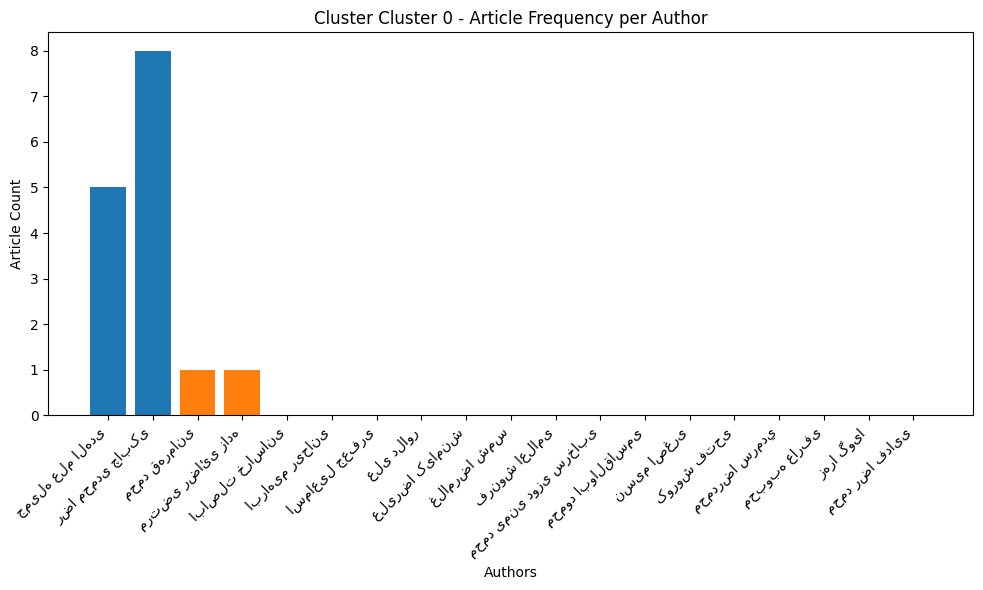

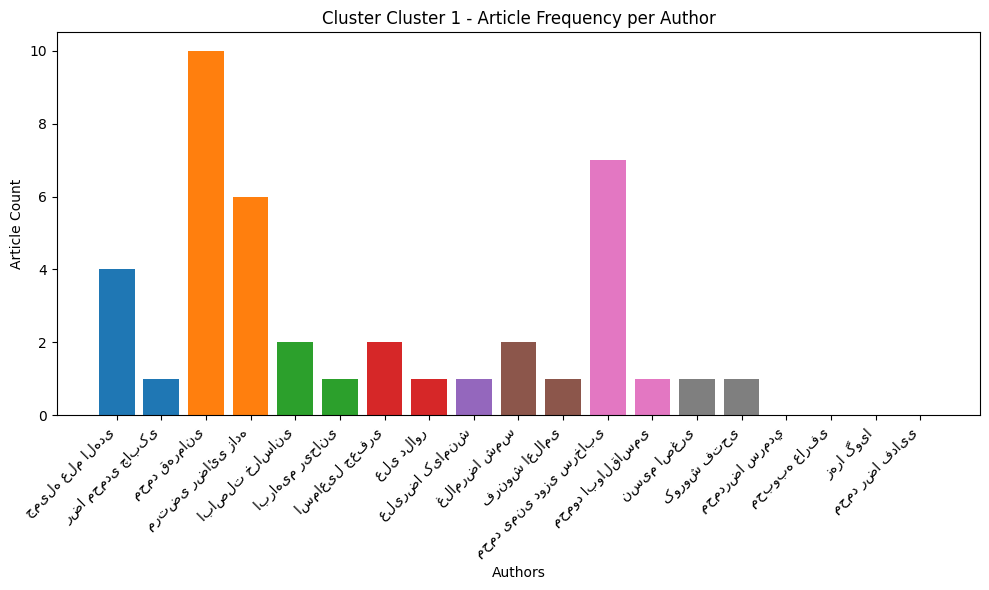

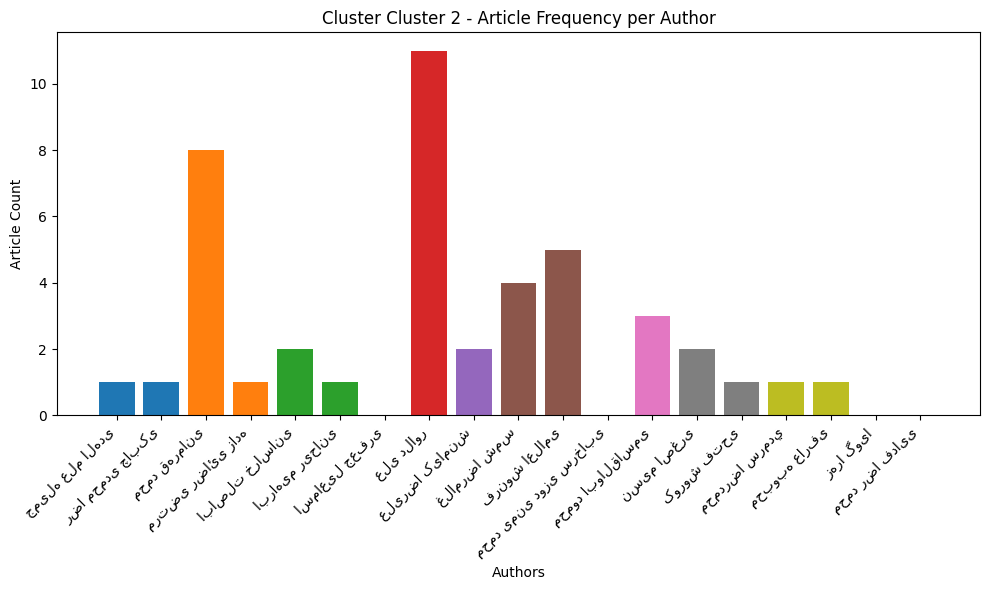

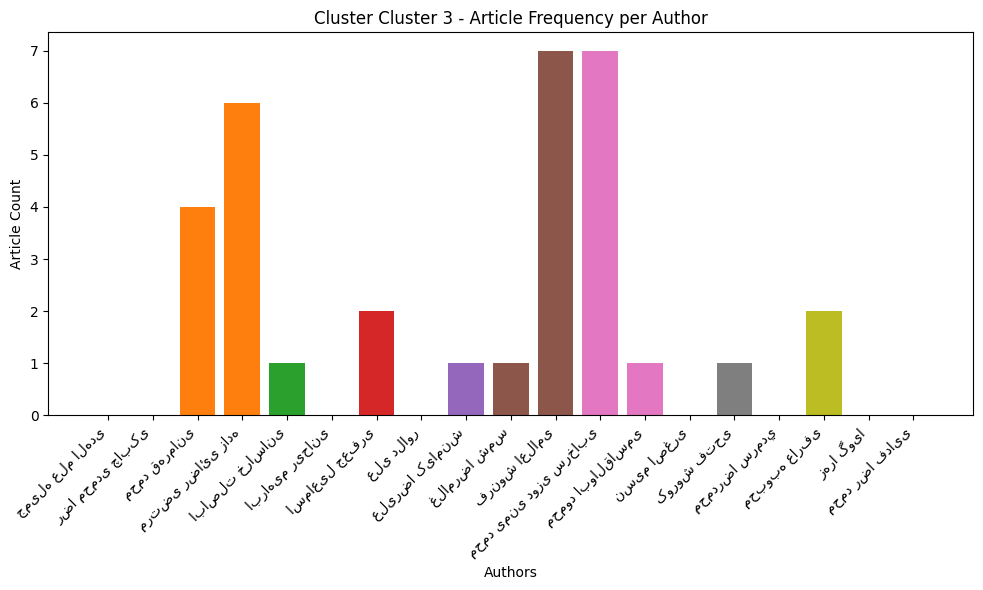

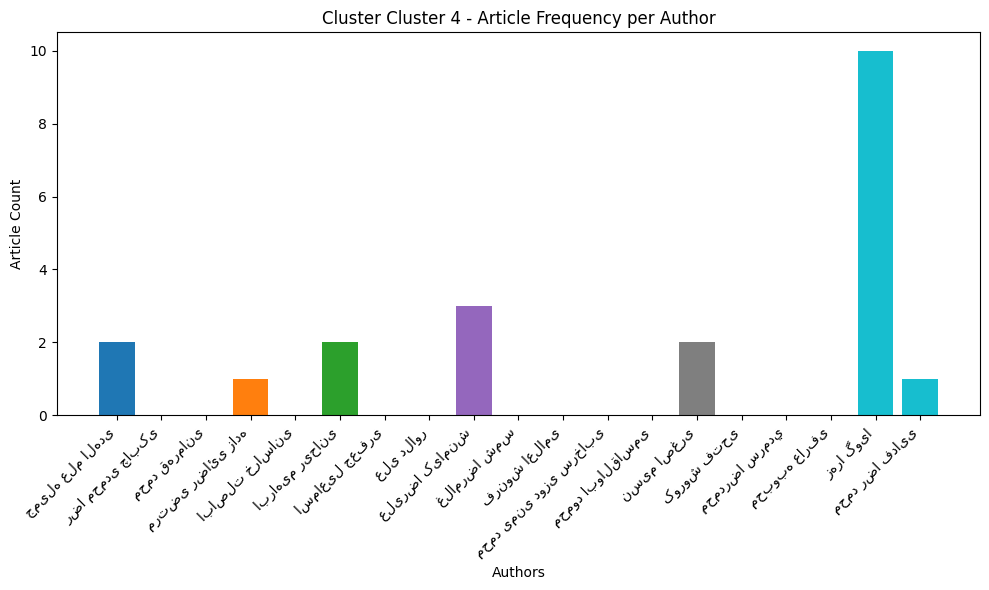

In [ ]:
clusters_z = sorted({cluster for author_data in result.values() for cluster in author_data.keys()})

colors = plt.cm.get_cmap('tab10', len(authors))

for cluster in clusters_z:
    fig, ax = plt.subplots(figsize=(10, 6))

    cluster_data = {author: result[author].get(cluster, 0) for author in authors}

    bars = ax.bar(cluster_data.keys(), cluster_data.values(), color=[colors(i) for i in range(len(authors))])

    ax.set_xlabel('Authors')
    ax.set_ylabel('Article Count')
    ax.set_title(f'Cluster {cluster} - Article Frequency per Author')

    ax.set_xticklabels(cluster_data.keys(), rotation=45, ha='right')


    plt.tight_layout()
    plt.show()

### Task 2

### avg

In [ ]:
vocab_tfidf_dataframe = pd.DataFrame({'title': token_df['title'], 'author': token_df['author'], 'citation': token_df['citation'], 'download': token_df['download'],
                                       'published_year': token_df['published_year'], 'label': token_df['class_label'], 'cluster': clusters_tfidf})

In [ ]:
vocab_tfidf_dataframe

,title,author,citation,download,published_year,label,cluster
id,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,5.0,423.0,1401.0,مدیریت آموزشی و هدایت تحصیلی,2
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,0.0,269.0,1399.0,مدیریت آموزشی و هدایت تحصیلی,2
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,0.0,467.0,1401.0,آموزش و سازماندهی دانشگاهی,3
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,0.0,71.0,1401.0,اشتغال و کارآفرینی,3
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,825.0,339.0,1398.0,مدیریت منابع انسانی و علوم رفتاری,3
...,...,...,...,...,...,...,...
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,0.0,896.0,1400.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,4
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,0.0,355.0,1399.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,4
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,0.0,695.0,1399.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,4


In [ ]:
def calculate_cluster_averages(dataframe, clusters):
    cluster_averages = {}

    for cluster_number in clusters:
        cluster_data = dataframe[dataframe['cluster'] == cluster_number]

        avg_downloads = cluster_data['download'].mean()
        avg_citations = cluster_data['citation'].mean()
        avg_year = cluster_data['published_year'].mean()

        cluster_averages[f'Cluster {cluster_number}'] = {
            'avg_downloads': round(avg_downloads, 2),
            'avg_citations': round(avg_citations, 2),
            'avg_year': int(avg_year)
        }

    return cluster_averages

In [ ]:
our_clusters = [0, 1, 2, 3, 4]
cluster_averages = calculate_cluster_averages(vocab_tfidf_dataframe, our_clusters)
cluster_averages

{'Cluster 0': {'avg_downloads': 825.4, 'avg_citations': 0.4, 'avg_year': 1393},
 'Cluster 1': {'avg_downloads': 473.66,
  'avg_citations': 34.68,
  'avg_year': 1397},
 'Cluster 2': {'avg_downloads': 656.19,
  'avg_citations': 0.24,
  'avg_year': 1397},
 'Cluster 3': {'avg_downloads': 886.94,
  'avg_citations': 52.18,
  'avg_year': 1396},
 'Cluster 4': {'avg_downloads': 515.05,
  'avg_citations': 0.0,
  'avg_year': 1397}}

In [ ]:
def plot_cluster_comparisons(cluster_averages):
    clusters = list(cluster_averages.keys())
    avg_downloads = [cluster_averages[cluster]['avg_downloads'] for cluster in clusters]
    avg_citations = [cluster_averages[cluster]['avg_citations'] for cluster in clusters]

    fig, ax = plt.subplots(2, 1, figsize=(15, 15))

    ax[0].bar(clusters, avg_downloads, color='skyblue')
    ax[0].set_title('Average Downloads per Cluster')
    ax[0].set_ylabel('Average Downloads')
    ax[0].set_xticklabels(clusters, rotation=45, ha='right')

    ax[1].bar(clusters, avg_citations, color='lightgreen')
    ax[1].set_title('Average Citations per Cluster')
    ax[1].set_ylabel('Average Citations')
    ax[1].set_xticklabels(clusters, rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

<ipython-input-115-e8b96ff968a5>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(clusters, rotation=45, ha='right')
<ipython-input-115-e8b96ff968a5>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_xticklabels(clusters, rotation=45, ha='right')


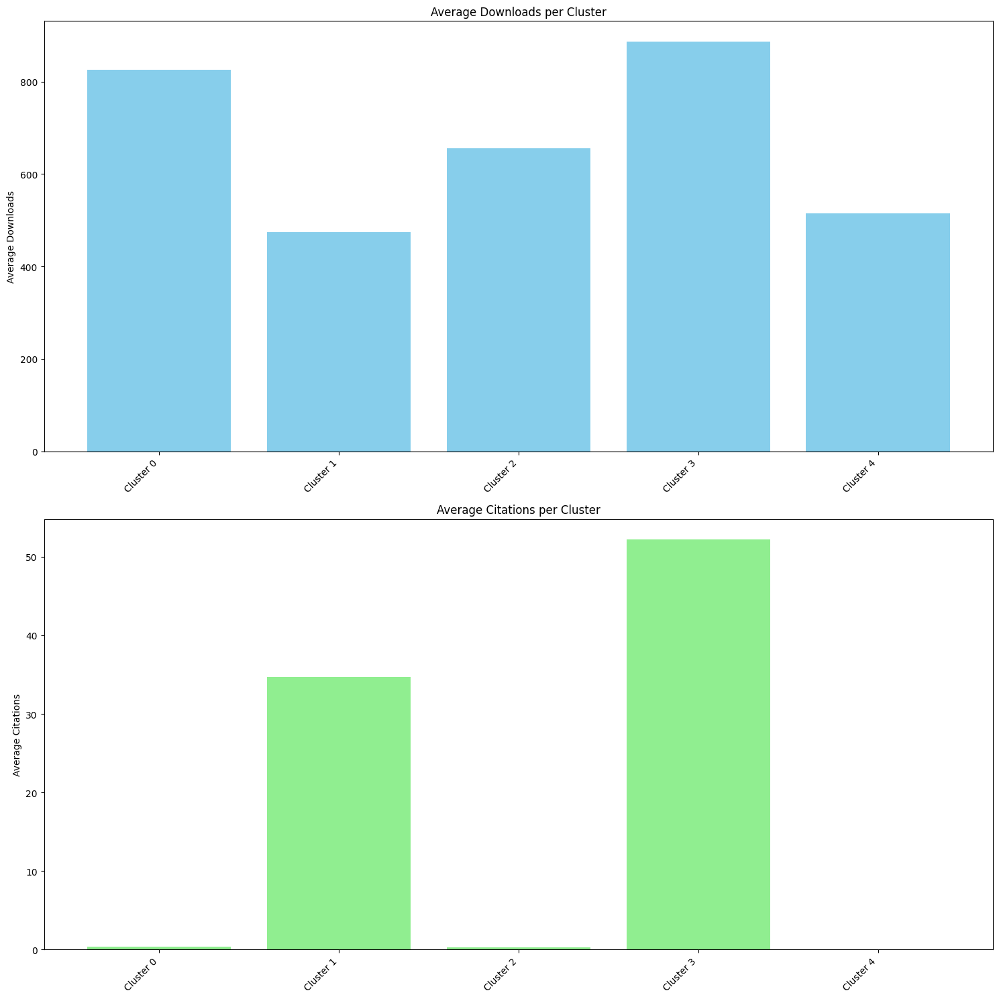

In [ ]:
clusters_z = [0, 1, 2, 3, 4]
cluster_averages = calculate_cluster_averages(vocab_tfidf_dataframe, clusters_z)
plot_cluster_comparisons(cluster_averages)

### Task 3

In [ ]:
year_counts = token_df['published_year'].value_counts()
year_counts

published_year
1401.0    27
1399.0    17
1400.0    16
1398.0    15
1402.0    14
1396.0    14
1397.0    12
1395.0     8
1394.0     7
1393.0     5
1392.0     5
1388.0     4
1390.0     2
1384.0     2
1387.0     2
1391.0     1
1386.0     1
1385.0     1
1381.0     1
Name: count, dtype: int64

In [ ]:
def plot_article_frequency(dataframe, color):

    year_counts = dataframe['published_year'].value_counts().sort_index()

    plt.figure(figsize=(12, 6))
    bars = plt.bar(year_counts.index, year_counts.values, color=color)

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.2, int(yval), ha='center', va='bottom')

    plt.xlabel('Published Year')
    plt.ylabel('Number of Articles')
    plt.title('The Frequency of the Number of Articles According to the Year of Publication')
    plt.xticks(year_counts.index, rotation=45)
    plt.yticks(range(0, max(year_counts.values)+1))

    plt.tight_layout()
    plt.show()

#### plot for all dataset

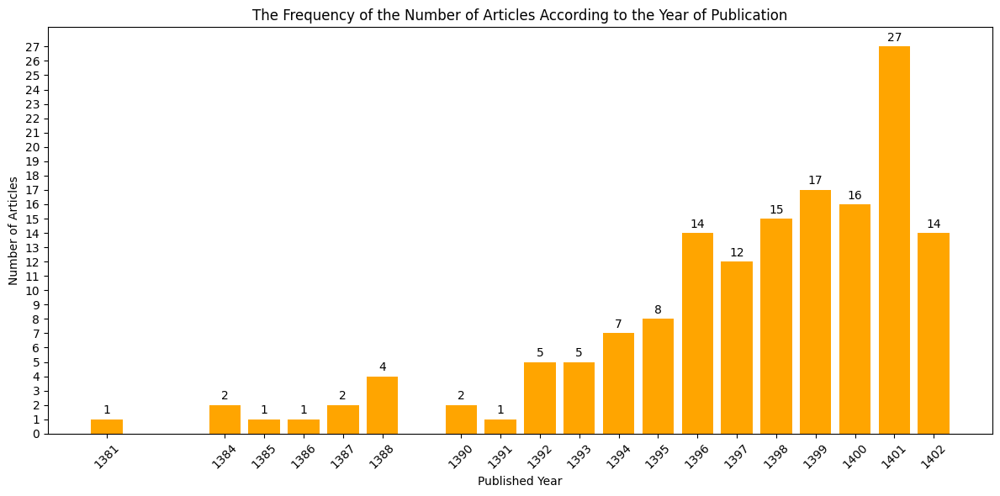

In [ ]:
plot_article_frequency(token_df, 'orange')

#### plot for cluster 4

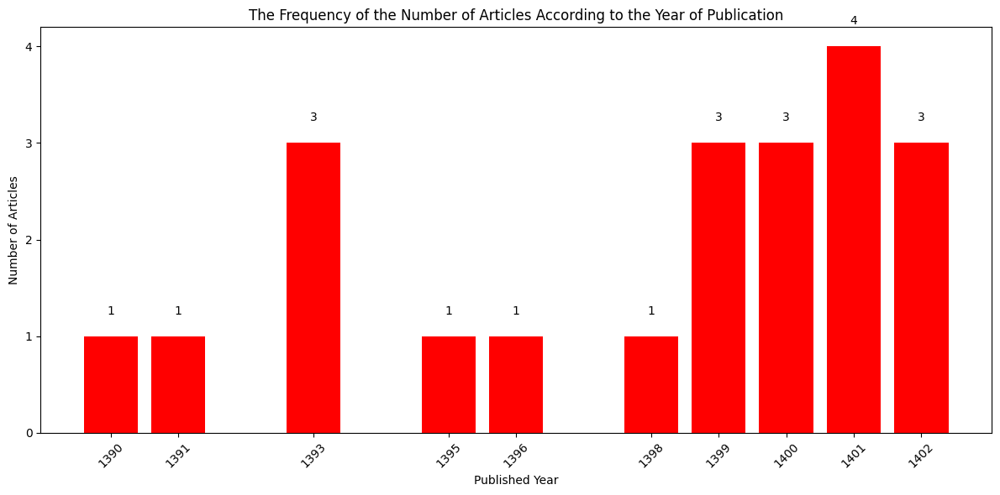

In [ ]:
cluster_four= vocab_tfidf_dataframe[vocab_tfidf_dataframe['cluster'] == 4]
plot_article_frequency(cluster_four, 'red')

### plot for cluster 3

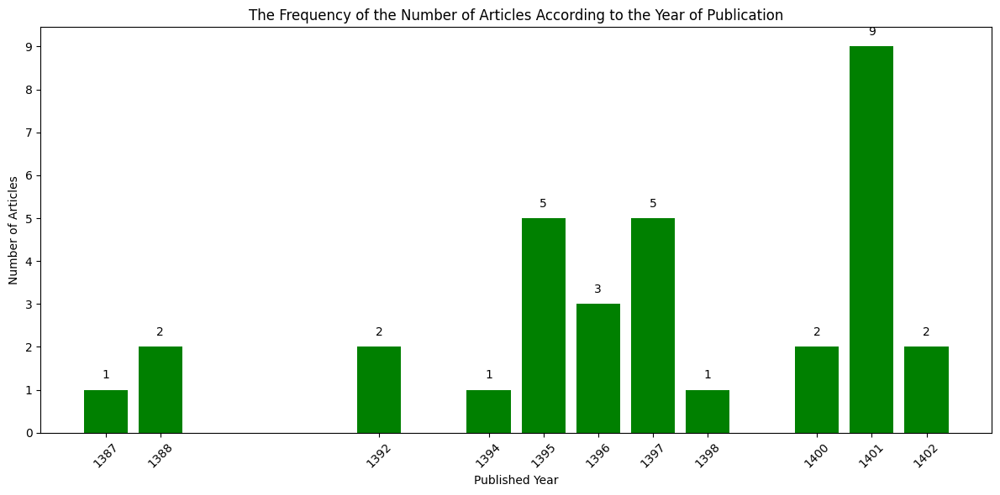

In [ ]:
cluster_three = vocab_tfidf_dataframe[vocab_tfidf_dataframe['cluster'] == 3]
plot_article_frequency(cluster_three, 'green')

#### plot for cluster 2

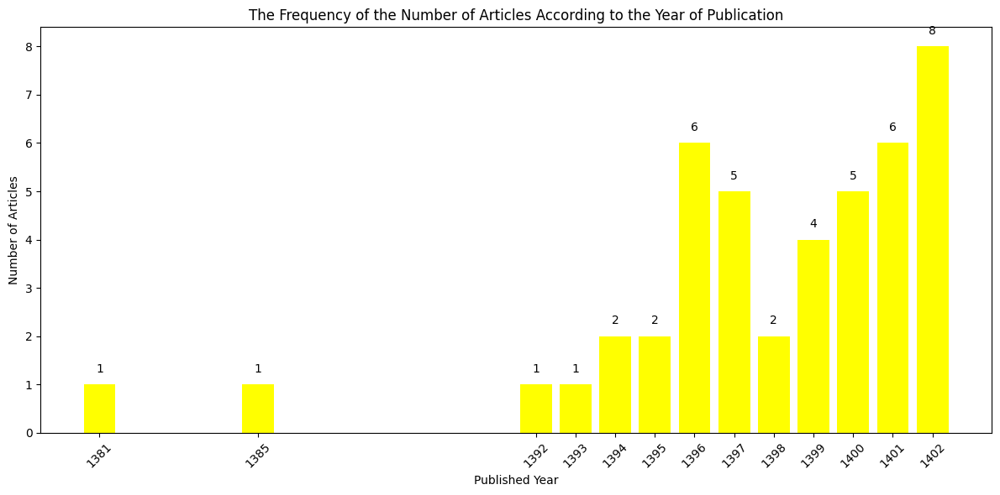

In [ ]:
cluster_two = vocab_tfidf_dataframe[vocab_tfidf_dataframe['cluster'] == 2]
plot_article_frequency(cluster_two, 'yellow')

#### plot for cluster 1

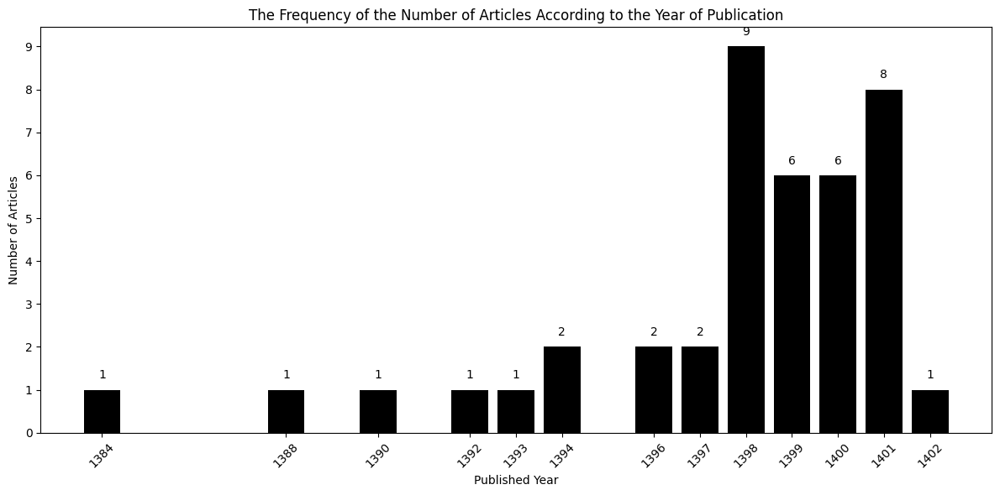

In [ ]:
cluster_one = vocab_tfidf_dataframe[vocab_tfidf_dataframe['cluster'] == 1]
plot_article_frequency(cluster_one, 'black')

#### plot for cluster 0

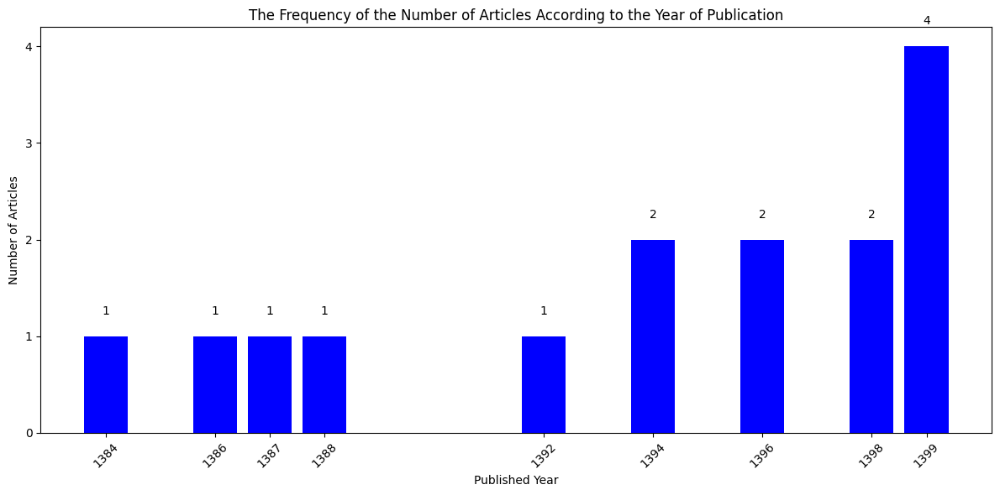

In [ ]:
cluster_zero = vocab_tfidf_dataframe[vocab_tfidf_dataframe['cluster'] == 0]
plot_article_frequency(cluster_zero, 'blue')

### Task 4

#### Plot frequency for each professor

In [ ]:
names_translation = {
    "اباصلت خراسانی": "Abasalt Khorasani",
    "ابراهیم ریحانی": "Ebrahim Rihani",
    "اسماعیل جعفری": "Esmail Jafari",
    "جمیله علم الهدی": "Jamileh Alemolhoda",
    "رضا محمدی چابکی": "Reza Mohammadi Chabaki",
    "محمد قهرمانی": "Mohamad Ghahremani",
    "محمد یمنی دوزی سرخابی": "Mohammad Yamini Dozi Sarkhabi",
    "نسیم اصغری": "Nasim Asghari",
    "زهرا گویا": "Zahra Goya",
    "علی دلاور": "Ali Dalaver",
    "علیرضا کیامنش": "Alireza Kiamanesh",
    "غلامرضا شمس": "Gholamreza Shams",
    "فرنوش اعلامی": "Farnoush Elami",
    "محمود ابوالقاسمی": "Mahmoud Abolghasemi",
    "محمد رضا فدایی": "Mohammad Reza Fadaei",
    "مرتضی رضائی زاده": "Morteza Rezaei Zadeh",
    "کوروش فتحی": "Kourosh Fathi",
    "محبوبه عارفی": "Mahbubeh Arefi",
    " محمدرضا سرمدي": "Mohammadreza Sarmadi"
}

#### translate name of authors to english

In [ ]:
def plot_author_cluster_frequency(data, author_name):
    clusters = list(data[author_name].keys())
    counts = list(data[author_name].values())

    plt.figure(figsize=(12, 5))
    bars = plt.bar(clusters, counts, color='magenta', width=0.1)

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.2, int(yval), ha='center', va='bottom')


    english_name = names_translation.get(author_name, author_name)

    plt.xlabel('Clusters')
    plt.ylabel('Number of Articles')
    plt.title(f'Frequency of Articles for {english_name} by Cluster')
    plt.xticks(rotation=45)
    plt.yticks(range(0, max(counts) + 1))

    plt.tight_layout()
    plt.show()

In [ ]:
author_data = json.loads(res)
type(author_data)

dict

### Abasalt Khorasani

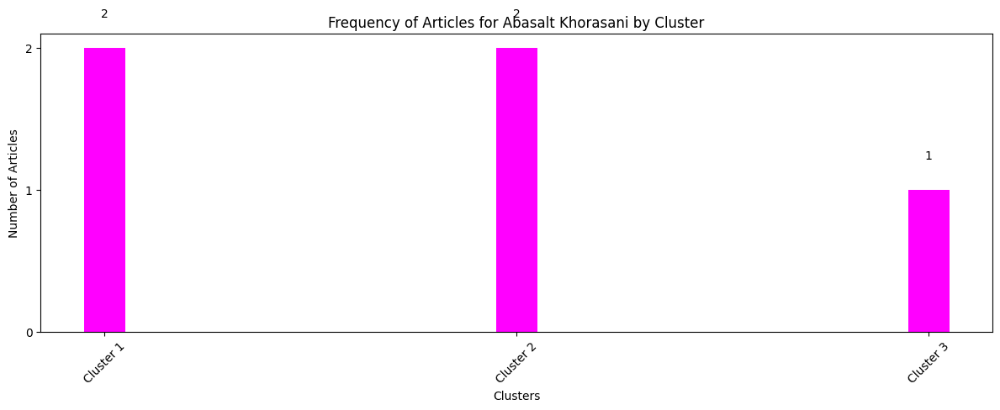

In [ ]:
plot_author_cluster_frequency(author_data, "اباصلت خراسانی")

### Ebrahim Rihani

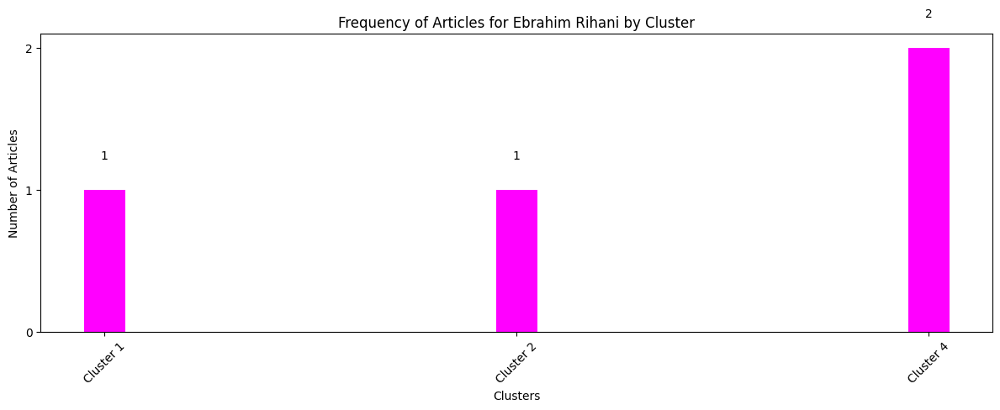

In [ ]:
plot_author_cluster_frequency(author_data, "ابراهیم ریحانی")

### Esmail Jafari

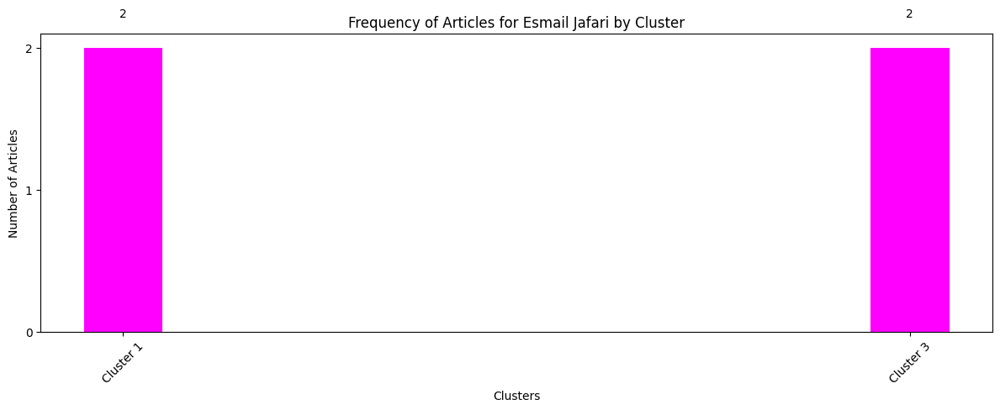

In [ ]:
plot_author_cluster_frequency(author_data, "اسماعیل جعفری")

### Jamileh Alemolhoda

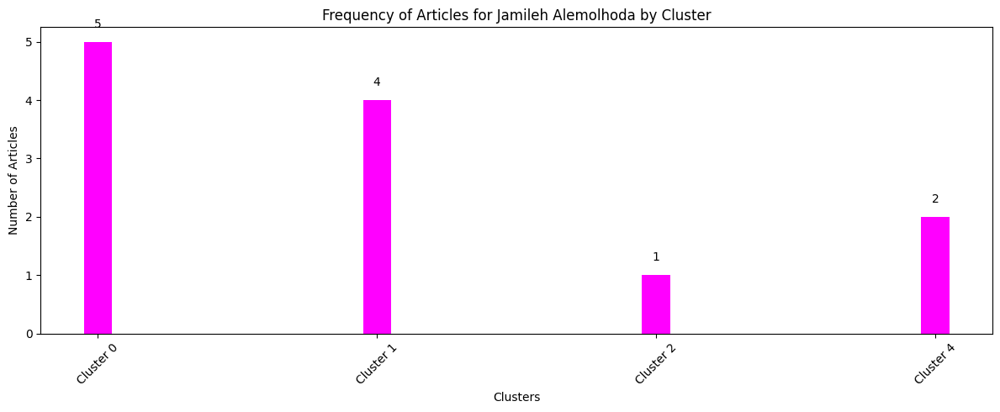

In [ ]:
plot_author_cluster_frequency(author_data, "جمیله علم الهدی")

### Reza Mohammadi Chabaki

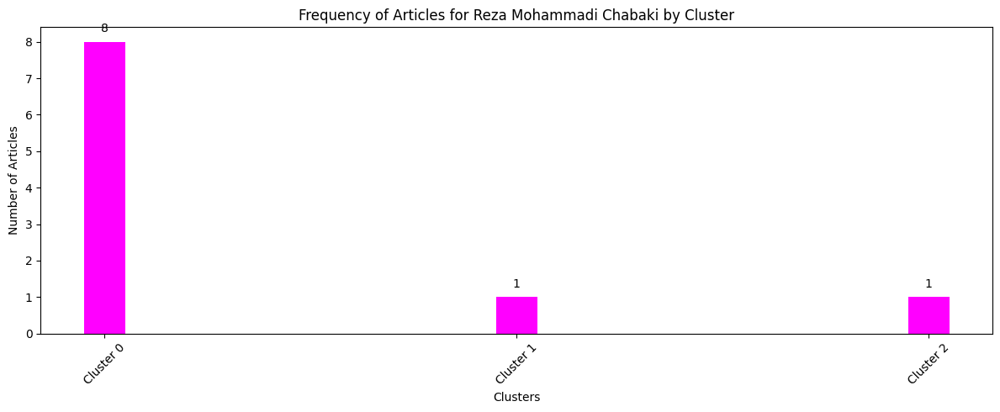

In [ ]:
plot_author_cluster_frequency(author_data, "رضا محمدی چابکی")

### Mohamad Ghahremani

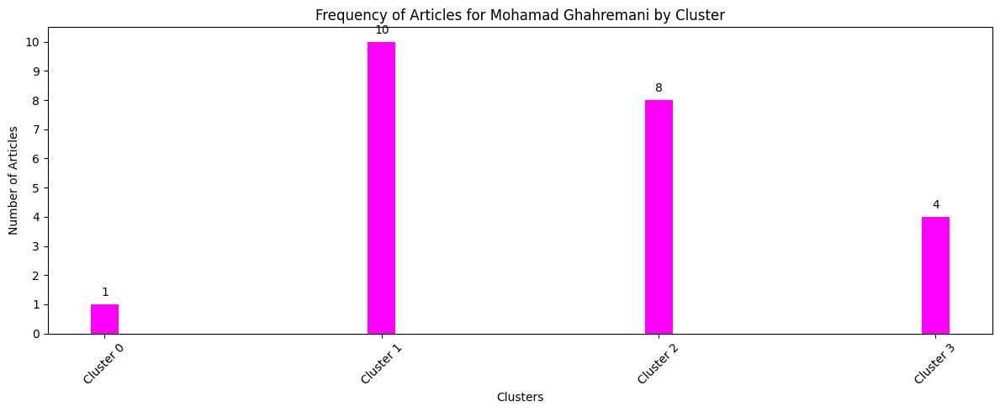

In [ ]:
plot_author_cluster_frequency(author_data, "محمد قهرمانی")

### Mohammad Yamini Dozi Sarkhabi

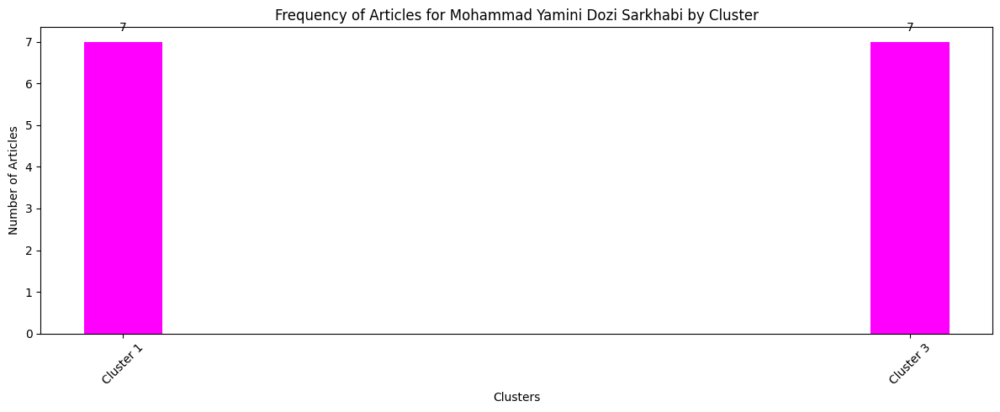

In [ ]:
plot_author_cluster_frequency(author_data, "محمد یمنی دوزی سرخابی")

### Nasim Asghari

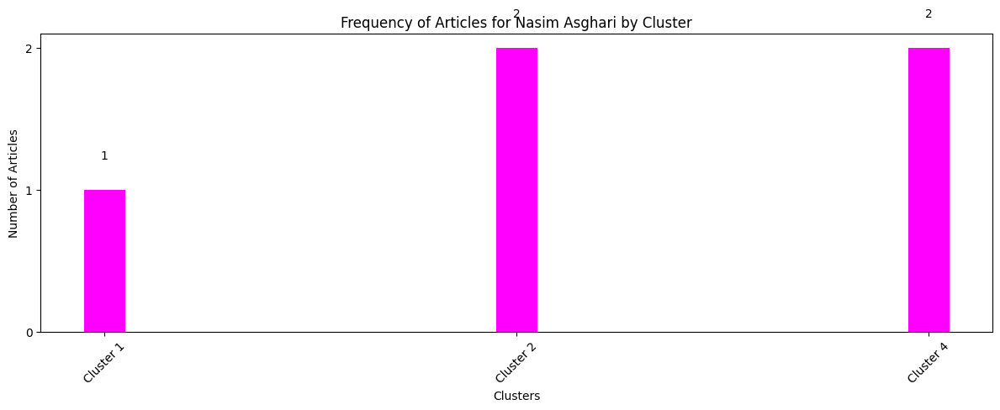

In [ ]:
plot_author_cluster_frequency(author_data, "نسیم اصغری")

### Zahra Goya

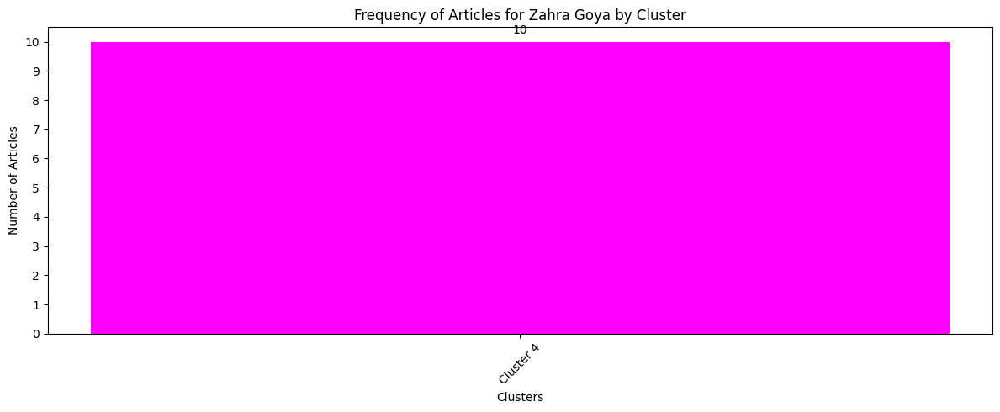

In [ ]:
plot_author_cluster_frequency(author_data, "زهرا گویا")

### Ali Dalaver


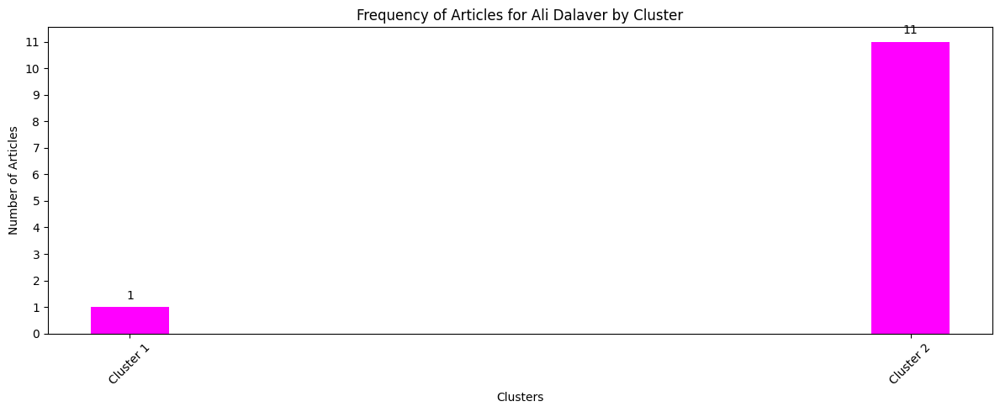

In [ ]:
plot_author_cluster_frequency(author_data, "علی دلاور")

### Alireza Kiamanesh

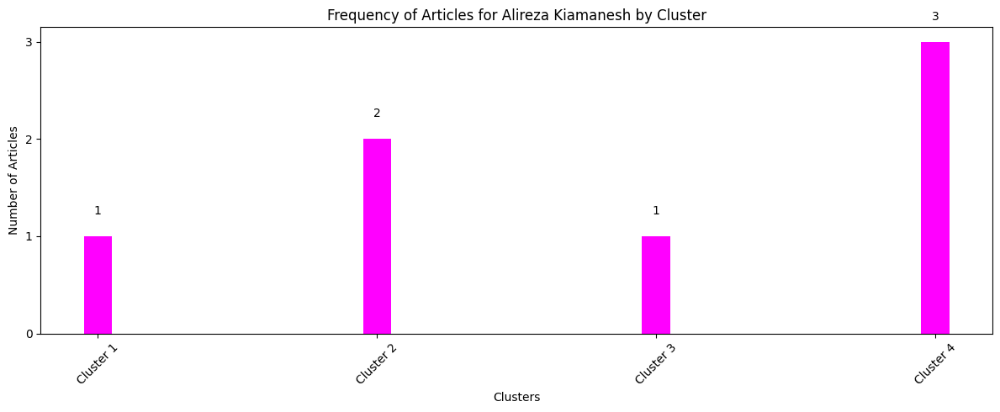

In [ ]:
plot_author_cluster_frequency(author_data, "علیرضا کیامنش")

### Gholamreza Shams

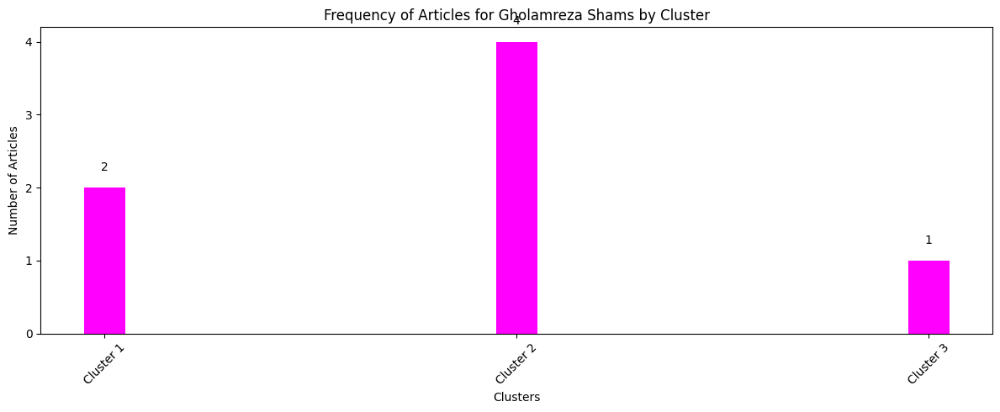

In [ ]:
plot_author_cluster_frequency(author_data, "غلامرضا شمس")

### Farnoush Elami

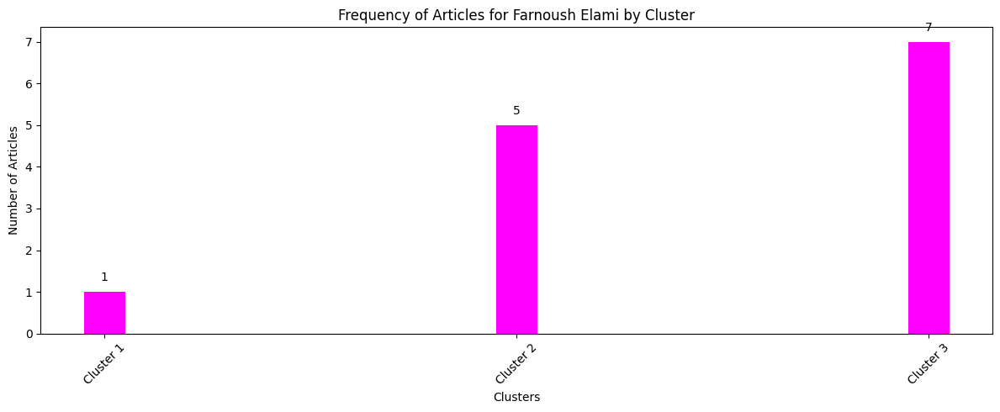

In [ ]:
plot_author_cluster_frequency(author_data, "فرنوش اعلامی")

### Mahmoud Abolghasemi

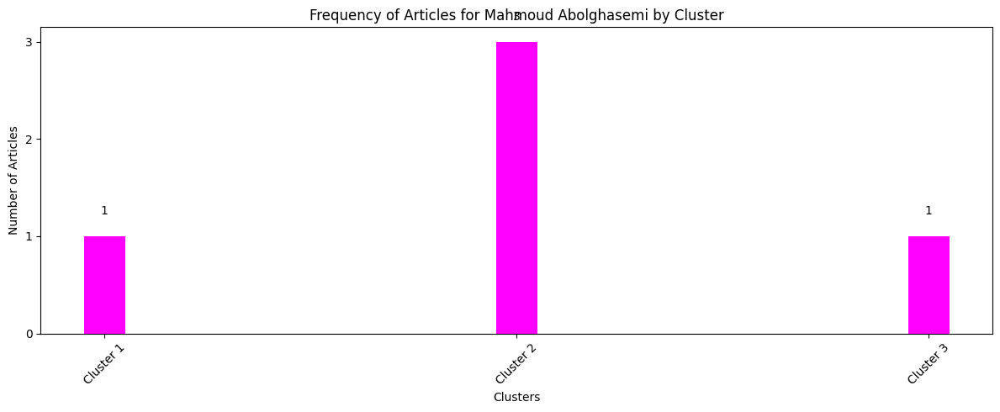

In [ ]:
plot_author_cluster_frequency(author_data, "محمود ابوالقاسمی")

### Mohammad Reza Fadaei

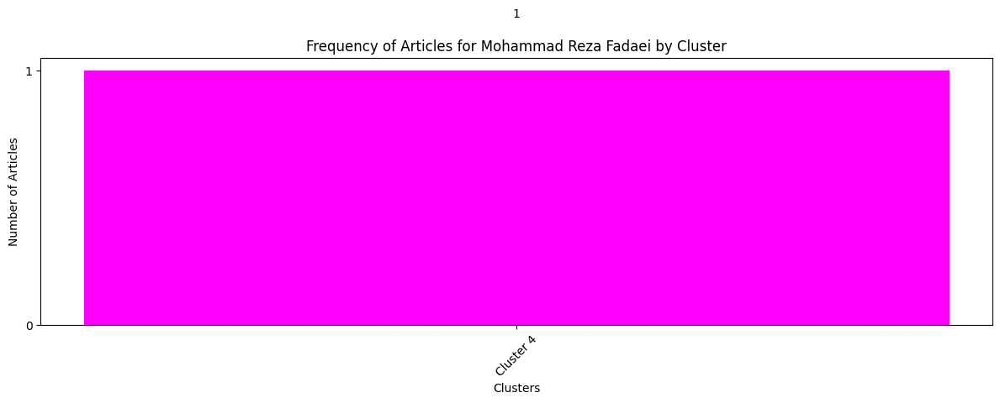

In [ ]:
plot_author_cluster_frequency(author_data, "محمد رضا فدایی")

### Morteza Rezaei Zadeh

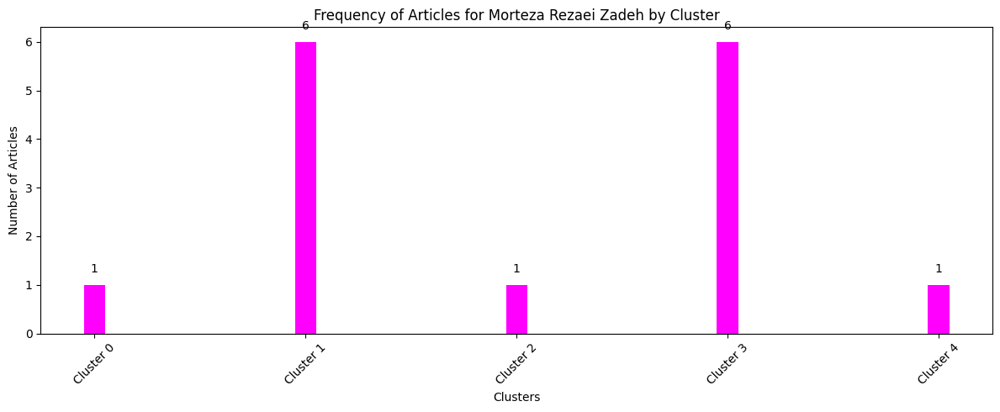

In [ ]:
plot_author_cluster_frequency(author_data, "مرتضی رضائی زاده")

### Kourosh Fathi

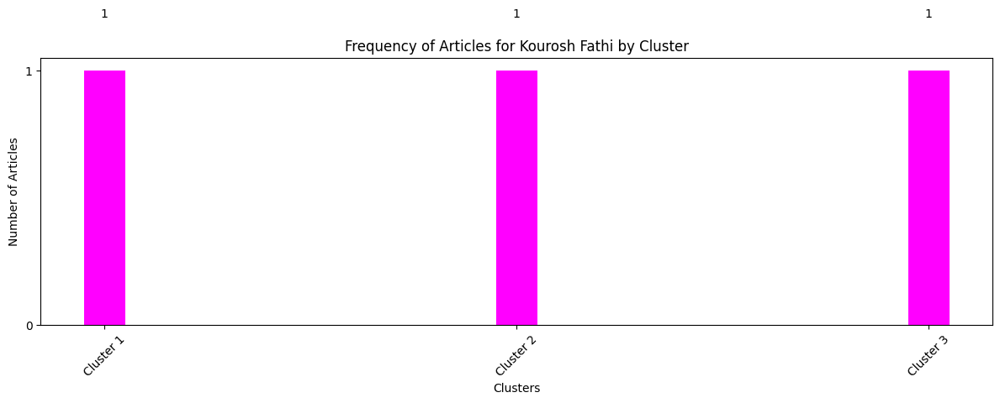

In [ ]:
plot_author_cluster_frequency(author_data, "کوروش فتحی")

### Mahbubeh Arefi

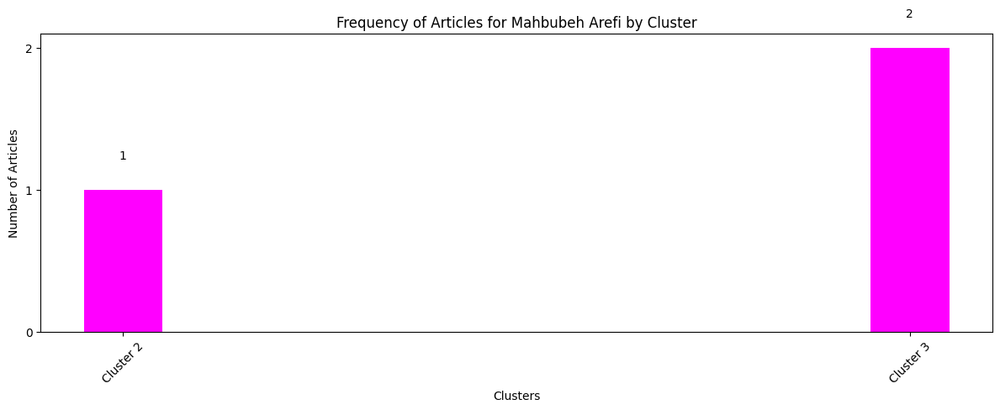

In [ ]:
plot_author_cluster_frequency(author_data, "محبوبه عارفی")

### Mohammadreza Sarmadi

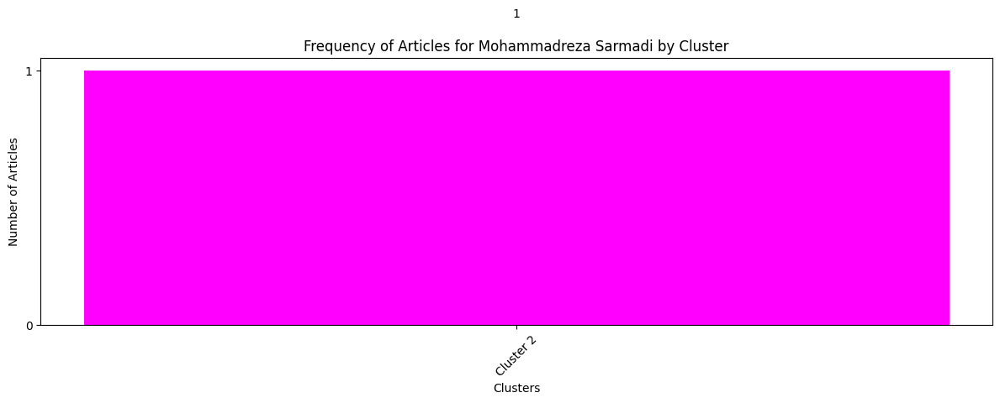

In [ ]:
plot_author_cluster_frequency(author_data," محمدرضا سرمدي")

In [ ]:
cluster_zero

,title,author,citation,download,published_year,label,cluster,cleaned_title
id,,,,,,,,
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,0.0,551.0,1394.0,انقلاب,0,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...
28,مناسبات تربیتی خانواده و دولت,جمیله علم الهدی,1.0,693.0,1388.0,خانواده و دولت - رویکرد اسلامی,0,مناسبات تربیتی خانواده و دولت
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,0.0,301.0,1384.0,مدیریت آموزشی و هدایت تحصیلی,0,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...
33,چرخش از عالم دو قطبی به جهان سه درجه‌ای,جمیله علم الهدی,2.0,659.0,1386.0,تربیت - رویکرد اسلامی,0,چرخش از عالم دو قطبی به جهان سه درجه‌ای
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,0.0,379.0,1399.0,آموزش و سازماندهی دانشگاهی,0,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...
60,مدل ادراک و نگرش معلمان نسبت به توسعه حرفه‌ای ...,محمد قهرمانی,1.0,3644.0,1392.0,مدیریت آموزشی و هدایت تحصیلی,0,مدل ادراک و نگرش معلمان نسبت به توسعه حرفه‌ای ...
78,فهم مساله محور قرآن مبتنی بر رویکرد سازه گرای...,رضا محمدی چابکی,0.0,72.0,1399.0,اسلامی - فهم مسئله محور قرآن,0,\nفهم مساله محور قرآن مبتنی بر رویکرد سازه گرا...
79,مطالعه تطبیقی استعاره تربیتی سفر در عرفان اسلا...,رضا محمدی چابکی,0.0,149.0,1399.0,اسلامی,0,مطالعه تطبیقی استعاره تربیتی سفر در عرفان اسلا...
80,گذار از نظریه به عمل در تربیت اسلامی,رضا محمدی چابکی,0.0,186.0,1398.0,اسلامی,0,\nگذار از نظریه به عمل در تربیت اسلامی


In [ ]:
cluster_one

,title,author,citation,download,published_year,label,cluster
id,,,,,,,
11,بررسی نقش تداوم یادگیری الکترونیکی بر توسعه حر...,فرنوش اعلامی,0.0,382.0,1398.0,آموزش الکترونیکی,1
15,دوره‌های الکترونیکی اثربخش سازمانی: توجه مضاع...,غلامرضا شمس,0.0,0.0,1401.0,آموزش الکترونیکی,1
19,شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...,غلامرضا شمس,0.0,376.0,1398.0,آموزش الکترونیکی,1
24,شناسایی شایستگی‌های رهبران آینده در نظام آموزش...,محمود ابوالقاسمی,0.0,320.0,1402.0,انتخاب افراد شایسته,1
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,0.0,117.0,1399.0,آموزش و سازماندهی دانشگاهی,1
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,310.0,486.0,1398.0,مدیریت آموزشی و هدایت تحصیلی,1
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,جمیله علم الهدی,0.0,599.0,1399.0,آموزش و سازماندهی دانشگاهی - کلاس معکوس,1
37,کلاس معکوس در آموزش عالی ایران: با تاکید بر مز...,جمیله علم الهدی,0.0,2247.0,1401.0,آموزش و سازماندهی دانشگاهی - کلاس معکوس,1
41,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,محمد قهرمانی,0.0,431.0,1400.0,آموزش الکترونیکی,1


In [ ]:
cluster_two

,title,author,citation,download,published_year,label,cluster
id,,,,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,5.0,423.0,1401.0,مدیریت آموزشی و هدایت تحصیلی,2
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,0.0,269.0,1399.0,مدیریت آموزشی و هدایت تحصیلی,2
8,تأثیر آموزش کارآفرینی مبتنی بر فناوری بر توانم...,فرنوش اعلامی,0.0,66.0,1402.0,اشتغال و کارآفرینی,2
12,بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...,فرنوش اعلامی,0.0,1192.0,1396.0,آموزش و سازماندهی دانشگاهی,2
13,مطالعه و ارائه الگوی مفهومی و کاربردی استارت آ...,فرنوش اعلامی,0.0,401.0,1400.0,اشتغال و کارآفرینی,2
14,ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...,غلامرضا شمس,0.0,635.0,1396.0,انتخاب افراد شایسته,2
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,0.0,73.0,1400.0,انتخاب افراد شایسته,2
18,طراحی و اعتباربخشی الگوی مطلوب برنامه درسی رشت...,غلامرضا شمس,0.0,208.0,1398.0,اشتغال و کارآفرینی,2
20,طراحی الگوهای مناسب جهت هدایت تحصیلی دانش آموز...,محمود ابوالقاسمی,1.0,1571.0,1385.0,مدیریت آموزشی و هدایت تحصیلی,2


In [ ]:
cluster_three

,title,author,citation,download,published_year,label,cluster
id,,,,,,,
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,0.0,467.0,1401.0,آموزش و سازماندهی دانشگاهی,3
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,0.0,71.0,1401.0,اشتغال و کارآفرینی,3
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,825.0,339.0,1398.0,مدیریت منابع انسانی و علوم رفتاری,3
6,تجربه زندگی تیم های راه اندازی دانشگاه.,فرنوش اعلامی,8.0,23.0,1401.0,اشتغال و کارآفرینی,3
7,شناسایی ابعاد و مولفه‌های کلیدی اشتغال‌پذیری د...,فرنوش اعلامی,0.0,1253.0,1401.0,اشتغال و کارآفرینی,3
9,بررسی نقش برنامه‌های درسی رشته‌های علوم اجتماع...,فرنوش اعلامی,0.0,209.0,1401.0,اشتغال و کارآفرینی,3
10,تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...,فرنوش اعلامی,0.0,101.0,1401.0,آموزش و سازماندهی دانشگاهی,3
16,شناسایی چالش‌ها و فرصت‌های توسعه سازمانی از طر...,غلامرضا شمس,0.0,1125.0,1401.0,توسعه سازمانی و استفاده از فناوری,3
21,بررسی رابطه میان ساختار سازمانی و کارآفرینی سا...,محمود ابوالقاسمی,4.0,859.0,1388.0,ساختار سازمانی - اشتغال و کارآفرینی,3


In [ ]:
cluster_four

,title,author,citation,download,published_year,label,cluster
id,,,,,,,
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,0.0,286.0,1391.0,آموزش و سازماندهی دانشگاهی,4
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,0.0,391.0,1390.0,آموزش و سازماندهی دانشگاهی,4
96,تدوین الگویی برای برنامه درسی مبتنی بر موک در ...,مرتضی رضائی زاده,0.0,273.0,1396.0,آموزش و سازماندهی دانشگاهی,4
109,بررسي تأثير تدريس معادلات ديفرانسيل بر اساس رو...,نسیم اصغری,0.0,144.0,1401.0,آموزش و سازماندهی دانشگاهی - معادلات دیفرانسیل,4
110,تثبیت درک و عملکرد معلمان ابتدایی از فرآیند طر...,نسیم اصغری,0.0,0.0,1393.0,مدیریت آموزشی و هدایت تحصیلی,4
117,بررسی توانایی دانش آموزان در طرح مسئلهي ریاضی ...,محمد رضا فدایی,NaN,NaN,1395.0,مدیریت آموزشی و هدایت تحصیلی,4
118,بررسی درک دانش آموزان سال پنجم ابتدایی از اعما...,ابراهیم ریحانی,0.0,2671.0,1393.0,مدیریت آموزشی و هدایت تحصیلی,4
119,تحلیل محتوای کتاب‌های درسی ریاضی دوره اول متوس...,ابراهیم ریحانی,0.0,246.0,1393.0,مدیریت آموزشی و هدایت تحصیلی,4
143,تاملی در مولفه های برنامه درسی ریاضی مدرسه ای ...,علیرضا کیامنش,0.0,896.0,1400.0,مدیریت آموزشی و هدایت تحصیلی - ریاضی,4


### Task 5

### SubCluster Clusters

#### 0.Cluster_Zero

##### Preprocess_Cluster_Zero

In [ ]:
cluster_zero['title'] = cluster_zero['title'].astype("string")

cluster_zero['cleaned_title'] = cluster_zero['title'] .apply(lambda x: remove_punctuation(x))

<ipython-input-147-e5d0b0f44f31>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['title'] = cluster_zero['title'].astype("string")
<ipython-input-147-e5d0b0f44f31>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['cleaned_title'] = cluster_zero['title'] .apply(lambda x: remove_punctuation(x))


In [ ]:
cluster_zero['preprocessed_title']= cluster_zero['cleaned_title'].apply(lambda x:preprocess(x))

<ipython-input-153-939126fc7cc7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['preprocessed_title']= cluster_zero['cleaned_title'].apply(lambda x:preprocess(x))


In [ ]:
cluster_zero['suburl_title'] = cluster_zero['preprocessed_title'].apply(sub_url)

<ipython-input-154-f4687cf42598>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['suburl_title'] = cluster_zero['preprocessed_title'].apply(sub_url)


In [ ]:
cluster_zero['suburl_title'] = cluster_zero['suburl_title'].apply(normalizer.normalize)

<ipython-input-155-b84dccfcf847>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['suburl_title'] = cluster_zero['suburl_title'].apply(normalizer.normalize)


In [ ]:
cluster_zero['suburl_title'] = cluster_zero['suburl_title'].apply(stopword)

<ipython-input-156-bc2200f727a9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['suburl_title'] = cluster_zero['suburl_title'].apply(stopword)


In [ ]:
cluster_zero['suburl_title'] = cluster_zero['suburl_title'].apply(tokenizer.tokenize)
title_tokens_cz = cluster_zero['suburl_title'].apply(clear)
cluster_zero['lemmatized_title_tokens'] = n_gram(n=2, tokens=title_tokens_cz)

<ipython-input-157-69839179ff09>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['suburl_title'] = cluster_zero['suburl_title'].apply(tokenizer.tokenize)
<ipython-input-157-69839179ff09>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_zero['lemmatized_title_tokens'] = n_gram(n=2, tokens=title_tokens_cz)


In [ ]:
cluster_zero['lemmatized_title_tokens']

id
26    [ضرورت_تحول, تحول_روش‌شناسی, روش‌شناسی_نظریه, ...
28    [مناسبات_تربیتی, تربیتی_خانواده, خانواده_دولت,...
32    [مبانی_نظری, نظری_تلفیق, تلفیق_درس, درس_حکمت, ...
33    [چرخش_عالم, عالم_قطبی, قطبی_جهان, جهان_درج, چر...
34    [دوره_کارشناسیارشد, کارشناسیارشد_مدیریت, مدیری...
60    [مدل_ادراک, ادراک_نگرش, نگرش_معلمان, معلمان_تو...
78    [فهم_مساله, مساله_محور, محور_قرآن, قرآن_مبتنی,...
79    [مطالعه_تطبیقی, تطبیقی_استعاره, استعاره_تربیتی...
80    [نظریه_تربیت, تربیت_اسلامی, نظریه, تربیت, اسلامی]
81    [رنج_گنج, گنج_تحلیل, تحلیل_رویکرد, رویکرد_سه‌گ...
82    [تبیین_جایگاه, جایگاه_زبان, زبان_تقویت, تقویت_...
83    [تغییر_نقش, نقش_معلم, معلم_مبتنی, مبتنی_نظریه,...
85    [فهم_مسأله, مسأله_محور, محور_قرآن, قرآن_مبتنی,...
86    [تاریخ_فلسفه, فلسفه_تعلیم, تعلیم_تربیت, تربیت_...
97    [نقش_وظیفه, وظیفه_معلم, معلم_محیط, محیط_دیجیتا...
Name: lemmatized_title_tokens, dtype: object

In [ ]:
all_titles_cz = get_all_tokens(cluster_zero['lemmatized_title_tokens'])

In [ ]:
all_titles_cz

['ضرورت_تحول تحول_روششناسی روششناسی_نظریه نظریه_انقلاب انقلاب_تاکید تاکید_تبیین تبیین_انقلاب انقلاب_دید دید_امام امام_علیهالسلام ضرورت تحول روششناسی نظریه انقلاب تاکید تبیین انقلاب دید امام علیهالسلام',
 'مناسبات_تربیتی تربیتی_خانواده خانواده_دولت مناسبات تربیتی خانواده دولت',
 'مبانی_نظری نظری_تلفیق تلفیق_درس درس_حکمت حکمت_متعالیه متعالیه_صدر صدر_الم الم_##الهین مبانی نظری تلفیق درس حکمت متعالیه صدر الم ##الهین',
 'چرخش_عالم عالم_قطبی قطبی_جهان جهان_درج چرخش عالم قطبی جهان درج',
 'دوره_کارشناسیارشد کارشناسیارشد_مدیریت مدیریت_اموزشی اموزشی_ترازوی ترازوی_تحلیل تحلیل_نقد دوره کارشناسیارشد مدیریت اموزشی ترازوی تحلیل نقد',
 'مدل_ادراک ادراک_نگرش نگرش_معلمان معلمان_توسعه توسعه_حرفهای حرفهای_مراکز مراکز_تربیت تربیت_معلم معلم_مطالعه مطالعه_ترکیب مدل ادراک نگرش معلمان توسعه حرفهای مراکز تربیت معلم مطالعه ترکیب',
 'فهم_مساله مساله_محور محور_قران قران_مبتنی مبتنی_رویکرد رویکرد_سازه سازه_گرایی گرایی_واقعگرایانه فهم مساله محور قران مبتنی رویکرد سازه گرایی واقعگرایانه',
 'مطالعه_تطبیقی تطبیقی_استعا

##### TFIDF_Cluster_Zero

In [ ]:
tfidf = TfidfVectorizer(
    min_df=4,
    max_df=0.5,
)

tfidf_matrix = tfidf.fit_transform(all_titles_cz)

tfidf_array = tfidf_matrix.toarray()
tfidf_array

array([[0.        , 1.        ],
       [0.        , 0.        ],
       [0.        , 0.        ],
       [0.        , 0.        ],
       [0.        , 0.        ],
       [1.        , 0.        ],
       [0.        , 0.        ],
       [0.        , 0.        ],
       [0.70710678, 0.70710678],
       [0.        , 0.        ],
       [1.        , 0.        ],
       [0.        , 1.        ],
       [0.        , 0.        ],
       [1.        , 0.        ],
       [0.        , 1.        ]])

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-38-5e181f1c08e0>:6: ConvergenceWarning: Number of dis

Fit 2 clusters with sse 2.6211580100383602
Fit 3 clusters with sse 0.4393398282201787
Fit 4 clusters with sse 7.857794173099922e-32
Fit 5 clusters with sse 3.928897086549961e-32
Fit 6 clusters with sse 1.9644485432749806e-31
Fit 7 clusters with sse 1.9644485432749806e-31
Fit 8 clusters with sse 3.143117669239969e-31


<ipython-input-38-5e181f1c08e0>:6: ConvergenceWarning: Number of distinct clusters (4) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  sse_value = KMeans(init='k-means++', n_clusters=k, random_state=24, max_iter=1000).fit(data).inertia_
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-38-5e181f1c08e0>:6: ConvergenceWarning: Number of distinct clusters (4) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  sse_value = KMeans(init='k-means++', n_clusters=k, random_state=24, max_iter=1000).fit(data).inertia_
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr

array([4, 0, 0, 0, 0, 2, 0, 0, 1, 0, 2, 4, 0, 2, 4], dtype=int32)

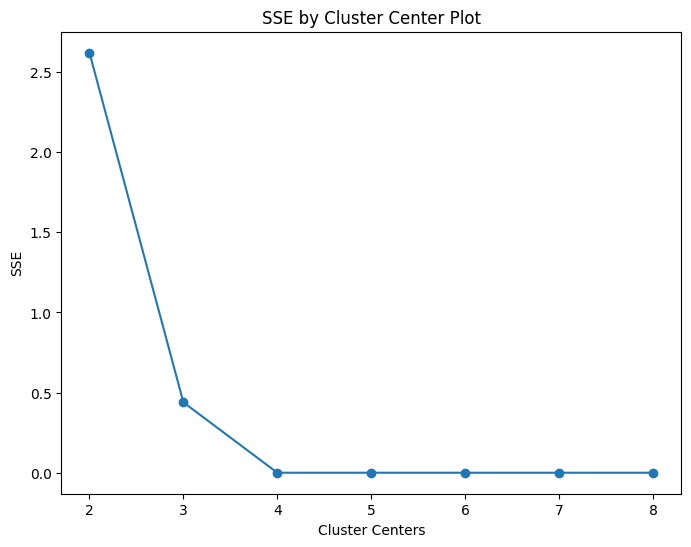

In [ ]:
find_optimal_clusters(tfidf_array, 8)

clusters_tfidf = KMeans(init='k-means++', n_clusters=5, random_state=32).fit_predict(tfidf_array)
clusters_tfidf

In [ ]:
subcluster_cluster_zero = KMeans(init='k-means++', n_clusters=3, random_state=32).fit_predict(tfidf_array)
subcluster_cluster_zero

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([1, 0, 0, 0, 0, 2, 0, 0, 1, 0, 2, 1, 0, 2, 1], dtype=int32)

In [ ]:
title_w2v_on_cluster_zero = pd.DataFrame({'title': cluster_zero['title'], 'author': cluster_zero['author'], 'label': cluster_zero['label'], 'cluster': subcluster_cluster_zero})

In [ ]:
title_w2v_on_cluster_zero

,title,author,label,cluster
id,,,,
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,انقلاب,1
28,مناسبات تربیتی خانواده و دولت,جمیله علم الهدی,خانواده و دولت - رویکرد اسلامی,0
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,0
33,چرخش از عالم دو قطبی به جهان سه درجه‌ای,جمیله علم الهدی,تربیت - رویکرد اسلامی,0
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,0
60,مدل ادراک و نگرش معلمان نسبت به توسعه حرفه‌ای ...,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی,2
78,فهم مساله محور قرآن مبتنی بر رویکرد سازه گرای...,رضا محمدی چابکی,اسلامی - فهم مسئله محور قرآن,0
79,مطالعه تطبیقی استعاره تربیتی سفر در عرفان اسلا...,رضا محمدی چابکی,اسلامی,0
80,گذار از نظریه به عمل در تربیت اسلامی,رضا محمدی چابکی,اسلامی,1


In [ ]:
print(len(title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 0]))
title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 0]

8


,title,author,label,cluster
id,,,,
28,مناسبات تربیتی خانواده و دولت,جمیله علم الهدی,خانواده و دولت - رویکرد اسلامی,0
32,مبانی نظری تلفیق برنامه درسی بر اساس حکمت متعا...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,0
33,چرخش از عالم دو قطبی به جهان سه درجه‌ای,جمیله علم الهدی,تربیت - رویکرد اسلامی,0
34,دوره کارشناسی‌ارشد مدیریت آموزشی در ترازوی تحل...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,0
78,فهم مساله محور قرآن مبتنی بر رویکرد سازه گرای...,رضا محمدی چابکی,اسلامی - فهم مسئله محور قرآن,0
79,مطالعه تطبیقی استعاره تربیتی سفر در عرفان اسلا...,رضا محمدی چابکی,اسلامی,0
81,از رنج تا گنج: تحلیل رویکردهای سه گانه به نقش ...,رضا محمدی چابکی,سختی و رنج,0
85,فهم مسأله محور قرآن مبتنی بر رویکرد سازه‌گرایی...,رضا محمدی چابکی,اسلامی - فهم مسئله محور قرآن,0


In [ ]:
print(len(title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 1]))
title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 1]

4


,title,author,label,cluster
id,,,,
26,ضرورت تحول در روش شناسی نظریه‌های انقلاب با تا...,جمیله علم الهدی,انقلاب,1
80,گذار از نظریه به عمل در تربیت اسلامی,رضا محمدی چابکی,اسلامی,1
83,تغییر نقش معلم مبتنی بر نظریه پیچیدگی: از بازن...,رضا محمدی چابکی,بازنمایی,1
97,نقش و وظیفه معلم در محیط های دیجیتالی بر اساس ...,مرتضی رضائی زاده,ارتباط گرایی - هدایت تحصیلی,1


In [ ]:
print(len(title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 2]))
title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 2]

3


,title,author,label,cluster
id,,,,
60,مدل ادراک و نگرش معلمان نسبت به توسعه حرفه‌ای ...,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی,2
82,تبیین جایگاه زبان در تقویت مبانی، تصریح اهداف ...,رضا محمدی چابکی,مدیریت آموزشی و هدایت تحصیلی - جایگاه زبان,2
86,تاریخ فلسفه تعلیم و تربیت در ایران,رضا محمدی چابکی,فلسفه تعلیم و تربیت,2


In [ ]:
# print(len(title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 3]))
# title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 3]

In [ ]:
# print(len(title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 4]))
# title_w2v_on_cluster_zero[title_w2v_on_cluster_zero['cluster'] == 4]

#### 1.Cluster_One

##### Preprocess_Cluster_One

In [ ]:
cluster_one['title'] = cluster_one['title'].astype("string")

cluster_one['cleaned_title'] = cluster_one['title'] .apply(lambda x: remove_punctuation(x))

cluster_one['preprocessed_title']= cluster_one['cleaned_title'].apply(lambda x:preprocess(x))

cluster_one['suburl_title'] = cluster_one['preprocessed_title'].apply(sub_url)

cluster_one['suburl_title'] = cluster_one['suburl_title'].apply(normalizer.normalize)

cluster_one['suburl_title'] = cluster_one['suburl_title'].apply(stopword)

cluster_one['suburl_title'] = cluster_one['suburl_title'].apply(tokenizer.tokenize)

title_tokens_cone = cluster_one['suburl_title'].apply(clear)
cluster_one['lemmatized_title_tokens'] = n_gram(n=2, tokens=title_tokens_cone)
all_titles_cone = get_all_tokens(cluster_one['lemmatized_title_tokens'])

<ipython-input-168-f56ec605d938>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_one['title'] = cluster_one['title'].astype("string")
<ipython-input-168-f56ec605d938>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_one['cleaned_title'] = cluster_one['title'] .apply(lambda x: remove_punctuation(x))
<ipython-input-168-f56ec605d938>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [ ]:
tfidf = TfidfVectorizer(
    min_df=5,
    max_df=0.2,
)

tfidf_matrix = tfidf.fit_transform(all_titles_cone)

tfidf_array = tfidf_matrix.toarray()
tfidf_array

array([[0.4805056 , 0.        , 0.        , 0.50464295, 0.        ,
        0.        , 0.        , 0.        , 0.4805056 , 0.        ,
        0.        , 0.53250748],
       [1.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.68957485, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.72421442, 0.        , 0.        ,
        0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.59464179, 0.        , 0.54111208,
        0.59464179, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.67303271,
        0.73961271, 0.        ],
       [0.        , 0.        , 0.72294173, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.69090901,
        0.        ,

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 2 clusters with sse 21.95044790324259
Fit 3 clusters with sse 18.23759276721455
Fit 4 clusters with sse 14.910339120375486
Fit 5 clusters with sse 12.545739862861147
Fit 6 clusters with sse 10.237327358170724
Fit 7 clusters with sse 8.142914529324011
Fit 8 clusters with sse 6.812703130440452
Fit 9 clusters with sse 5.534017445527667
Fit 10 clusters with sse 5.000015553565125


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 11 clusters with sse 3.9602328862908953
Fit 12 clusters with sse 3.4761652419341083
Fit 13 clusters with sse 3.0856409501828383
Fit 14 clusters with sse 2.681941122876072
Fit 15 clusters with sse 2.2914168311248027
Fit 16 clusters with sse 1.8648371320901016
Fit 17 clusters with sse 1.5544119797794633
Fit 18 clusters with sse 1.180915636919949
Fit 19 clusters with sse 0.9022006661561379
Fit 20 clusters with sse 0.6850371472249777


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


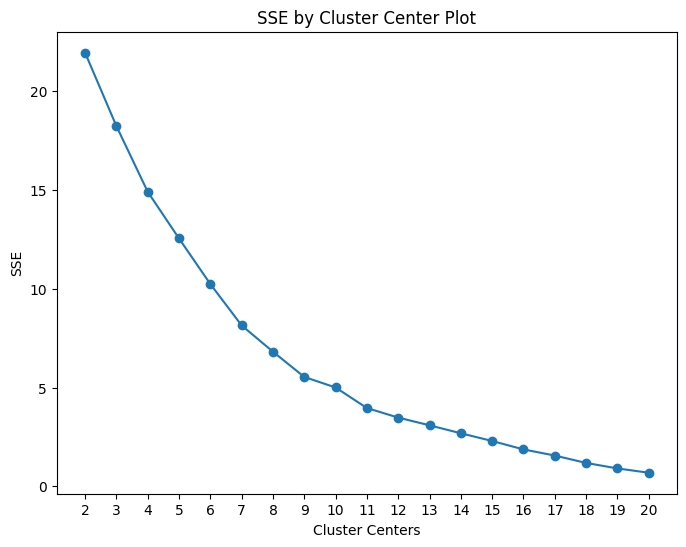

In [ ]:
find_optimal_clusters(tfidf_array, 20)

In [ ]:
subcluster_cluster_one = KMeans(init='k-means++', n_clusters=8, random_state=32).fit_predict(tfidf_array)
subcluster_cluster_one

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([5, 5, 3, 7, 7, 7, 1, 1, 5, 3, 5, 4, 7, 7, 7, 5, 2, 0, 4, 2, 0, 1,
       0, 0, 2, 7, 5, 6, 3, 2, 0, 3, 2, 2, 2, 6, 2, 0, 2, 6, 2],
      dtype=int32)

In [ ]:
len(cluster_one)

41

In [ ]:
title_w2v_on_cluster_one = pd.DataFrame({'title': cluster_one['title'], 'author': cluster_one['author'], 'label': cluster_one['label'], 'cluster': subcluster_cluster_one})

In [ ]:
title_w2v_on_cluster_one

,title,author,label,cluster
id,,,,
11,بررسی نقش تداوم یادگیری الکترونیکی بر توسعه حر...,فرنوش اعلامی,آموزش الکترونیکی,5
15,دوره‌های الکترونیکی اثربخش سازمانی: توجه مضاع...,غلامرضا شمس,آموزش الکترونیکی,5
19,شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...,غلامرضا شمس,آموزش الکترونیکی,3
24,شناسایی شایستگی‌های رهبران آینده در نظام آموزش...,محمود ابوالقاسمی,انتخاب افراد شایسته,7
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,7
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,7
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی - کلاس معکوس,1
37,کلاس معکوس در آموزش عالی ایران: با تاکید بر مز...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی - کلاس معکوس,1
41,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,محمد قهرمانی,آموزش الکترونیکی,5


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 0]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 0]

6


,title,author,label,cluster
id,,,,
62,به‌سازی نظام تصمیم گیری در آموزش و پرورش از دی...,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی,0
66,رضایت دانشجویان از فرآیند انجام پایان نامه و ع...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,0
73,آسیب شناسی ساختاری پردیس خودمختار دانشگاههای د...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,0
74,آسیب شناسی عملکردی پردیس های خودمختار دانشگاه ...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,0
101,پدیدارشناسی تجارب بی‌عدالتی آموزشی و پژوهشی دا...,مرتضی رضائی زاده,آموزش و سازماندهی دانشگاهی - عدالت آموزشی,0
126,مطالعه تجربیات دانشجویان و فارغ‌التحصیلان دانش...,اباصلت خراسانی,قدرت - آموزش و سازماندهی دانشگاهی,0


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 1]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 1]

3


,title,author,label,cluster
id,,,,
36,شناسایی موانع استفاده از کلاس تلنگر در آموزش ع...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی - کلاس معکوس,1
37,کلاس معکوس در آموزش عالی ایران: با تاکید بر مز...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی - کلاس معکوس,1
71,آموزش دانشگاه: یک پدیده غفلت شده در سیستم آموز...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,1


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 2]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 2]

10


,title,author,label,cluster
id,,,,
59,چالش‌های برون‌سپاری آموزش به مؤسسات ارائه دهند...,محمد قهرمانی,آموزش و سازماندهی دانشگاهی,2
65,به دنبال ارزش از طریق یادگیری شبکه ای در زمینه...,محمد یمنی دوزی سرخابی,یادگیری شبکه‌ای,2
75,سبک شناسی نظارت دکتری.,محمد یمنی دوزی سرخابی,انتخاب افراد شایسته - سازماندهی آموزشی,2
94,ابزارهای ارزشیابی یادگیرندگان در محیط یادگیری ...,مرتضی رضائی زاده,آموزش الکترونیکی,2
103,رویکرد کلاس درس معکوس: نرم‌افزارهای نوظهور، کا...,اسماعیل جعفری,آموزش و سازماندهی دانشگاهی - کلاس معکوس,2
104,طراحی نقشه استراتژی و شاخص های اندازه گیری عمل...,اسماعیل جعفری,ارزیابی,2
114,روش‌های آزمایشگاهی جایگزین در تدریس آزمایشگاه ...,نسیم اصغری,مدیریت آموزشی و هدایت تحصیلی,2
122,ارزيابی نقش عامل فردی در انتقال اثربخش آموزش‌ه...,اباصلت خراسانی,مدیریت آموزشی و هدایت تحصیلی,2
129,آموزش چند فرهنگی: تحلیل نظام‌مند ادراک معلمان,کوروش فتحی,چند فرهنگی,2


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 3]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 3]

4


,title,author,label,cluster
id,,,,
19,شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...,غلامرضا شمس,آموزش الکترونیکی,3
42,شناسایی شاخص های اثرگذار در طراحی سامانه موبای...,محمد قهرمانی,آموزش الکترونیکی,3
93,شناسایی نتایج و کارکردهای ابزارهای وب 2.0 در ت...,مرتضی رضائی زاده,آموزش الکترونیکی,3
102,شناسایی و مدلسازی ویژگی‌های شخصیتی تسهیل‌کنندة...,مرتضی رضائی زاده,اشتغال و کارآفرینی,3


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 4]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 4]

2


,title,author,label,cluster
id,,,,
44,آسیب شناسی برنامه های آموزش مداوم پرستاران: یک...,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی - پرستاری,4
64,یک مطالعه تحلیلی از جنبه ها و مؤلفه های تحقیقا...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,4


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 5]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 5]

6


,title,author,label,cluster
id,,,,
11,بررسی نقش تداوم یادگیری الکترونیکی بر توسعه حر...,فرنوش اعلامی,آموزش الکترونیکی,5
15,دوره‌های الکترونیکی اثربخش سازمانی: توجه مضاع...,غلامرضا شمس,آموزش الکترونیکی,5
41,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,محمد قهرمانی,آموزش الکترونیکی,5
43,تعیین کنندگان اثربخشی یادگیری الکترونیکی: مطال...,محمد قهرمانی,آموزش الکترونیکی,5
58,بررسی و ارائه یک الگوی تضمین کیفیت در مراکز یا...,محمد قهرمانی,آموزش الکترونیکی,5
87,عوامل مؤثر بر اثربخشی یادگیری الکترونیکی: تحلی...,مرتضی رضائی زاده,آموزش الکترونیکی,5


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 7]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 7]

7


,title,author,label,cluster
id,,,,
24,شناسایی شایستگی‌های رهبران آینده در نظام آموزش...,محمود ابوالقاسمی,انتخاب افراد شایسته,7
29,تضمین کیفیت نظام آموزش عالی (ماهیت، ضرورت‌ها، ...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,7
30,واکاوی اصول حاکم بر طراحی الگوی مطلوب برنامه‌د...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,7
48,تبیین علی ظرفیت خط مشی های نظام آموزش عالی ایر...,محمد قهرمانی,سیاست - سازماندهی آموزشی,7
51,آسیب شناسی فرایند سیاست پژوهی در نظام آموزش عا...,محمد قهرمانی,سیاست - سازماندهی آموزشی,7
54,بررسی نظام آموزش و توسعه کارکنان در سازمان های...,محمد قهرمانی,اشتغال و کارآفرینی,7
77,آموزه‌های نظریه آشوب در نظام آموزش و برنامه در...,رضا محمدی چابکی,مدیریت آموزشی و هدایت تحصیلی,7


In [ ]:
print(len(title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 6]))
title_w2v_on_cluster_one[title_w2v_on_cluster_one['cluster'] == 6]

3


,title,author,label,cluster
id,,,,
90,بررسی روش های ایجاد تعامل و بهبود مشارکت دانشج...,مرتضی رضائی زاده,آموزش و سازماندهی دانشگاهی,6
121,بررسی چارچوب‌های درک شاگردان از رابطه بین نمود...,ابراهیم ریحانی,مدیریت آموزشی و هدایت تحصیلی,6
142,بررسی بهبود عملکرد و استقلال سبک های حل مساله ...,علی دلاور,آموزش و سازماندهی دانشگاهی - کلاس معکوس,6


#### 2.Cluster_Two

In [ ]:
cluster_two['title'] = cluster_two['title'].astype("string")

cluster_two['cleaned_title'] = cluster_two['title'] .apply(lambda x: remove_punctuation(x))

cluster_two['preprocessed_title']= cluster_two['cleaned_title'].apply(lambda x:preprocess(x))

cluster_two['suburl_title'] = cluster_two['preprocessed_title'].apply(sub_url)

cluster_two['suburl_title'] = cluster_two['suburl_title'].apply(normalizer.normalize)

cluster_two['suburl_title'] = cluster_two['suburl_title'].apply(stopword)

cluster_two['suburl_title'] = cluster_two['suburl_title'].apply(tokenizer.tokenize)

title_tokens_ctwo = cluster_two['suburl_title'].apply(clear)
cluster_two['lemmatized_title_tokens'] = n_gram(n=2, tokens=title_tokens_ctwo)
all_titles_ctwo = get_all_tokens(cluster_two['lemmatized_title_tokens'])

<ipython-input-363-6a0d2b10f1f5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_two['title'] = cluster_two['title'].astype("string")
<ipython-input-363-6a0d2b10f1f5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_two['cleaned_title'] = cluster_two['title'] .apply(lambda x: remove_punctuation(x))
<ipython-input-363-6a0d2b10f1f5>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

In [ ]:
len(cluster_two)

44

In [ ]:
tfidf = TfidfVectorizer(
    min_df=5,
    max_df=0.2,
)

tfidf_matrix = tfidf.fit_transform(all_titles_ctwo)

tfidf_array = tfidf_matrix.toarray()
tfidf_array

array([[0.57583479, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.60402907,
        0.55096568, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.52346208, 0.        , 0.49669769, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.45306326, 0.52346208, 0.        ],
       [0.54862137, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.57548321,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.60649293, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 1.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        ],
    

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 2 clusters with sse 28.59235387266216
Fit 3 clusters with sse 25.989275993610384
Fit 4 clusters with sse 23.71712085210573
Fit 5 clusters with sse 21.29789061345278
Fit 6 clusters with sse 19.47972255533186
Fit 7 clusters with sse 17.572723253828585
Fit 8 clusters with sse 16.124664847746644
Fit 9 clusters with sse 15.096348148040443
Fit 10 clusters with sse 13.125809391870469


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 11 clusters with sse 11.81478851596598
Fit 12 clusters with sse 10.590714069688119
Fit 13 clusters with sse 9.692020604202789
Fit 14 clusters with sse 9.154868582869117
Fit 15 clusters with sse 8.256381012503878
Fit 16 clusters with sse 7.5092651676256
Fit 17 clusters with sse 7.2100658879276
Fit 18 clusters with sse 6.191998020815069
Fit 19 clusters with sse 6.0344652540849095
Fit 20 clusters with sse 5.296414470076387


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


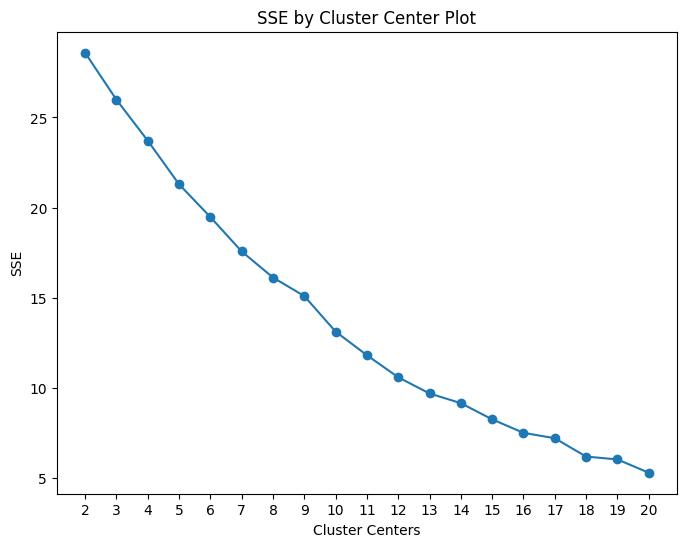

In [ ]:
find_optimal_clusters(tfidf_array, 20)

In [ ]:
subcluster_cluster_two= KMeans(init='k-means++', n_clusters=9, random_state=32).fit_predict(tfidf_array)
subcluster_cluster_two

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([7, 4, 5, 0, 6, 3, 0, 6, 6, 2, 0, 3, 5, 3, 0, 7, 0, 7, 7, 2, 6, 5,
       0, 1, 0, 0, 1, 2, 1, 7, 6, 0, 3, 2, 3, 8, 4, 3, 8, 0, 0, 4, 0, 8],
      dtype=int32)

In [ ]:
title_w2v_on_cluster_two = pd.DataFrame({'title': cluster_two['title'], 'author': cluster_two['author'], 'label': cluster_two['label'], 'cluster': subcluster_cluster_two})

In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 0]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 0]

12


,title,author,label,cluster
id,,,,
12,بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...,فرنوش اعلامی,آموزش و سازماندهی دانشگاهی,0
17,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مربی‌گر...,غلامرضا شمس,انتخاب افراد شایسته,0
23,بررسی نقش و اهمیت مدیران ارشد دانش در توسعه مد...,محمود ابوالقاسمی,آموزش و سازماندهی دانشگاهی,0
47,طراحی و تبیین الگوی صلاحیت‌های حرفه‌ای مدیران ...,محمد قهرمانی,انتخاب افراد شایسته,0
50,ارزشیابی خروجی‌ها، اثرات و پیامدهای پژوهش های ...,محمد قهرمانی,مدیریت - انتخاب افراد شایسته,0
108,ارزیابی جو سازمانی دانشگاه، کیفیت تجارب یادگیر...,محبوبه عارفی,آموزش و سازماندهی دانشگاهی,0
112,ارتقای تفکر تابعی: شناسایی طرح واره‌های پیش ن...,نسیم اصغری,مدیریت آموزشی و هدایت تحصیلی,0
115,مقايسه تأثير روش‌های مختلف ارزشيابی توصيفی بر ...,محمدرضا سرمدي,مدیریت آموزشی و هدایت تحصیلی,0
131,تلگرام در تجربه زیست جوانان بزرگسال شهر تهران,علی دلاور,شبکه‌های اجتماعی,0


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 1]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 1]

3


,title,author,label,cluster
id,,,,
111,ارائه الگویی برای ارتقای توانمندی معلمان دوره ...,نسیم اصغری,مدیریت آموزشی و هدایت تحصیلی,1
116,بررسی فرایند طرح مسئله دانش آموزان دوره ابتدایی,ابراهیم ریحانی,مدیریت آموزشی و هدایت تحصیلی,1
125,آسيب‌شناسی ارزشيابی كيفی-توصيفي دوره ابتدايي د...,اباصلت خراسانی,تاثیر بحران بر آموزش,1


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 2]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 2]

4


,title,author,label,cluster
id,,,,
22,طراحی الگوی تخصیص منابع آموزش عالی در ایران,محمود ابوالقاسمی,مدیریت آموزشی و هدایت تحصیلی,2
57,تدوین الگوی مدیریت استراتژیک آموزش عالی ایران,محمد قهرمانی,آموزش و سازماندهی دانشگاهی,2
124,ارزیابی اثربخشی آموزش‌های سازمانی برای اجرای م...,اباصلت خراسانی,آموزش سازمانی,2
133,شناسایی ابعاد و مولفه‎های شایستگی‎ حرفه‎ای معل...,علی دلاور,انتخاب افراد شایسته,2


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 3]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 3]

6


,title,author,label,cluster
id,,,,
14,ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...,غلامرضا شمس,انتخاب افراد شایسته,3
38,طراحی و اعتباریابی الگوی تربیت توحیدی در دوره ...,جمیله علم الهدی,مدیریت آموزشی و هدایت تحصیلی,3
46,طراحی و اعتباریابی الگوی آسیب شناسی فرایند سیا...,محمد قهرمانی,سیاست - سازماندهی آموزشی,3
132,تدوین و اعتباریابی بسته ی آموزشی مبتنی بر محرک...,علی دلاور,مدیریت آموزشی و هدایت تحصیلی,3
134,طراحی و اعتباریابی الگوی آماده‌سازی دانشجو معل...,علی دلاور,انتخاب افراد شایسته,3
137,تدوین و اعتباریابی برنامه آموزشی مبتنی بر الگو...,علی دلاور,آموزش در دوران بیماری - مدیریت آموزشی و هدایت ...,3


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 4]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 4]

3


,title,author,label,cluster
id,,,,
2,بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی,فرنوش اعلامی,مدیریت آموزشی و هدایت تحصیلی,4
136,بررسی اثر بخشی «آموزش تفکر طراحی» بر توانایی ط...,علی دلاور,مدیریت آموزشی و هدایت تحصیلی,4
141,تاثیر بسته آموزشی مبتنی بر الگوی یادگیری معکوس...,علی دلاور,آموزش و سازماندهی دانشگاهی - کلاس معکوس,4


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 5]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 5]

3


,title,author,label,cluster
id,,,,
8,تأثیر آموزش کارآفرینی مبتنی بر فناوری بر توانم...,فرنوش اعلامی,اشتغال و کارآفرینی,5
45,طراحی مدل تعالی نظام دانشگاهی با تاکید بر بنیا...,محمد قهرمانی,آموزش و سازماندهی دانشگاهی,5
89,نیازهای نوجوانان در رابطه ی والد-فرزندی، یک مط...,مرتضی رضائی زاده,خانواده,5


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 6]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 6]

5


,title,author,label,cluster
id,,,,
13,مطالعه و ارائه الگوی مفهومی و کاربردی استارت آ...,فرنوش اعلامی,اشتغال و کارآفرینی,6
18,طراحی و اعتباربخشی الگوی مطلوب برنامه درسی رشت...,غلامرضا شمس,اشتغال و کارآفرینی,6
20,طراحی الگوهای مناسب جهت هدایت تحصیلی دانش آموز...,محمود ابوالقاسمی,مدیریت آموزشی و هدایت تحصیلی,6
84,بررسی دیدگاه دانش آموزان پایه سوم دوره متوسطه ...,رضا محمدی چابکی,اسلامی - هدایت تحصیلی,6
128,مقایسه دیدگاه‌های مدیران ، معلمان تربیت بدنی و...,کوروش فتحی,مدیریت آموزشی و هدایت تحصیلی,6


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] ==74]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 7]

0


,title,author,label,cluster
id,,,,
1,ارزیابی میزان آمادگی مدارس ابتدایی شهر تهران ب...,فرنوش اعلامی,مدیریت آموزشی و هدایت تحصیلی,7
49,عوامل سازمانی و زمینه ای توسعه حرفه‌ای معلمان ...,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی,7
55,تبیین مدل بومی مدیریت مدارس متوسطه استان کرمان,محمد قهرمانی,مدیریت آموزشی و هدایت تحصیلی,7
56,تحلیل ساختاری اثر سبک رهبری توزیعی بر پیشرفت ت...,محمد قهرمانی,انتخاب افراد شایسته,7
127,رابطه بین رهبری امنیت‌مدار و شادکامی کارکنان م...,غلامرضا شمس,انتخاب افراد شایسته,7


In [ ]:
print(len(title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 8]))
title_w2v_on_cluster_two[title_w2v_on_cluster_two['cluster'] == 8]

3


,title,author,label,cluster
id,,,,
135,اثربخشی آموزش مهارت‌های ذهن آگاهی بر شایستگی ا...,علی دلاور,انتخاب افراد شایسته,8
138,اثربخشی آموزش خردورزی بر هوش معنوی و مولفه‌های...,علی دلاور,هوش معنوی,8
150,اثربخشی آموزش مهارت جرات ورزی بر افزایش انگیزش...,علیرضا کیامنش,مدیریت آموزشی و هدایت تحصیلی,8


#### 3.Cluster_Three

In [ ]:
cluster_three['title'] = cluster_three['title'].astype("string")

cluster_three['cleaned_title'] = cluster_three['title'] .apply(lambda x: remove_punctuation(x))

cluster_three['preprocessed_title']= cluster_three['cleaned_title'].apply(lambda x:preprocess(x))

cluster_three['suburl_title'] = cluster_three['preprocessed_title'].apply(sub_url)

cluster_three['suburl_title'] = cluster_three['suburl_title'].apply(normalizer.normalize)

cluster_three['suburl_title'] = cluster_three['suburl_title'].apply(stopword)

cluster_three['suburl_title'] = cluster_three['suburl_title'].apply(tokenizer.tokenize)

title_tokens_cthree = cluster_three['suburl_title'].apply(clear)
cluster_three['lemmatized_title_tokens'] = n_gram(n=2, tokens=title_tokens_cthree)
all_titles_cthree = get_all_tokens(cluster_three['lemmatized_title_tokens'])

<ipython-input-376-c3bd0e54c8cd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_three['title'] = cluster_three['title'].astype("string")
<ipython-input-376-c3bd0e54c8cd>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_three['cleaned_title'] = cluster_three['title'] .apply(lambda x: remove_punctuation(x))
<ipython-input-376-c3bd0e54c8cd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

In [ ]:
len(cluster_three)

33

In [ ]:
cluster_three['title']

id
2        بررسی تحولات رشته مدیریت آموزشی: یک مطالعه کیفی
7      شناسایی ابعاد و مولفه‌های کلیدی اشتغال‌پذیری د...
9      بررسی نقش برنامه‌های درسی رشته‌های علوم اجتماع...
10     تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...
12     بررسی ساختار عاملی تسهیم دانش، اعتماد سازمانی ...
14     ساخت و اعتباریابی ابزار اندازه‌گیری سبک رهبری ...
16     شناسایی چالش‌ها و فرصت‌های توسعه سازمانی از طر...
19     شناسایی موانع زیرساختی و مدیریتی به کارگیری آم...
28                         مناسبات تربیتی خانواده و دولت
33               چرخش از عالم دو قطبی به جهان سه درجه‌ای
38     طراحی و اعتباریابی الگوی تربیت توحیدی در دوره ...
39     شناسایی الگوی مطلوب نظارت بر پایان‌نامه‌ها مطا...
45     طراحی مدل تعالی نظام دانشگاهی با تاکید بر بنیا...
49     عوامل سازمانی و زمینه ای توسعه حرفه‌ای معلمان ...
55        تبیین مدل بومی مدیریت مدارس متوسطه استان کرمان
56     تحلیل ساختاری اثر سبک رهبری توزیعی بر پیشرفت ت...
57         تدوین الگوی مدیریت استراتژیک آموزش عالی ایران
64     یک مطالعه تحلیلی از ج

In [ ]:
tfidf = TfidfVectorizer(
    min_df=3,
    max_df=0.2,
)

tfidf_matrix = tfidf.fit_transform(all_titles_cthree)

tfidf_array = tfidf_matrix.toarray()
tfidf_array

array([[0.        , 0.51806889, 0.        , 0.        , 0.51806889,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.48125319, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.48125319,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.66258768, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.74898436, 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.70710678, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 2 clusters with sse 24.992695621453404
Fit 3 clusters with sse 22.677352329247743
Fit 4 clusters with sse 20.44797386807786
Fit 5 clusters with sse 18.66281879251789
Fit 6 clusters with sse 16.80948275202976
Fit 7 clusters with sse 14.233851180317597
Fit 8 clusters with sse 12.762816539911041
Fit 9 clusters with sse 10.739976085569081
Fit 10 clusters with sse 9.39083944240748
Fit 11 clusters with sse 8.133506002935086
Fit 12 clusters with sse 7.2907848174364585
Fit 13 clusters with sse 6.4670355840318


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 14 clusters with sse 5.690981065199841


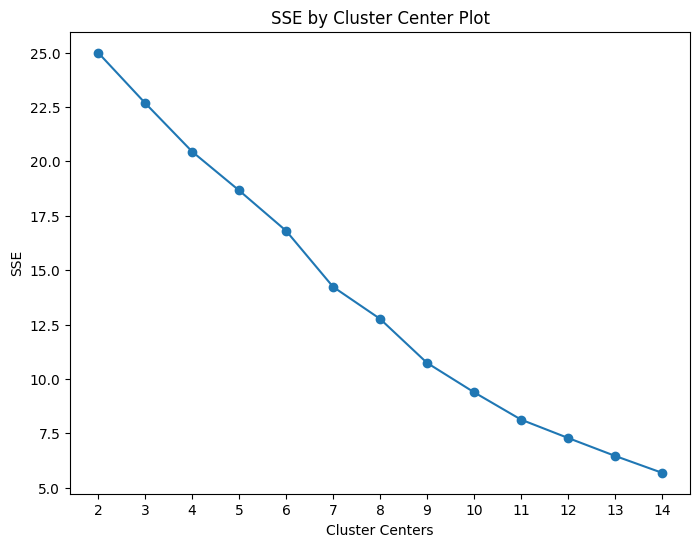

In [ ]:
find_optimal_clusters(tfidf_array, 14)

In [ ]:
subcluster_cluster_three= KMeans(init='k-means++', n_clusters=6, random_state=32).fit_predict(tfidf_array)
subcluster_cluster_three

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([1, 1, 3, 3, 3, 3, 2, 1, 1, 3, 0, 4, 2, 1, 5, 3, 1, 1, 3, 2, 3, 4,
       2, 5, 0, 3, 0, 3, 5, 3, 3, 2, 4], dtype=int32)

In [ ]:
title_w2v_on_cluster_three = pd.DataFrame({'title': cluster_three['title'], 'author': cluster_three['author'], 'label': cluster_three['label'], 'cluster': subcluster_cluster_three})

In [ ]:
print(len(title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 0]))
title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 0]

3


,title,author,label,cluster
id,,,,
39,شناسایی الگوی مطلوب نظارت بر پایان‌نامه‌ها مطا...,محمد قهرمانی,آموزش و سازماندهی دانشگاهی,0
98,شناسایی و رتبه‌بندی موانع مدرسان در آموزش و به...,مرتضی رضائی زاده,آموزش الکترونیکی,0
100,شناسایی و رتبه بندی چالش های یادگیرندگان در آم...,مرتضی رضائی زاده,آموزش الکترونیکی,0


In [ ]:
print(len(title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 1]))
title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 1]

7


,title,author,label,cluster
id,,,,
3,بررسی چالش‌های آموزشی ، پژوهشی و سازمانی اعضای...,فرنوش اعلامی,آموزش و سازماندهی دانشگاهی,1
4,توسعه زیست‌بوم کارآفرینی دانشجویی با رویکرد آز...,فرنوش اعلامی,اشتغال و کارآفرینی,1
16,شناسایی چالش‌ها و فرصت‌های توسعه سازمانی از طر...,غلامرضا شمس,توسعه سازمانی و استفاده از فناوری,1
21,بررسی رابطه میان ساختار سازمانی و کارآفرینی سا...,محمود ابوالقاسمی,ساختار سازمانی - اشتغال و کارآفرینی,1
61,بررسی رابطه‌ی میان ساختار سازمانی و کارآفرینی ...,محمد قهرمانی,اشتغال و کارآفرینی,1
68,استراتژی های توسعه دانشکده بر اساس برنامه های ...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,1
69,نتایج توسعه دانشکده بر اساس برنامه تکامل و نوآ...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,1


In [ ]:
print(len(title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 2]))
title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 2]

5


,title,author,label,cluster
id,,,,
10,تحلیل عملکرد مدیریت منابع انسانی در شناسایی و ...,فرنوش اعلامی,آموزش و سازماندهی دانشگاهی,2
53,تجارب اعضای هیأت علمی از نخستین روزهای تدریس د...,محمد قهرمانی,آموزش و سازماندهی دانشگاهی,2
72,مفهوم سرمایه علمی در زمینه دانشگاهی: چشم انداز...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,2
91,ضرورت و راه کارهای بهبود برنامه درسی دروس عموم...,مرتضی رضائی زاده,آموزش و سازماندهی دانشگاهی,2
130,تجارب اعضای هیأت علمی ‌از نخستین روزهای تدریس ...,کوروش فتحی,آموزش و سازماندهی دانشگاهی,2


In [ ]:
print(len(title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 3]))
title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 3]

12


,title,author,label,cluster
id,,,,
5,تحلیل عوامل دلبستگی شغلی کارکنان دانشگاه شهید ...,فرنوش اعلامی,مدیریت منابع انسانی و علوم رفتاری,3
6,تجربه زندگی تیم های راه اندازی دانشگاه.,فرنوش اعلامی,اشتغال و کارآفرینی,3
7,شناسایی ابعاد و مولفه‌های کلیدی اشتغال‌پذیری د...,فرنوش اعلامی,اشتغال و کارآفرینی,3
9,بررسی نقش برنامه‌های درسی رشته‌های علوم اجتماع...,فرنوش اعلامی,اشتغال و کارآفرینی,3
25,بررسی چالش‌های آموزش عالی بین‌المللی در دانشگا...,محبوبه عارفی,آموزش و سازماندهی دانشگاهی,3
67,تجزیه و تحلیل اثرات ادغام بر فرهنگ دانشگاهی.,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,3
70,تأمل در فعالیت های دانشگاهی در دانشگاه ها از د...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی - کلاس معکوس,3
76,مقایسه اسناد برنامه ریزی استراتژیک در دانشگاه ...,محمد یمنی دوزی سرخابی,انتخاب افراد شایسته - سازماندهی آموزشی,3
99,شناسایی و بررسی عوامل مؤثر بر قابلیت دسترسی سا...,مرتضی رضائی زاده,آموزش الکترونیکی,3


In [ ]:
print(len(title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 4]))
title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 4]

3


,title,author,label,cluster
id,,,,
52,ارزیابی معیارهای موثر بر شایسته یابی و شایسته ...,محمد قهرمانی,انتخاب افراد شایسته - سازماندهی آموزشی,4
88,برنامه‌های بالندگی هیئت علمی دانشگاه شهید بهشت...,مرتضی رضائی زاده,آموزش و سازماندهی دانشگاهی,4
147,مطالعه تطبیقی برنامه‌های رشد و توسعه حرفه‌ای ا...,علیرضا کیامنش,آموزش و سازماندهی دانشگاهی,4


In [ ]:
print(len(title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 5]))
title_w2v_on_cluster_three[title_w2v_on_cluster_three['cluster'] == 5]

3


,title,author,label,cluster
id,,,,
63,عملکرد هیئت امنا در دانشگاه های علوم پزشکی ایا...,محمد یمنی دوزی سرخابی,آموزش و سازماندهی دانشگاهی,5
92,شناسایی و مدلسازی مهم ترین چالش های بکارگیری آ...,مرتضی رضائی زاده,آموزش الکترونیکی,5
106,چالش های سن پس از کنفرانس در آموزش عالی ایران.,اسماعیل جعفری,تاثیر بحران بر آموزش,5


#### 4.Cluster_Four

In [ ]:
len(cluster_four)

21

In [ ]:
cluster_four['title'] = cluster_four['title'].astype("string")

cluster_four['cleaned_title'] = cluster_four['title'] .apply(lambda x: remove_punctuation(x))

cluster_four['preprocessed_title']= cluster_four['cleaned_title'].apply(lambda x:preprocess(x))

cluster_four['suburl_title'] = cluster_four['preprocessed_title'].apply(sub_url)

cluster_four['suburl_title'] = cluster_four['suburl_title'].apply(normalizer.normalize)

cluster_four['suburl_title'] = cluster_four['suburl_title'].apply(stopword)

cluster_four['suburl_title'] = cluster_four['suburl_title'].apply(tokenizer.tokenize)

title_tokens_cfour = cluster_four['suburl_title'].apply(clear)
cluster_four['lemmatized_title_tokens'] = n_gram(n=2, tokens=title_tokens_cfour)
all_titles_cfour = get_all_tokens(cluster_four['lemmatized_title_tokens'])

<ipython-input-423-719d6403e804>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_four['title'] = cluster_four['title'].astype("string")
<ipython-input-423-719d6403e804>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cluster_four['cleaned_title'] = cluster_four['title'] .apply(lambda x: remove_punctuation(x))
<ipython-input-423-719d6403e804>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

In [ ]:
tfidf = TfidfVectorizer(
    min_df=3,
    max_df=0.2,
)

tfidf_matrix = tfidf.fit_transform(all_titles_cfour)

tfidf_array = tfidf_matrix.toarray()
tfidf_array

array([[0.        , 0.        , 0.        , 0.        , 0.56007482,
        0.56007482, 0.        , 0.        , 0.61043623, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        1.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.        , 0.        , 0.89442719, 0.        , 0.        ,
        0.        , 0.4472136 , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.42541965, 0.39032224,
        0.39032224, 0.        , 0.        , 0.42541965, 0.        ,
        0.42541965, 0.        , 0.        , 0.        , 0.39032224,
        0.        , 0.        ],
       [0.48865306, 0.        , 0.        , 0.      

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Fit 2 clusters with sse 14.68818952662373
Fit 3 clusters with sse 12.230754628793989
Fit 4 clusters with sse 10.226379750821017
Fit 5 clusters with sse 7.449270596015582
Fit 6 clusters with sse 6.298213371015743
Fit 7 clusters with sse 5.027984616741447
Fit 8 clusters with sse 4.202331756268573
Fit 9 clusters with sse 3.762305470791559
Fit 10 clusters with sse 2.811751477278267
Fit 11 clusters with sse 2.299520554318129
Fit 12 clusters with sse 1.7130458914347777
Fit 13 clusters with sse 1.2241409729463006
Fit 14 clusters with sse 0.8257324387565961


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


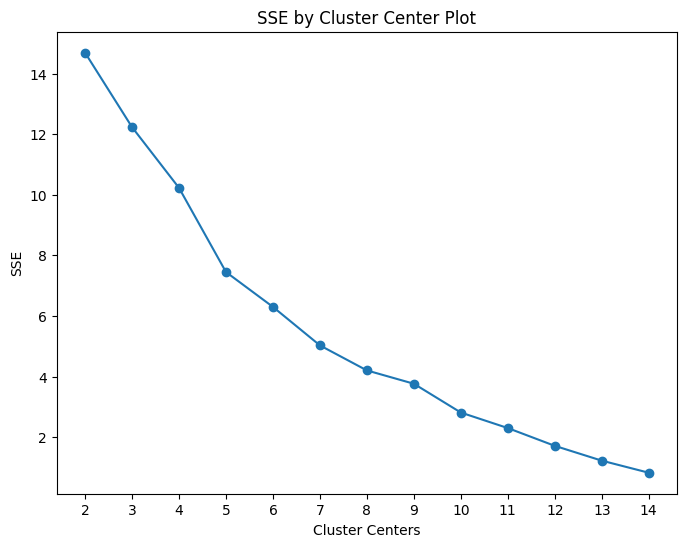

In [ ]:
find_optimal_clusters(tfidf_array, 14)

In [ ]:
subcluster_cluster_four = KMeans(init='k-means++', n_clusters=5, random_state=32).fit_predict(tfidf_array)
subcluster_cluster_four

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([4, 4, 3, 4, 2, 0, 0, 2, 1, 4, 4, 3, 4, 0, 3, 4, 1, 2, 1, 4, 2],
      dtype=int32)

In [ ]:
title_w2v_on_cluster_four = pd.DataFrame({'title': cluster_four['title'], 'author': cluster_four['author'], 'label': cluster_four['label'], 'cluster': subcluster_cluster_four})

In [ ]:
cluster_four['title']

id
27     تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...
31     کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...
96     تدوین الگویی برای برنامه درسی مبتنی بر موک در ...
109    بررسي تأثير تدريس معادلات ديفرانسيل بر اساس رو...
110    تثبیت درک و عملکرد معلمان ابتدایی از فرآیند طر...
117    بررسی توانایی دانش آموزان در طرح مسئلهي ریاضی ...
118    بررسی درک دانش آموزان سال پنجم ابتدایی از اعما...
119    تحلیل محتوای کتاب‌های درسی ریاضی دوره اول متوس...
143    تاملی در مولفه های برنامه درسی ریاضی مدرسه ای ...
144    تاثیر بسته آموزشی توانمندسازی با رویکرد خودتعی...
145    طراحی و تدوین بسته آموزشی توانمندسازی (با رویک...
151    آموزش استم: چارچوبی برای رویارویی با بحران رشت...
152    چالش‌های یادگیری ریاضی دانشجویان در دانشگاه ال...
153    اصول طرح پژوهش در برنامه درسی: دقت، مرتبط بودن...
154    دانش‌های مورد نیاز آموزش‌گران ریاضی جهت آماده‌...
155    تجربه زیسته یک متخصص برنامه درسی ریاضی در تلفی...
156    تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...
157    چالش های اجرای ارزشیا

In [ ]:
print(len(title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 0]))
title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 0]

3


,title,author,label,cluster
id,,,,
117,بررسی توانایی دانش آموزان در طرح مسئلهي ریاضی ...,محمد رضا فدایی,مدیریت آموزشی و هدایت تحصیلی,0
118,بررسی درک دانش آموزان سال پنجم ابتدایی از اعما...,ابراهیم ریحانی,مدیریت آموزشی و هدایت تحصیلی,0
153,اصول طرح پژوهش در برنامه درسی: دقت، مرتبط بودن...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی,0


In [ ]:
print(len(title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 1]))
title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 1]

3


,title,author,label,cluster
id,,,,
143,تاملی در مولفه های برنامه درسی ریاضی مدرسه ای ...,علیرضا کیامنش,مدیریت آموزشی و هدایت تحصیلی - ریاضی,1
156,تاملی در مولفه‌های برنامه درسی ریاضی مدرسه ای ...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,1
158,ارتقای سواد مالی و تصمیم‌گیری مالی از طریق برن...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,1


In [ ]:
print(len(title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 2]))
title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 2]

4


,title,author,label,cluster
id,,,,
110,تثبیت درک و عملکرد معلمان ابتدایی از فرآیند طر...,نسیم اصغری,مدیریت آموزشی و هدایت تحصیلی,2
119,تحلیل محتوای کتاب‌های درسی ریاضی دوره اول متوس...,ابراهیم ریحانی,مدیریت آموزشی و هدایت تحصیلی,2
157,چالش های اجرای ارزشیابی توصیفی درس ریاضی در دو...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,2
160,ضرورت تدوین معیارهای روبریک کیفی برای اجرای مو...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,2


In [ ]:
print(len(title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 3]))
title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 3]

3


,title,author,label,cluster
id,,,,
96,تدوین الگویی برای برنامه درسی مبتنی بر موک در ...,مرتضی رضائی زاده,آموزش و سازماندهی دانشگاهی,3
151,آموزش استم: چارچوبی برای رویارویی با بحران رشت...,زهرا گویا,آموزش و سازماندهی دانشگاهی - ریاضی,3
154,دانش‌های مورد نیاز آموزش‌گران ریاضی جهت آماده‌...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی,3


In [ ]:
print(len(title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 4]))
title_w2v_on_cluster_four[title_w2v_on_cluster_four['cluster'] == 4]

8


,title,author,label,cluster
id,,,,
27,تجارب دانشجویان دکتری ریاضی از تاثیر تربیتی اس...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,4
31,کالبدشکافی دانش محتوایی-تربیتی به عنوان نوعی د...,جمیله علم الهدی,آموزش و سازماندهی دانشگاهی,4
109,بررسي تأثير تدريس معادلات ديفرانسيل بر اساس رو...,نسیم اصغری,آموزش و سازماندهی دانشگاهی - معادلات دیفرانسیل,4
144,تاثیر بسته آموزشی توانمندسازی با رویکرد خودتعی...,علیرضا کیامنش,تاثیر جنسیت بر آموزش,4
145,طراحی و تدوین بسته آموزشی توانمندسازی (با رویک...,علیرضا کیامنش,مدیریت آموزشی و هدایت تحصیلی,4
152,چالش‌های یادگیری ریاضی دانشجویان در دانشگاه ال...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,4
155,تجربه زیسته یک متخصص برنامه درسی ریاضی در تلفی...,زهرا گویا,تاثیر بحران بر آموزش - ریاضی,4
159,تاثیر استفاده از راهبرد رسم شکل در حل مسائل کل...,زهرا گویا,مدیریت آموزشی و هدایت تحصیلی - ریاضی,4
